In [1]:
#imports
import sys 
import pprint
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit
from scipy.signal import find_peaks
import scipy.ndimage as filters
import uproot as ur4
from tqdm import tqdm

sys.path.append("./pythonlibs/")
import py_modules_load as py_load
import py_modules_fits as py_fit
import py_modules_calib as py_calib
import py_modules_plot as py_plot
import py_modules_enviroment as py_envir

In [2]:
AllVDictonary = {}
FullCalib = {}

In [ ]:
# #Loads Raw Data
# path_list = ["../Data/Calibration/a1_2.05_Vpp/26.00V/Analysis.root"]
# if len(path_list)==0:
#     path_list = py_load.load_file_list()
    
# for enum,path in enumerate(path_list):
#     treenames = []
#     branchnames = ["EventID"]
#     for i_event in range(1,101):
#         treenames.append("Event;{}".format(i_event))

#     for i_channel in range(0,16):
#         branchnames.append("Data_ch{}".format(i_channel))
#     branchnames.append("Trigger_data_g0")
#     branchnames.append("Trigger_data_g1")

#     result = py_load.read_root_file(path, treenames, branchnames)
#     AllDictonary[26+0.25*enum] = result

In [3]:
# Loads Analysis Data
for id in ["a1","a2","a3","a4","a5","a6","d2","d4","d6"]:
    path_list = []
    result = {}
    AllVDictonary = {}
    for setvolt in range(2600,3001,25):
        path_list.append("../Data/Calibration/{}_2.05_Vpp/{:.2f}V/Analysis.root".format(id,setvolt/100))

    for enum,path in enumerate(path_list):
        treenames = ["TTree_Analysis_PHD;1","TTree_Analysis_TTS;1","TTree_Analysis_Charge;1"]
        bname = ["PulseHeight","TTS","Charge"]
        for i_tree,tree in enumerate(treenames):
            branchnames = []
            for i_channel in range(0,16):
                branchnames.append("{}_Ch{}".format(bname[i_tree],i_channel))

            result = py_load.read_root_file(path, [tree], branchnames)
            if result ==False:
                continue
            if (26+0.25*enum) not in AllVDictonary:
                AllVDictonary.update({(26+0.25*enum):result})
            else:
                AllVDictonary[26+0.25*enum].update(result)

    FullCalib[id] = (AllVDictonary)

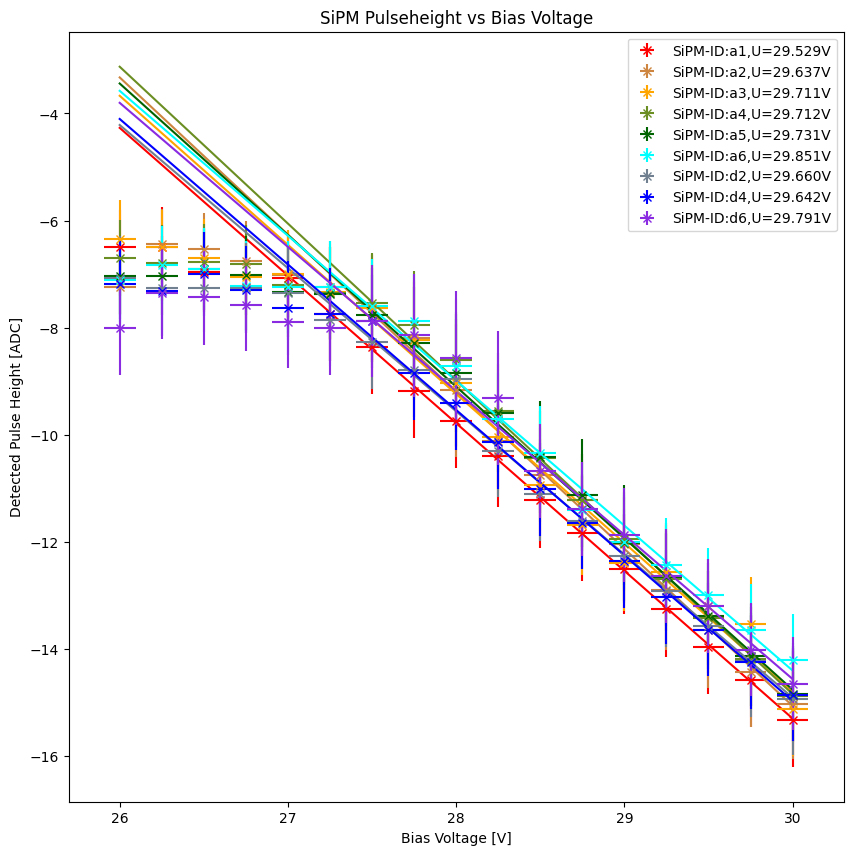

In [4]:
ped_list = []
ped_err_list = []
spe_list = []
spe_err_list = []
dpe_list = []
dpe_err_list = []
id_list = ["a1","a2","a3","a4","a5","a6","d2","d4","d6"]
for id in id_list:
    volt,pedestal,spe,dpe,ped_err,spe_err,dpe_err = py_calib.GetCalibrationCurve(FullCalib[id],False,id,-1)
    ped_list.append(pedestal)
    ped_err_list.append(ped_err)
    spe_list.append(spe)
    spe_err_list.append(spe_err)
    dpe_list.append(dpe)
    dpe_err_list.append(dpe_err)

data = [volt, spe_list, spe_err_list]
py_calib.GetVoltageValues(-14,data,id_list)

In [ ]:
#Loads Analysis Data for pos switch
for ch in range(3,9):
    result = {}
    AllVDictonary = {}
    path = "../Data/Calibration/FullArray/ch{}/Analysis.root".format(ch)

    treenames = ["TTree_Analysis_PHD;1","TTree_Analysis_TTS;1","TTree_Analysis_Charge;1"]
    bname = ["PulseHeight","TTS","Charge"]
    for i_tree,tree in enumerate(treenames):
        branchnames = []
        for i_channel in range(0,16):
            branchnames.append("{}_Ch{}".format(bname[i_tree],i_channel))

            result = py_load.read_root_file(path, [tree], branchnames)
            if result ==False:
                continue
            if ch not in AllVDictonary:
                AllVDictonary.update({ch:result})
            else:
                AllVDictonary[ch].update(result)
    try:
        FullCalib["a1"].update(AllVDictonary)
    except KeyError:
        FullCalib.update({"a1":AllVDictonary})


ped_list = []
ped_err_list = []
spe_list = []
spe_err_list = []
dpe_list = []
dpe_err_list = []

id_list = ["a1"]
for id in id_list:
    volt,pedestal,spe,dpe,ped_err,spe_err,dpe_err = py_calib.GetCalibrationCurve(FullCalib[id],True,id,0)
    ped_list.append(pedestal)
    ped_err_list.append(ped_err)
    spe_list.append(spe)
    spe_err_list.append(spe_err)
    dpe_list.append(dpe)
    dpe_err_list.append(dpe_err)


In [ ]:
# Get Enviroment Data
def PlotVoltageEvolution(file_path):    
    with open(file_path, 'r') as file:
        path_list = file.read().splitlines()

    dict = {0:[],1:[],2:[],3:[],4:[],5:[],6:[],7:[]}

    for enum,entry in enumerate(path_list):
        if len(entry)==0:
            continue
        date,channel,value = entry.split(";")

        if "\x00" in value:
            value = value.replace("\x00","")

        if int(channel) not in dict:
            dict.update({int(channel):[]})
        else:
            dict[int(channel)].append(float(value))

    fig = plt.figure(0,figsize=[20,10], facecolor='white')
    for i in range(0,8):
        plt.plot(dict[i],label='CH-{}'.format(i))
    plt.xlim([None,None])
    plt.legend()


#py_envir.GetVoltageStability("../Data/Calibration/envi_calibrow/voltage.log")
PlotVoltageEvolution("../Data/Calibration/FullArray/voltage.log")

In [ ]:
treenames = []
for i in range(1,100):
    treenames.append("Event;{}".format(i))

branchnames = []
for i in range(0,16):
    branchnames.append("Data_ch{}".format(i))
branchnames.append("Trigger_data_g0")
branchnames.append("Trigger_data_g1")
events = py_load.load_events("../Data/Calibration/optimal_V/a1_new/ch4/RawData.root",treenames,branchnames)

#pprint.pprint(events)

for event,data in events.items():
    fig = plt.figure(figsize=[10,10], facecolor='white')
    plt.title(event)
    for enum, (channel, waveform) in enumerate(data.items()):
        if channel == "Trigger_data_g0" or channel == "Trigger_data_g1":
            plt.plot(waveform/50,label=channel)
        else:
            plt.plot(waveform+20*enum,label=channel+" {:.2f}".format(np.min(waveform[200:500])))
            plt.plot(200+np.where(waveform[200:500]==np.min(waveform[200:500]))[0][0],np.min(waveform[200:500])+20*enum,'rx')
    plt.axvline(x=200,c='r',linestyle='--')
    plt.axvline(x=500,c='r',linestyle='--')
    plt.legend(loc='center right', bbox_to_anchor=(1.25, 0.5))
    plt.show()


In [ ]:
#Loads Analysis Data for channel charge map
result = {}
AllVDictonary = {}
path = "../Data/Calibration/FullArray/Analysis_bck.root"

treenames = ["TTree_Analysis_PHD;1","TTree_Analysis_TTS;1","TTree_Analysis_Charge;1"]
bname = ["PulseHeight","TTS","Charge"]
for i_tree,tree in enumerate(treenames):
    branchnames = []
    for i_channel in range(0,16):
        branchnames.append("{}_Ch{}".format(bname[i_tree],i_channel))

        result = py_load.read_root_file(path, [tree], branchnames)
        if result == False:
            continue
        if 0 not in AllVDictonary:
            AllVDictonary.update(result)
        else:
            AllVDictonary.update(result)

#pprint.pprint(AllVDictonary)

pedestal,spe,dpe,ped_err,spe_err,dpe_err = py_calib.GetChargeSpectra(AllVDictonary)


In [ ]:
# Hitmap/Multiplicity
treenames = []
file = "../Data/Calibration/FullArray/RawData.root"
tmp_file = ur4.open(file)
number_of_events = 500#len(tmp_file.keys())
tmp_file.close()
print("Got {} events".format(number_of_events))
for i in tqdm(range(1,number_of_events+1),desc='Eventlist'):
    treenames.append("Event;{}".format(i))

branchnames = []
for i in range(0,16):
    branchnames.append("Data_ch{}".format(i))
branchnames.append("Trigger_data_g0")
branchnames.append("Trigger_data_g1")
events = py_load.load_events(file,treenames,branchnames)

#pprint.pprint(events)

Event: 500it [00:01, 315.99it/s]


[0, 0, -14.311767578125, 0, -27.902587890625, -11.58056640625, -13.856689453125, -11.365478515625]


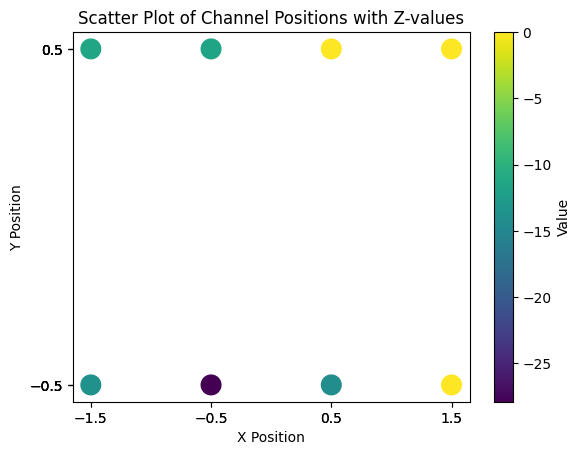

[0, 0, -8.109130859375, -32.9697265625, 0, -22.707763671875, 0, 0]


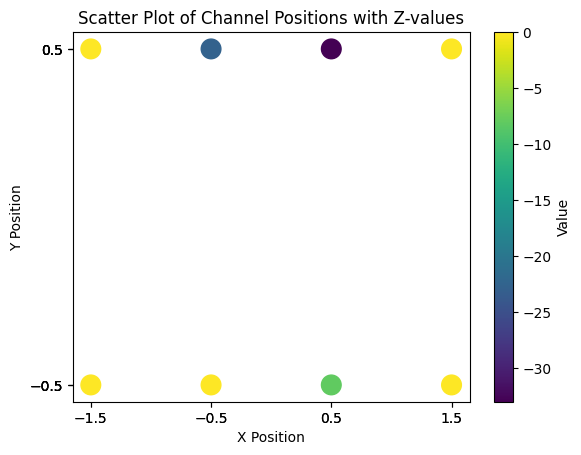

[0, 0, -9.330078125, 0, -16.845703125, -34.431396484375, 0, 0]


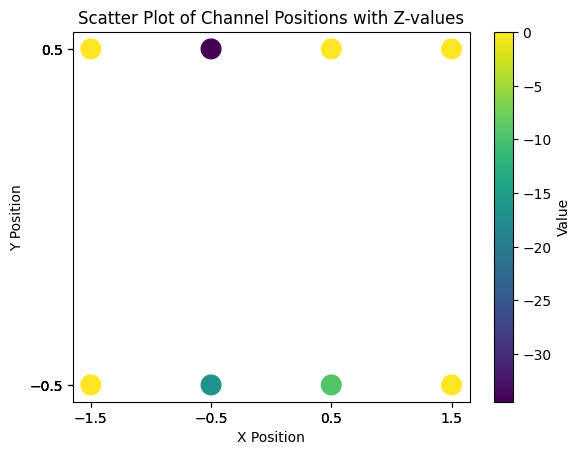

[0, 0, -7.2900390625, -14.64990234375, 0, -12.543212890625, -14.248046875, -10.631103515625]


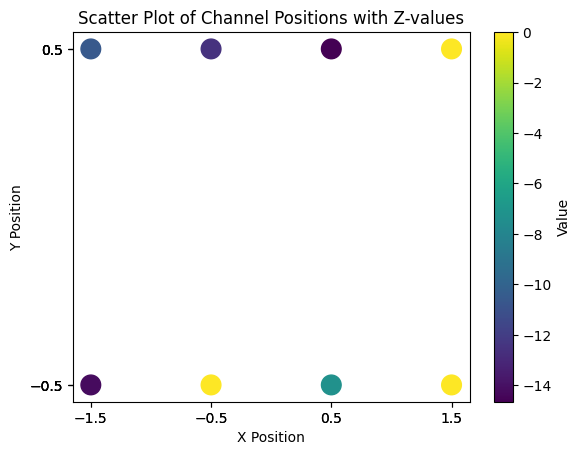

[0, 0, 0, -8.094970703125, -13.758056640625, -18.95263671875, 0, -13.41796875]


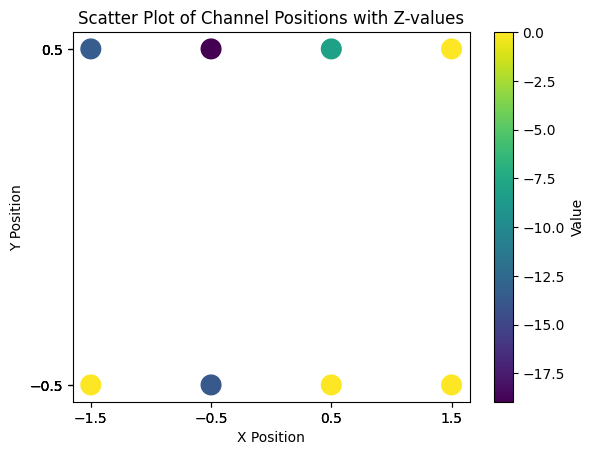

[0, 0, -40.209716796875, -7.54736328125, 0, -13.447509765625, 0, 0]


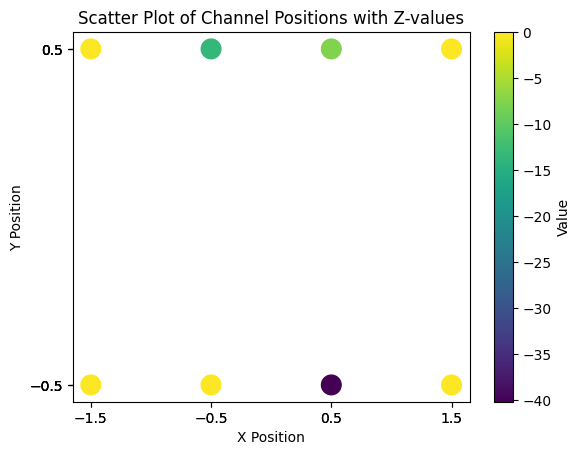

[0, 0, 0, -58.885009765625, 0, -14.142578125, 0, 0]


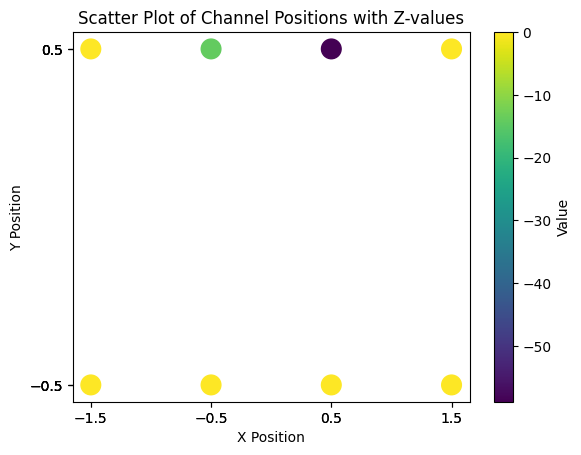

[0, 0, 0, -21.761474609375, -27.77197265625, 0, -31.228759765625, 0]


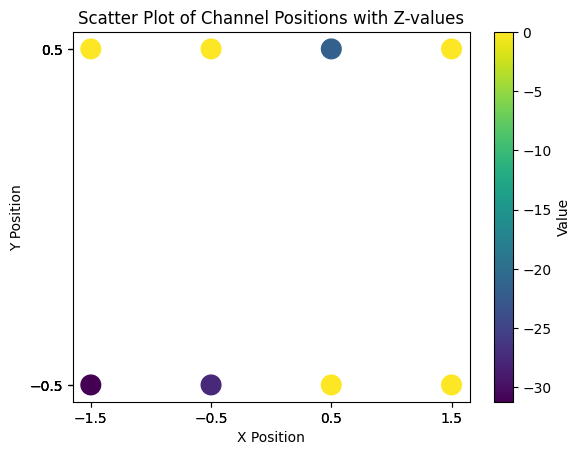

[0, 0, 0, -26.3369140625, 0, -23.313720703125, -15.861572265625, 0]


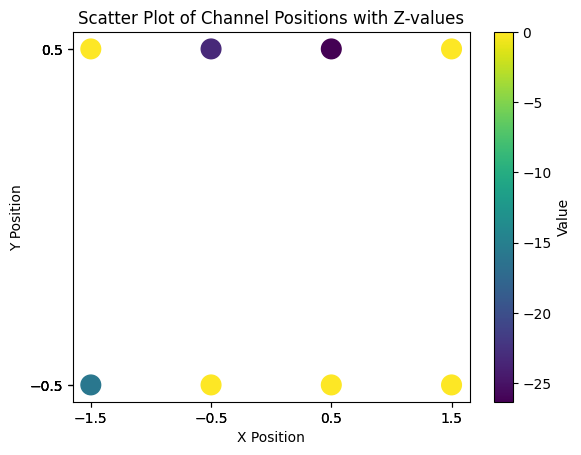

[0, -8.2197265625, 0, -8.912841796875, 0, -13.4990234375, 0, 0]


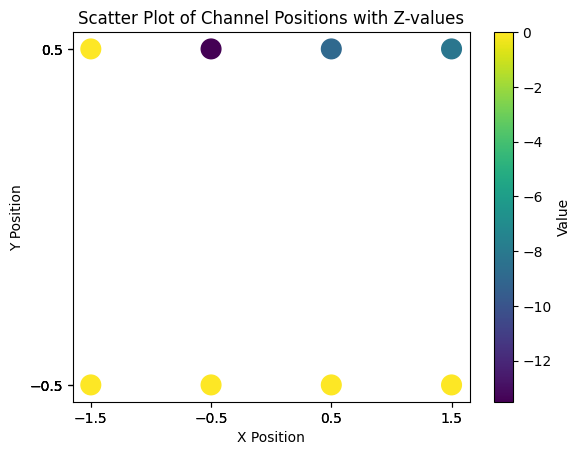

[0, -7.014404296875, 0, 0, -7.51220703125, -24.603759765625, 0, -14.132080078125]


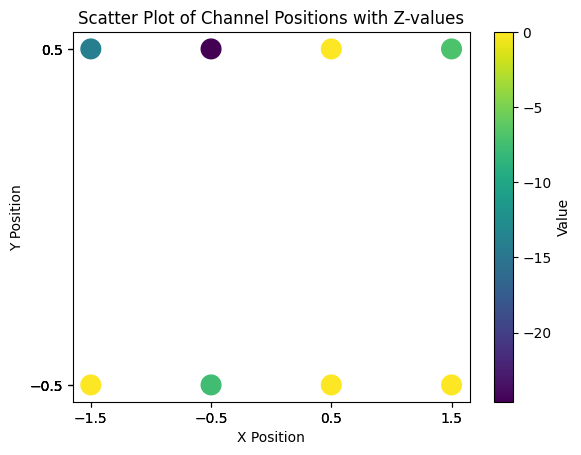

[0, -8.068603515625, 0, 0, -17.7294921875, -25.317626953125, 0, -12.427490234375]


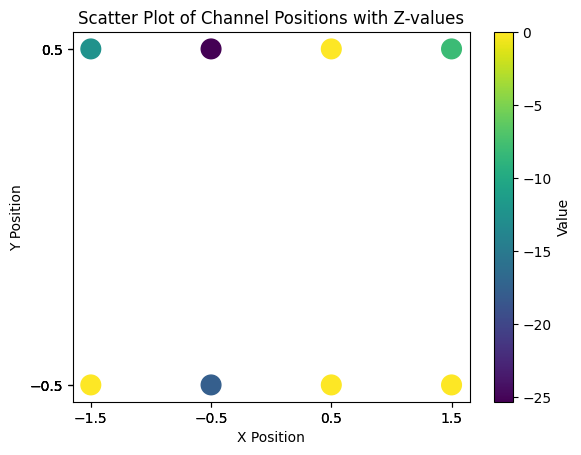

[0, 0, 0, -14.095703125, 0, -10.497802734375, 0, 0]


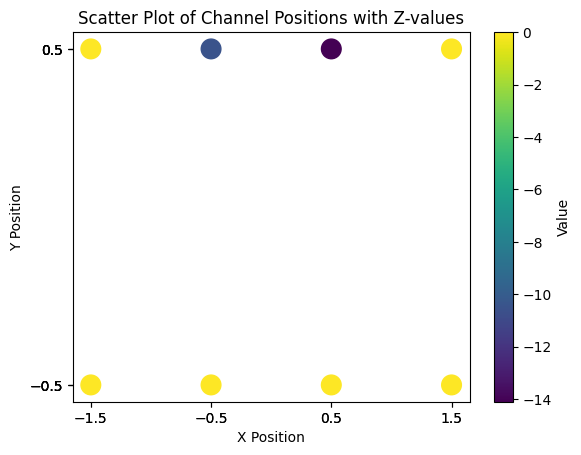

[0, 0, -7.18505859375, 0, 0, -39.316650390625, 0, -13.27197265625]


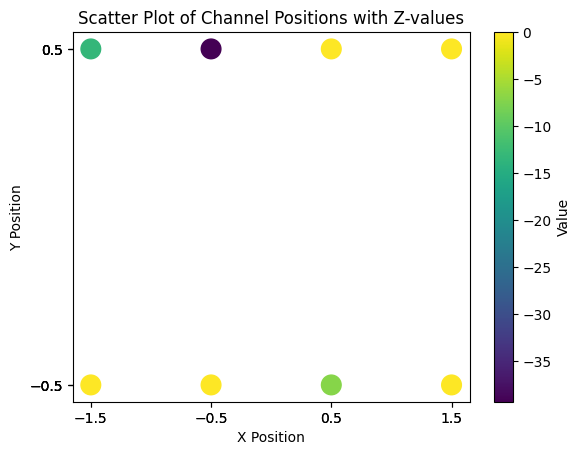

[0, 0, -7.43017578125, -26.59814453125, 0, -12.118896484375, 0, 0]


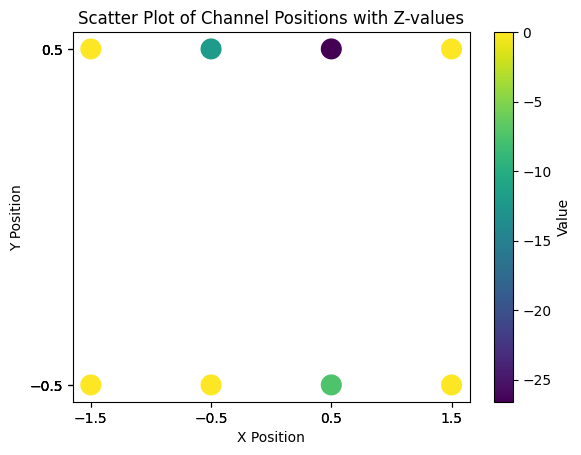

[0, 0, 0, -26.766357421875, 0, -10.261474609375, -8.196533203125, 0]


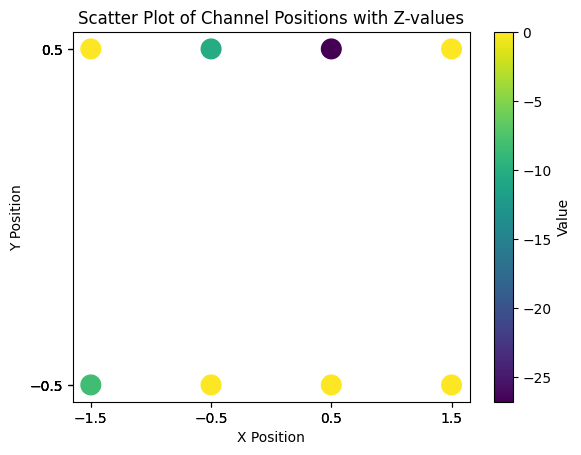

[0, 0, 0, 0, 0, -15.318115234375, -20.051025390625, -8.641357421875]


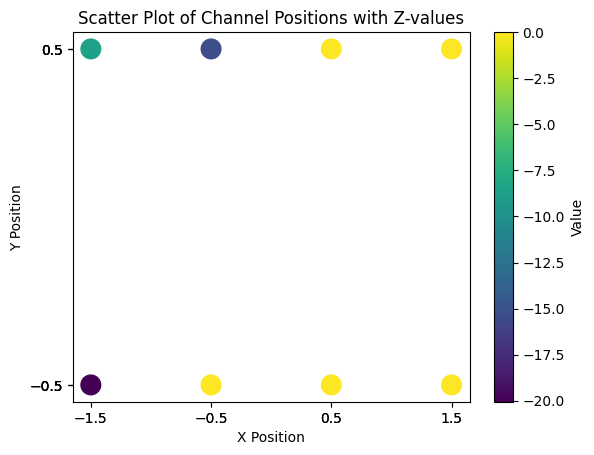

[0, 0, 0, -67.514892578125, 0, -18.264404296875, 0, 0]


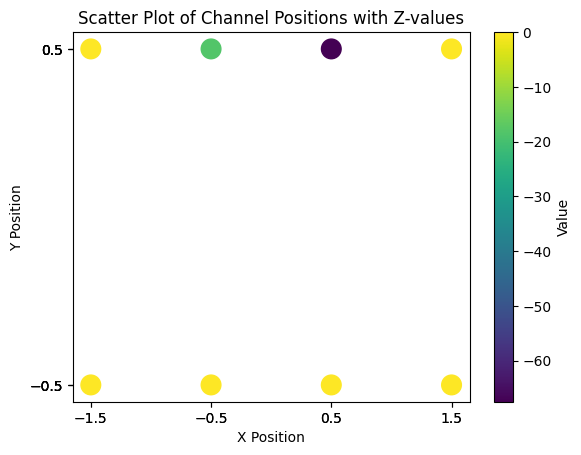

[0, 0, -8.665771484375, -18.068115234375, 0, 0, -31.533447265625, 0]


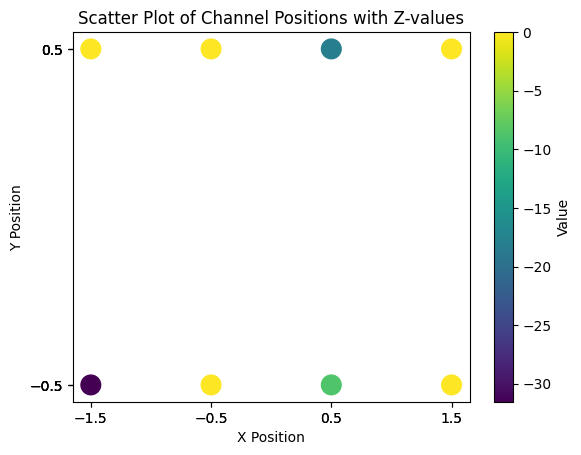

[0, 0, 0, -35.505615234375, 0, -21.431640625, 0, 0]


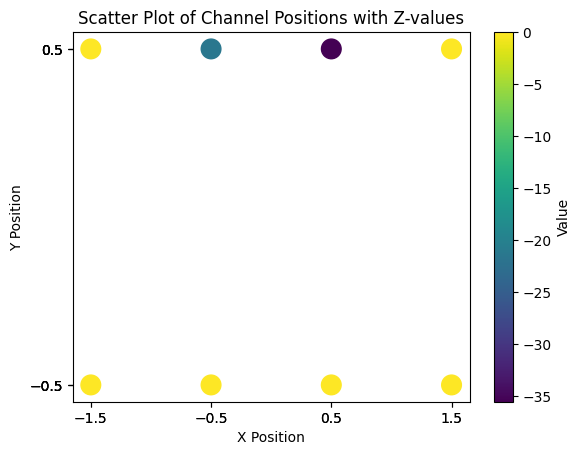

[0, 0, -13.03955078125, -23.88037109375, 0, 0, -14.63037109375, -15.819580078125]


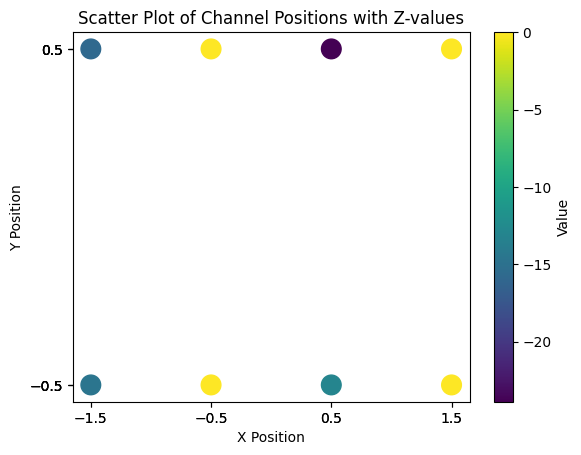

[0, -7.234619140625, -8.01904296875, 0, 0, 0, 0, 0]


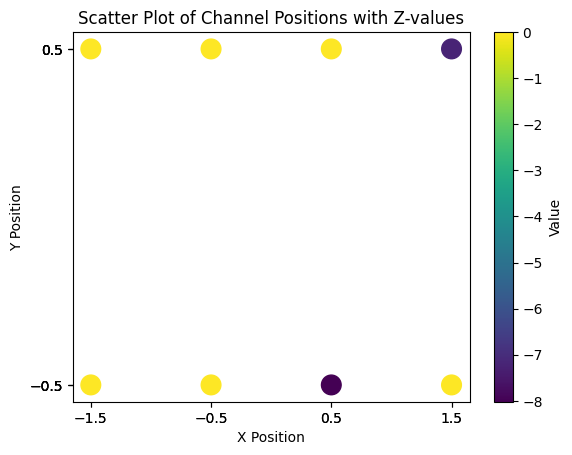

[0, -7.016357421875, 0, -13.73046875, 0, -11.818115234375, 0, 0]


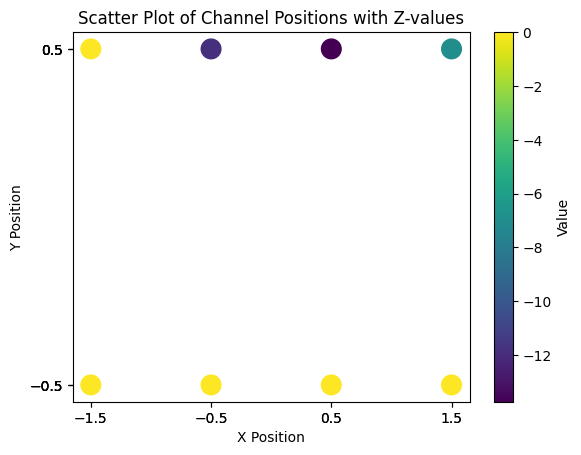

[0, -7.959716796875, 0, -20.587890625, 0, 0, 0, 0]


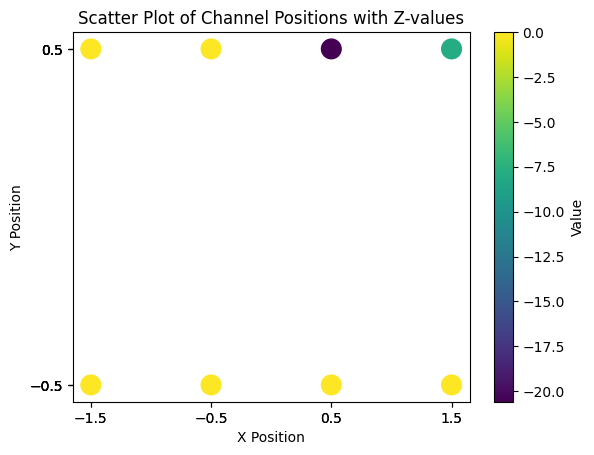

[-8.2626953125, 0, -27.853759765625, -24.826904296875, -7.9033203125, -15.839599609375, -23.891357421875, 0]


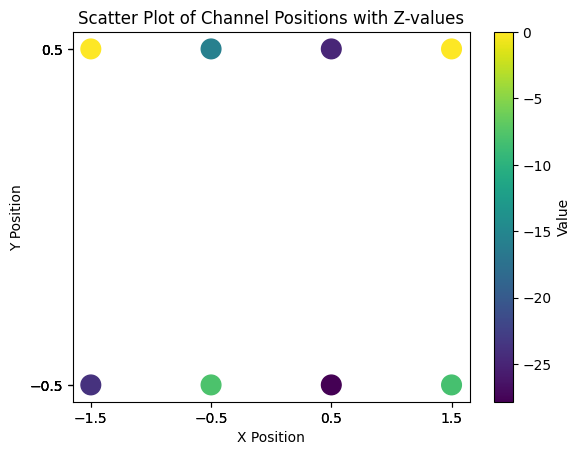

[-8.31591796875, -8.28125, 0, 0, 0, -33.4169921875, -14.7470703125, 0]


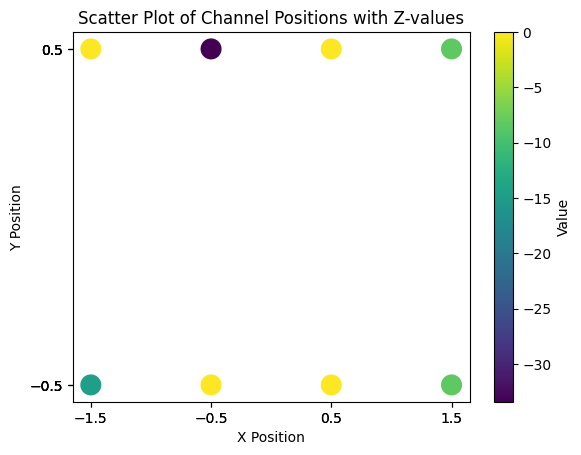

[0, -7.851318359375, 0, -8.920166015625, 0, -20.15283203125, -26.2783203125, 0]


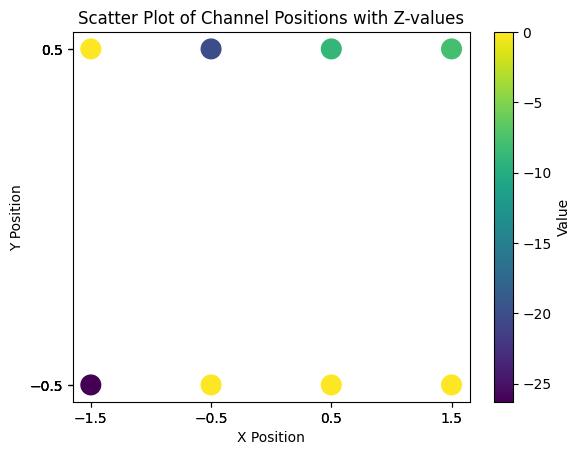

[-7.29052734375, 0, -24.414794921875, -7.654541015625, 0, -20.74658203125, -7.474609375, 0]


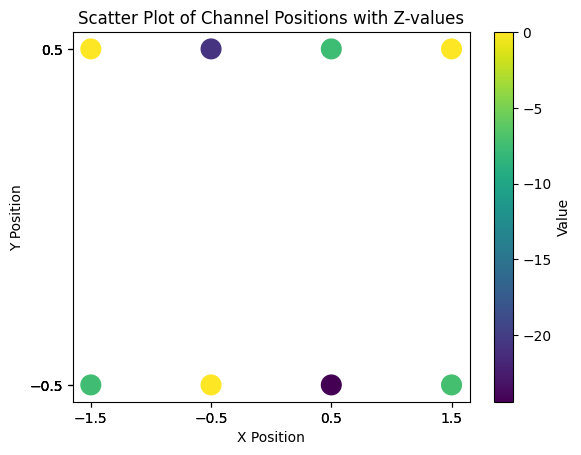

[0, 0, -22.26806640625, 0, -15.994384765625, -20.208740234375, 0, 0]


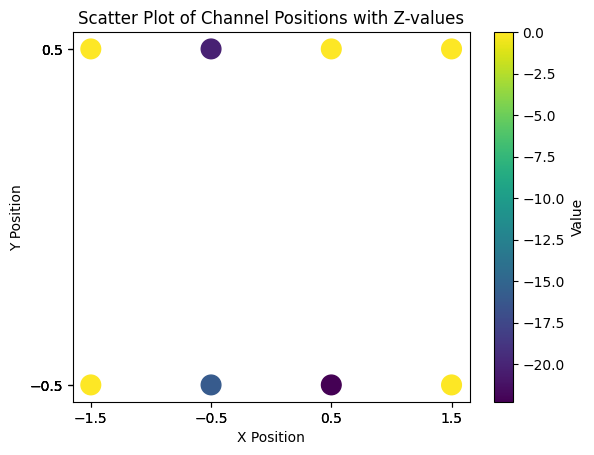

[-7.5478515625, 0, -7.49853515625, 0, -8.71142578125, 0, -7.301513671875, 0]


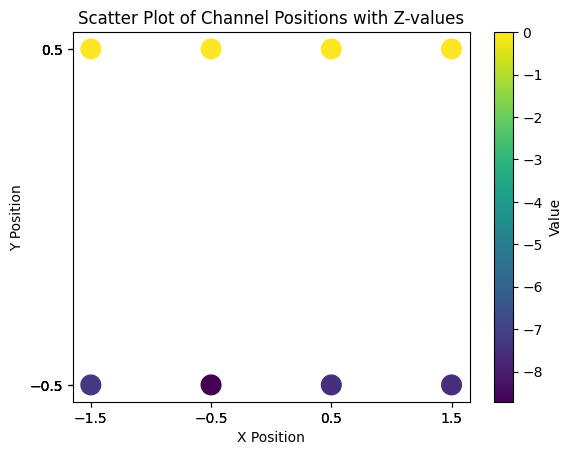

[-7.313232421875, 0, -8.077880859375, -62.849365234375, 0, 0, 0, 0]


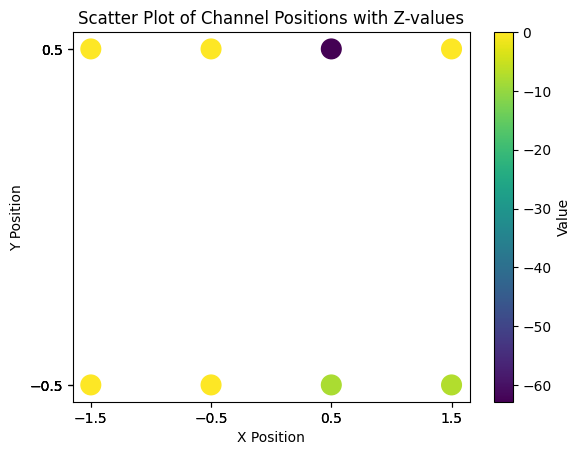

[0, 0, -40.798583984375, -11.486083984375, -7.470947265625, -7.68017578125, 0, -7.046630859375]


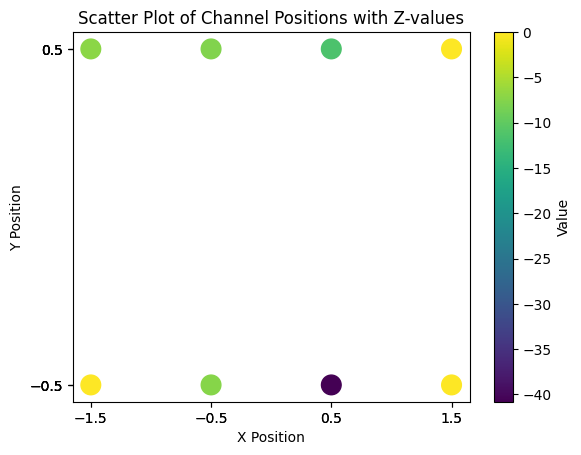

[0, 0, 0, 0, 0, -23.669189453125, 0, 0]


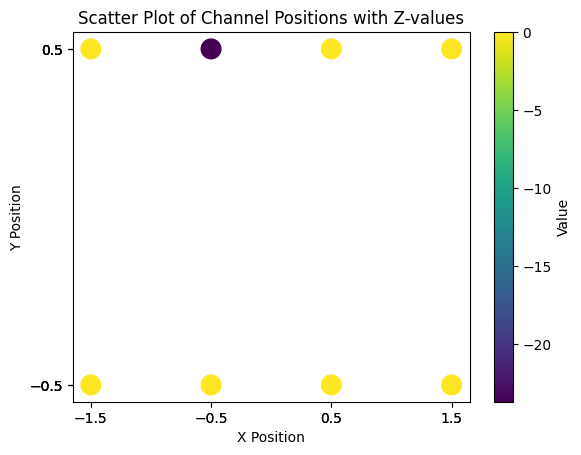

[-7.238525390625, 0, -32.80126953125, -34.330810546875, 0, 0, -7.057373046875, 0]


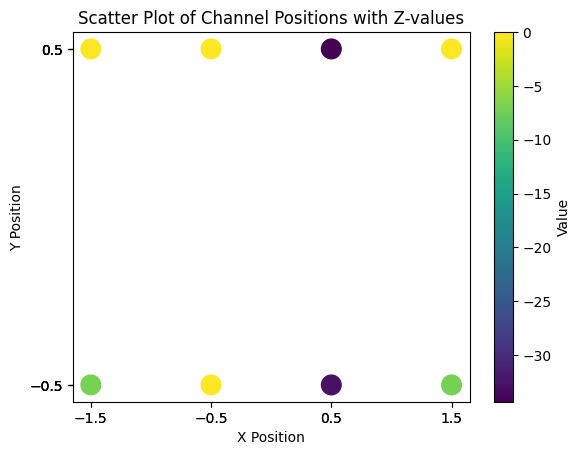

[-7.498779296875, -7.270751953125, -7.76416015625, 0, -7.51416015625, 0, 0, 0]


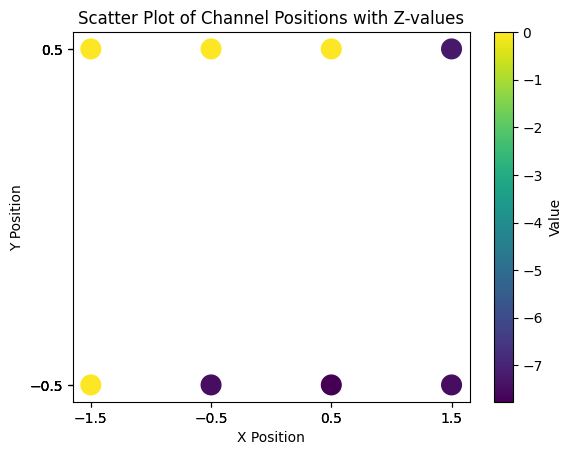

[-7.171630859375, -7.8935546875, -15.48779296875, 0, 0, -49.311279296875, 0, 0]


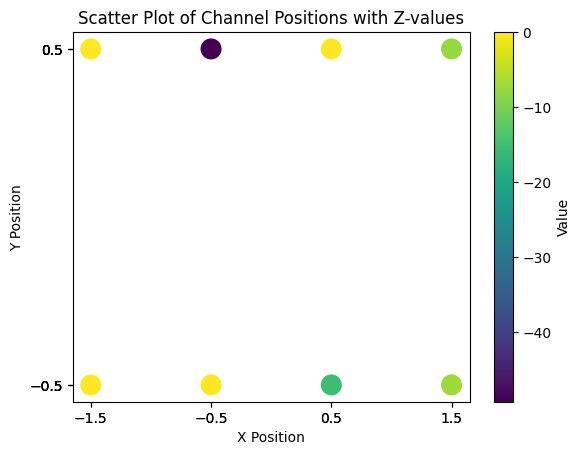

[0, -7.152587890625, 0, -55.52880859375, -30.5263671875, 0, 0, 0]


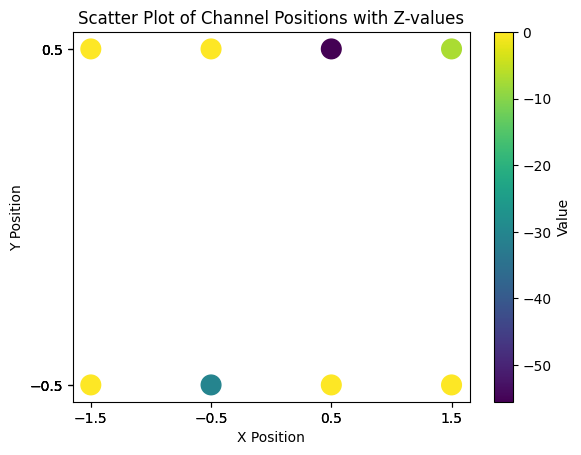

[0, 0, 0, -7.198974609375, -15.6513671875, -14.375244140625, -16.322021484375, 0]


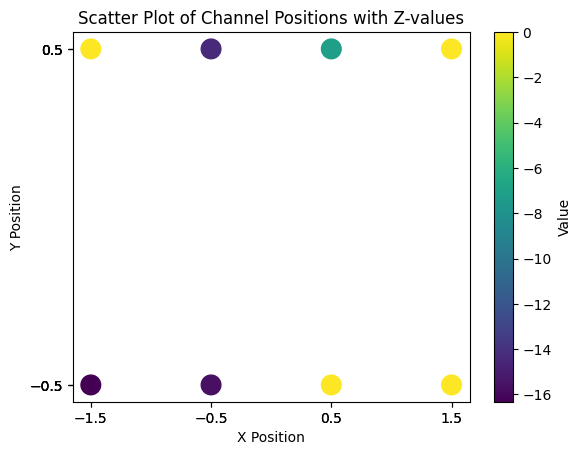

[0, -7.58203125, -7.84619140625, -7.95166015625, -12.815673828125, 0, -7.527099609375, -25.380615234375]


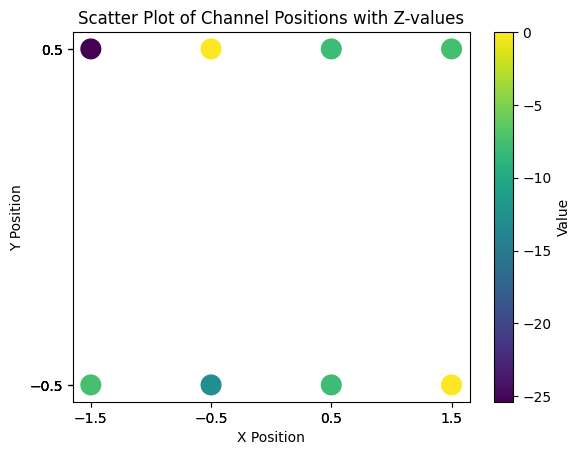

[0, -8.005859375, 0, -7.749267578125, 0, -8.285400390625, -61.773681640625, -48.41455078125]


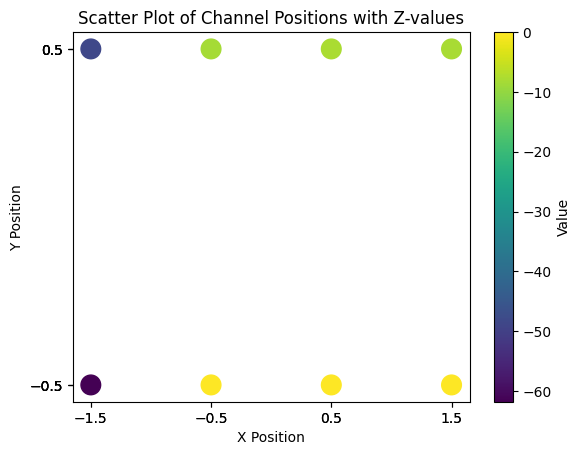

[0, -7.63671875, -11.357177734375, 0, 0, -9.69287109375, -7.802734375, 0]


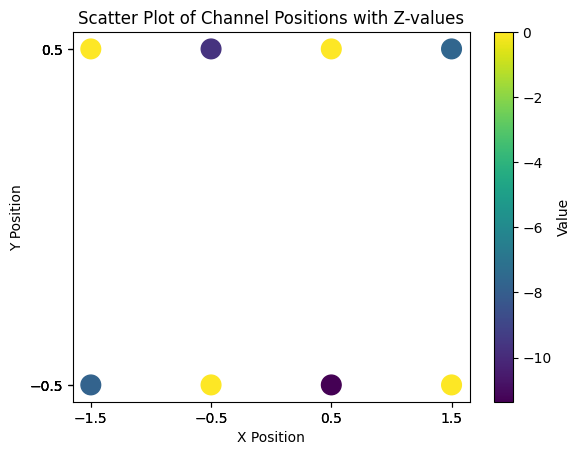

[0, -7.559326171875, 0, -21.08935546875, 0, -17.592529296875, -7.19580078125, 0]


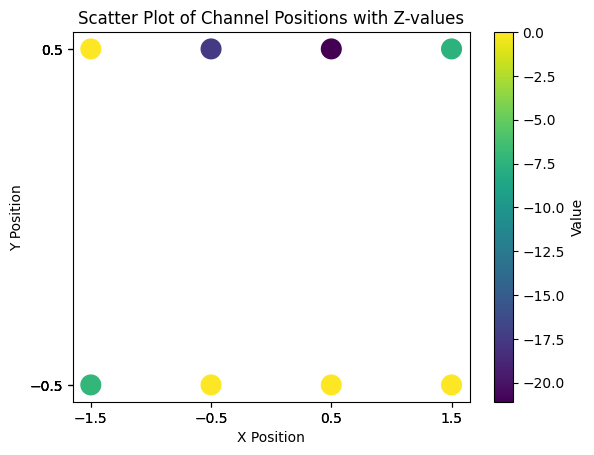

[-7.00732421875, -8.078369140625, 0, -23.5732421875, 0, -23.916015625, -7.203125, -12.74169921875]


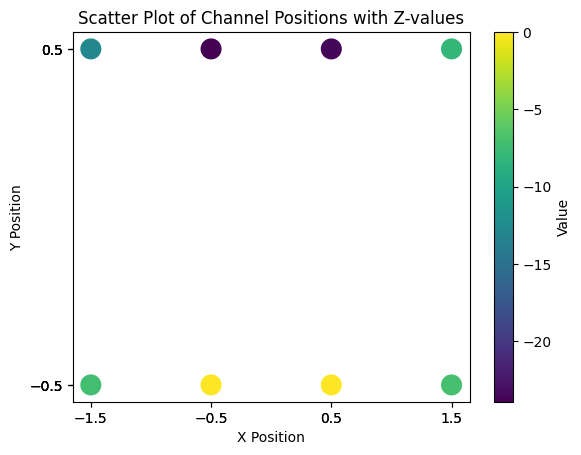

[0, 0, 0, -43.523681640625, 0, -26.559814453125, -7.0546875, -39.52197265625]


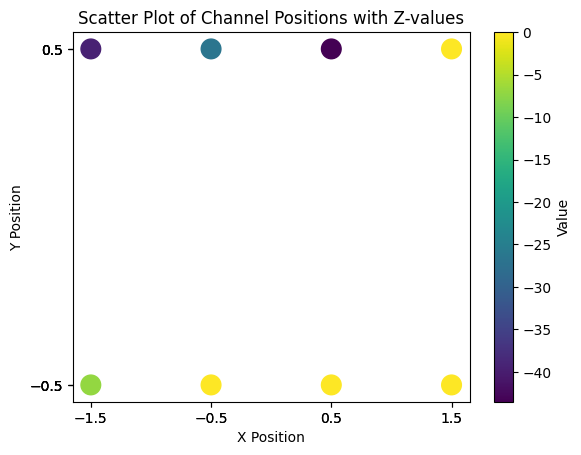

[0, 0, -22.186767578125, -7.169921875, 0, -7.155517578125, 0, 0]


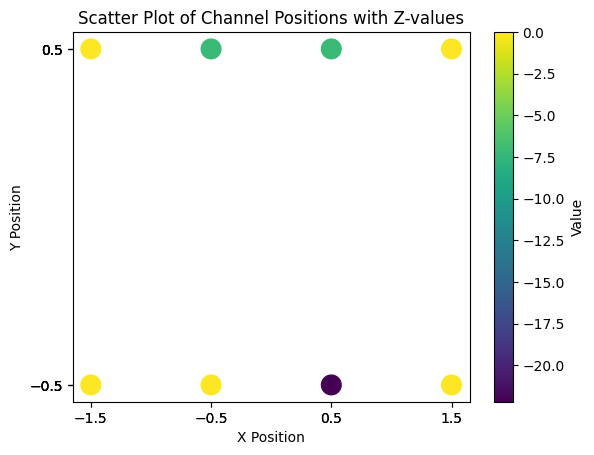

[0, 0, 0, -11.931640625, 0, 0, -25.2333984375, 0]


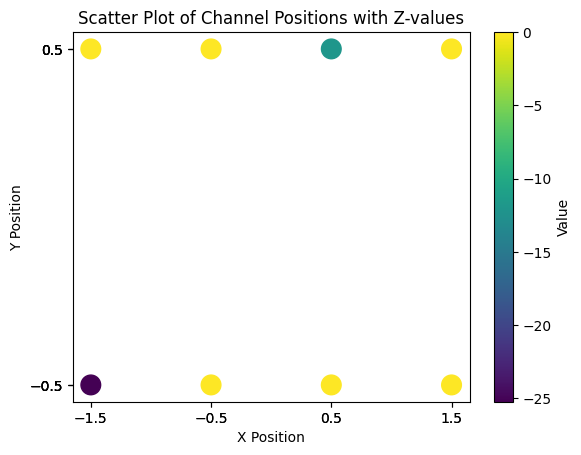

[0, 0, 0, -24.412841796875, -16.939453125, -15.47802734375, 0, 0]


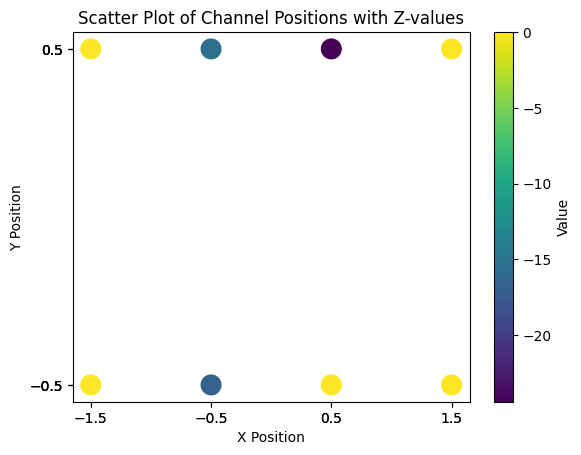

[0, 0, 0, -13.287109375, 0, 0, -30.2177734375, 0]


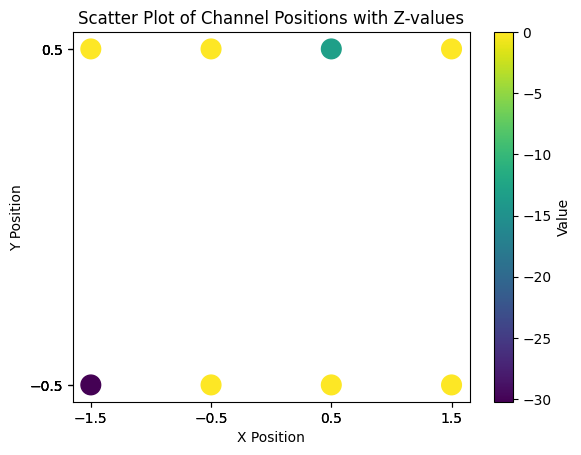

[0, 0, -9.512939453125, -14.464599609375, -13.2080078125, -11.291259765625, 0, 0]


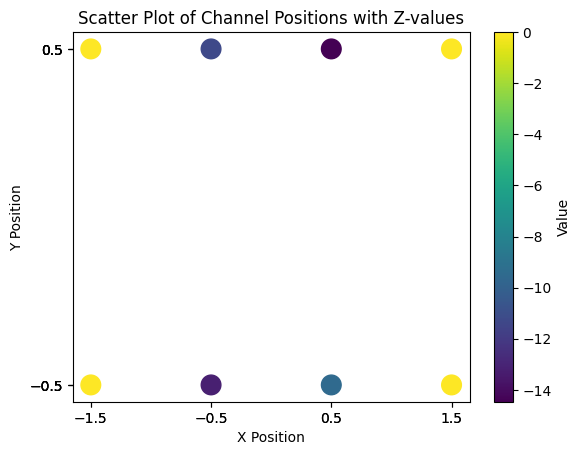

[0, 0, 0, 0, 0, 0, -7.283935546875, 0]


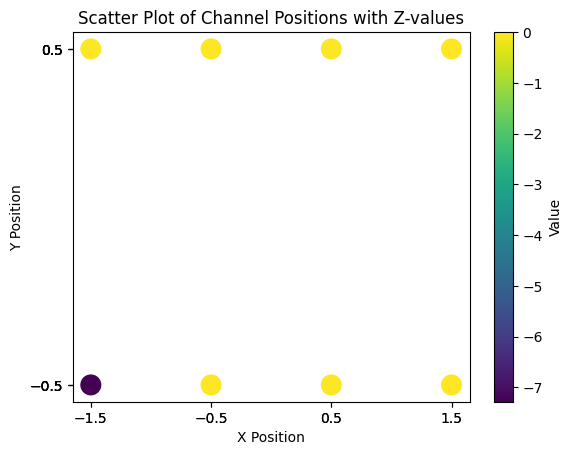

[0, 0, -7.0234375, -38.13671875, 0, -23.476806640625, -16.328369140625, -7.058837890625]


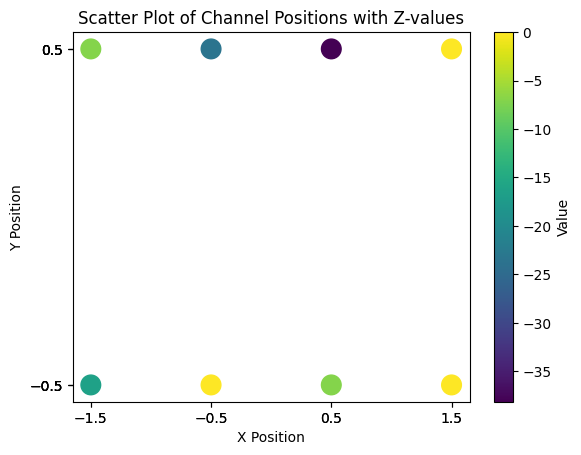

[0, 0, 0, -24.461669921875, -7.568115234375, -12.174072265625, 0, -37.071044921875]


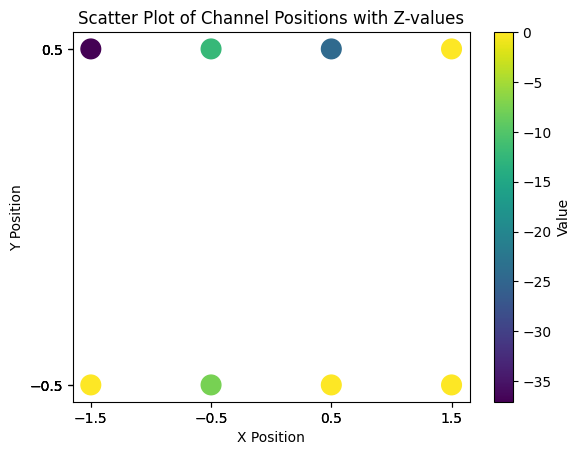

[0, 0, -24.071533203125, 0, 0, -12.0654296875, -13.573974609375, -25.3037109375]


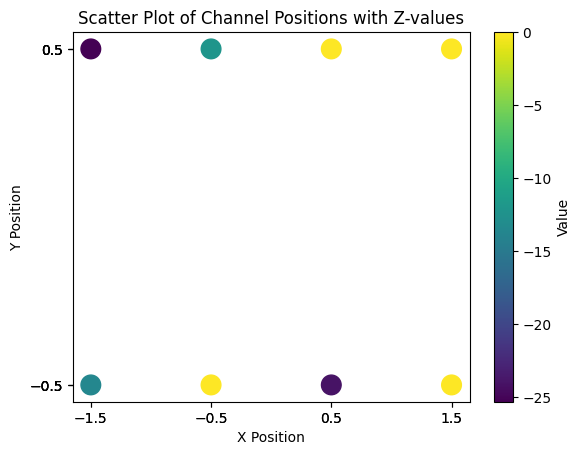

[0, 0, 0, -50.753173828125, -37.84765625, -11.473876953125, -11.96044921875, 0]


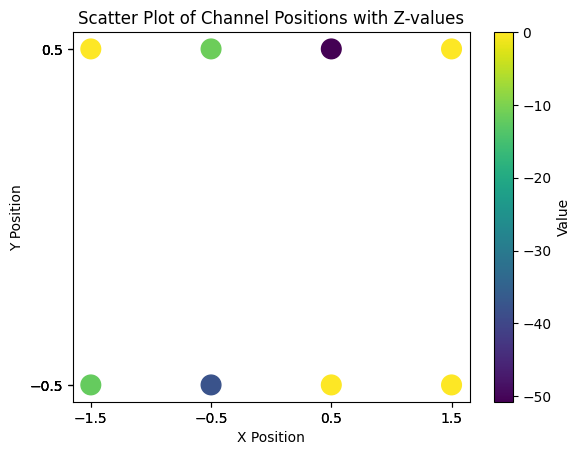

[0, 0, 0, -26.752197265625, -40.401611328125, 0, 0, -12.95068359375]


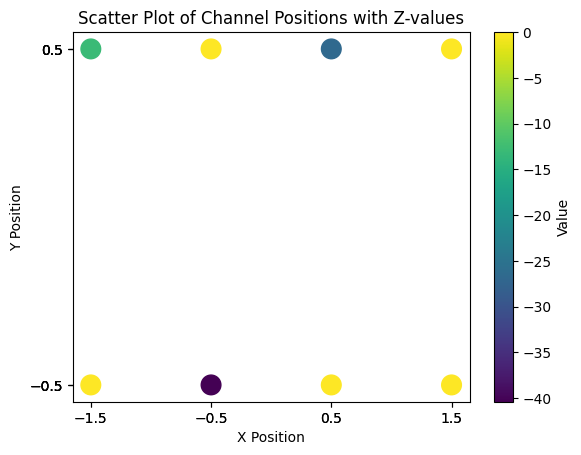

[0, 0, 0, -12.695068359375, 0, -19.9130859375, 0, -16.173583984375]


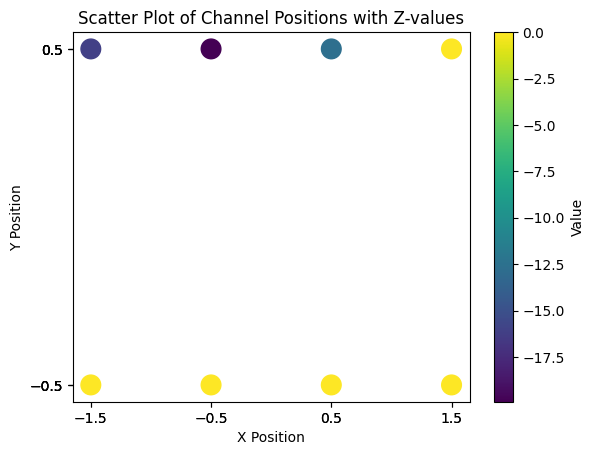

[0, 0, -8.042236328125, 0, 0, -10.97802734375, 0, 0]


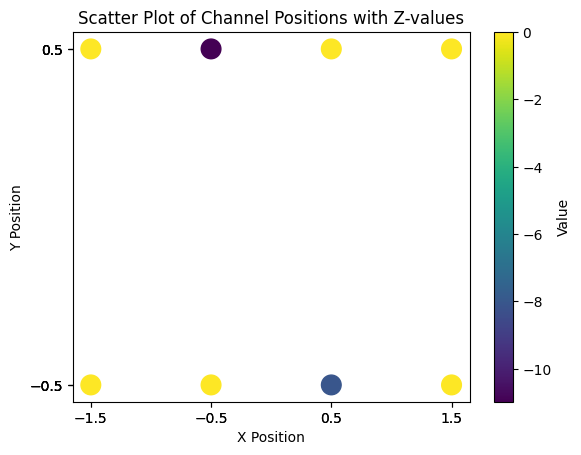

[0, 0, 0, -23.842529296875, -12.343994140625, -15.228515625, 0, 0]


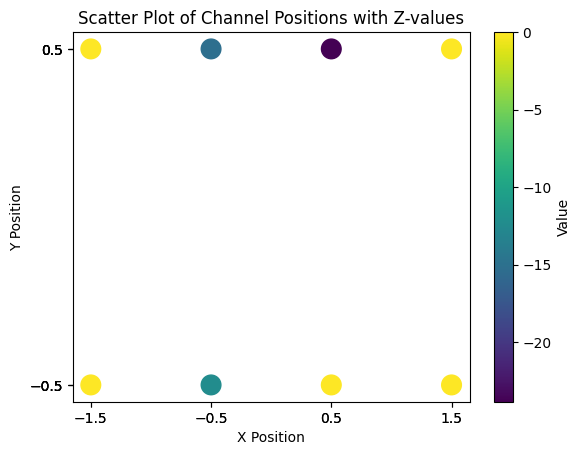

[0, 0, 0, -14.448974609375, 0, -26.18115234375, -7.79931640625, 0]


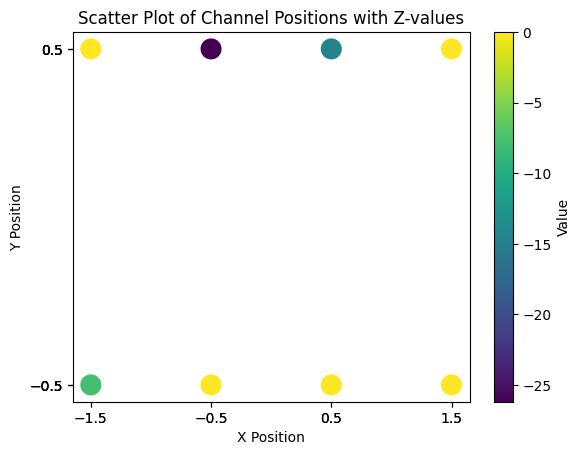

[0, 0, 0, -10.403076171875, -12.800537109375, -8.64208984375, -14.53857421875, 0]


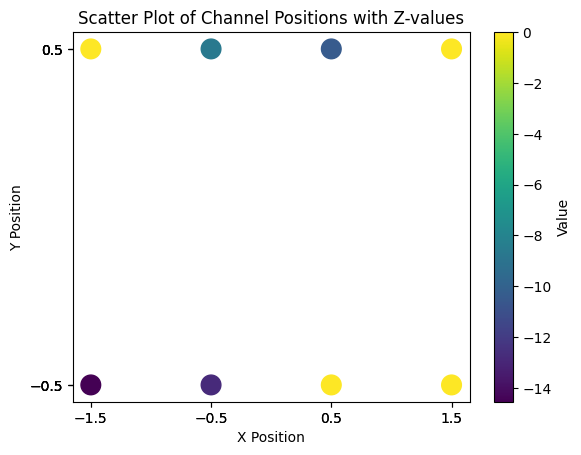

[0, 0, -19.246826171875, 0, 0, -35.7841796875, 0, 0]


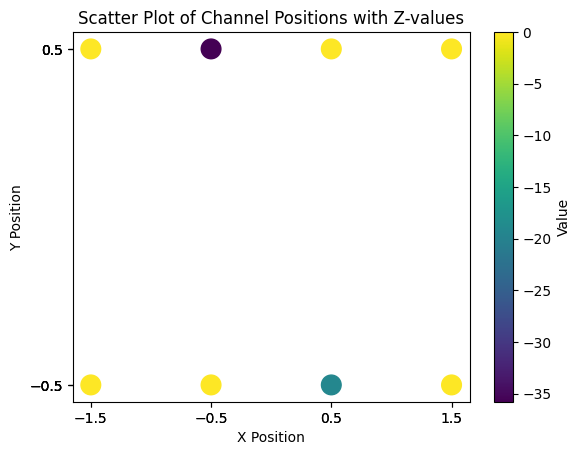

[0, 0, 0, -9.77392578125, -16.643798828125, -15.38525390625, 0, 0]


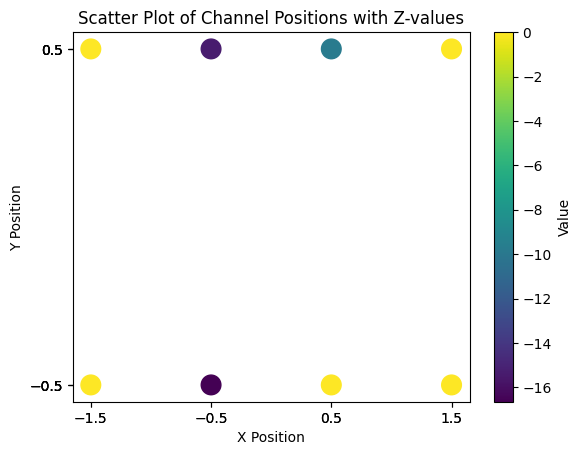

[0, -7.594482421875, -13.2177734375, -7.57421875, 0, 0, 0, 0]


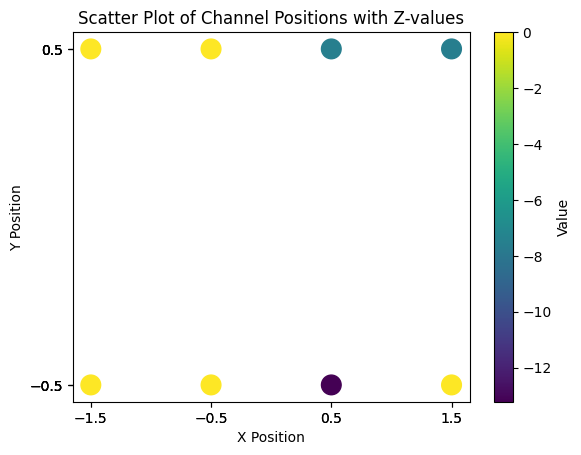

[0, -8.51123046875, -12.03173828125, -60.55859375, 0, -15.140625, 0, 0]


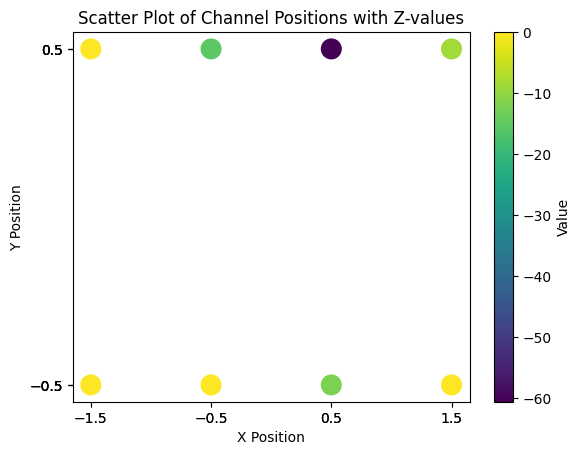

[0, -10.064453125, 0, 0, 0, -11.5087890625, 0, 0]


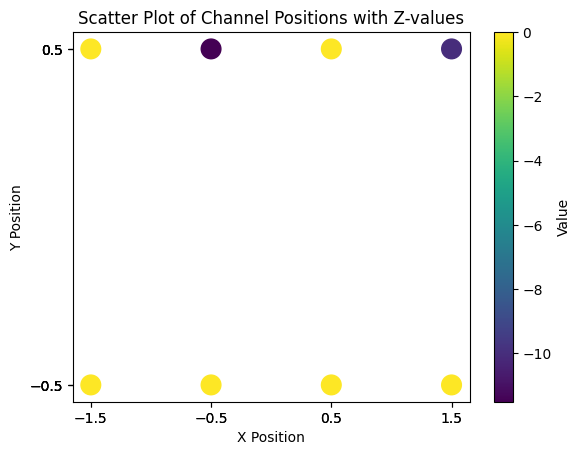

[0, -7.09619140625, -26.177490234375, 0, 0, -25.4267578125, 0, 0]


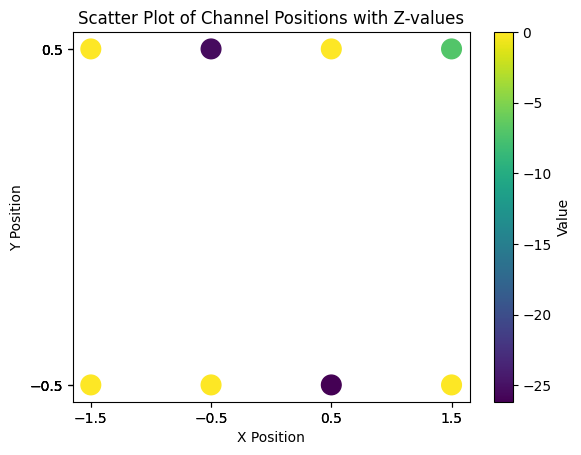

[0, -7.838623046875, -13.516845703125, 0, 0, -11.56494140625, 0, 0]


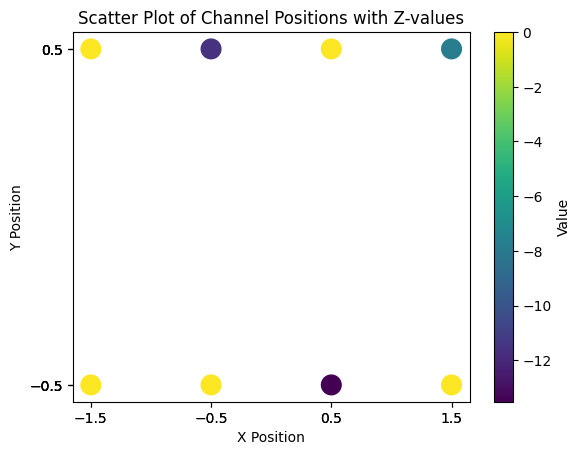

[0, 0, 0, -41.91748046875, 0, -59.729736328125, 0, 0]


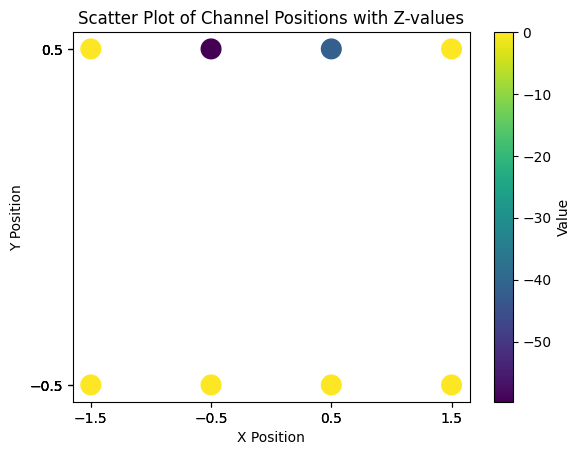

[0, 0, 0, 0, 0, -22.635498046875, -15.797119140625, 0]


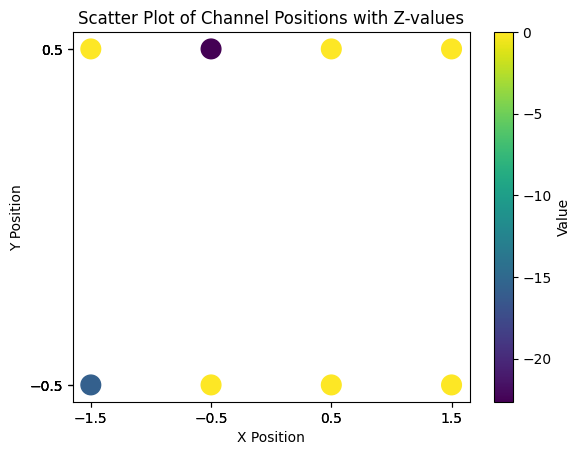

[0, 0, -13.041259765625, -11.548583984375, -26.771240234375, 0, 0, 0]


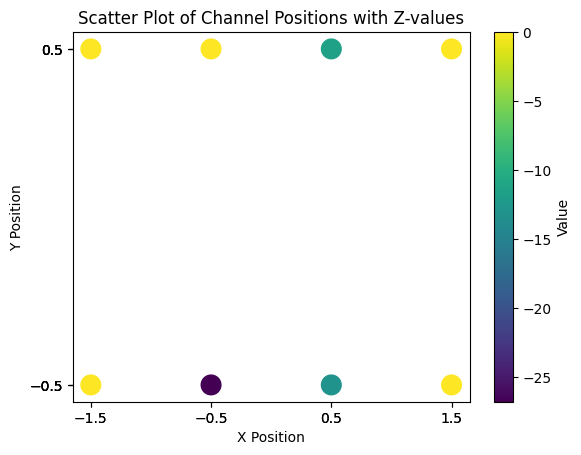

[0, 0, 0, -14.433349609375, -8.6123046875, -8.2705078125, 0, -18.902587890625]


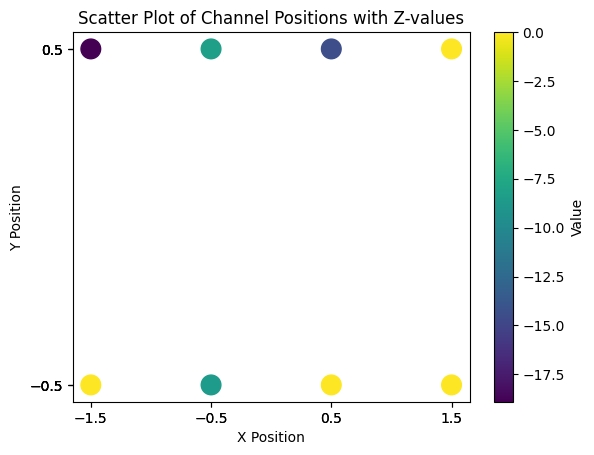

[0, 0, 0, -15.118896484375, 0, -24.466552734375, 0, 0]


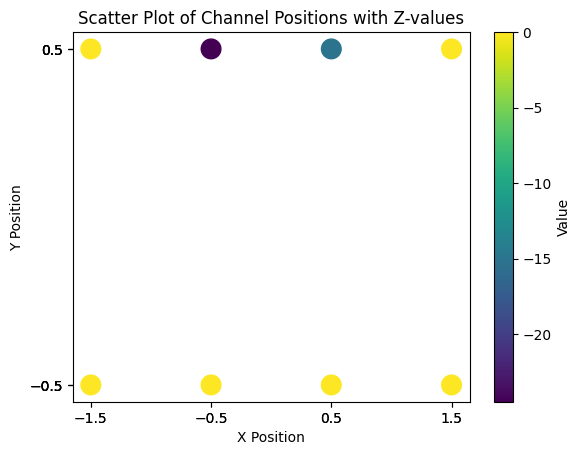

[0, -7.64599609375, 0, -27.10693359375, 0, -7.419677734375, 0, 0]


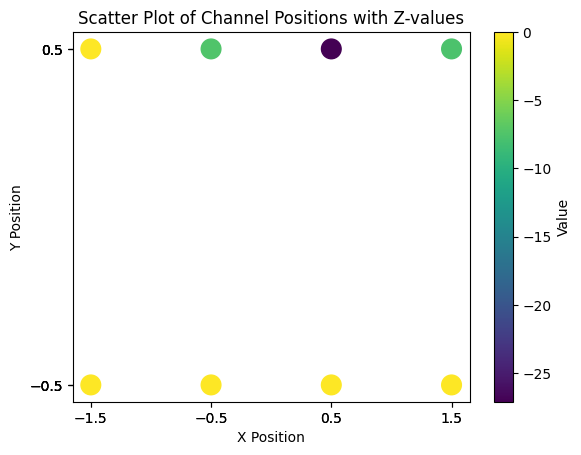

[0, -8.316650390625, 0, -13.740966796875, -24.87451171875, -7.89306640625, 0, 0]


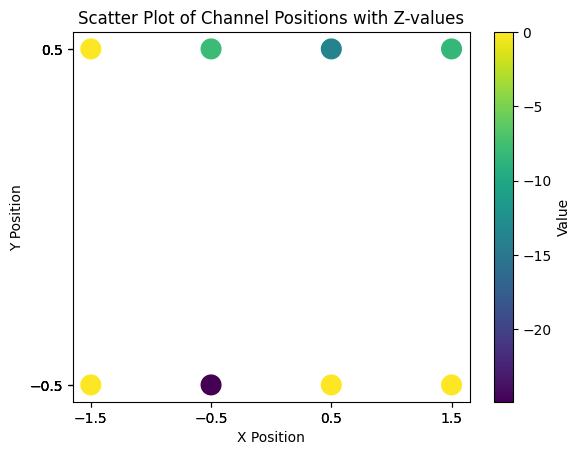

[0, 0, -8.14453125, -35.284423828125, -7.028076171875, 0, 0, 0]


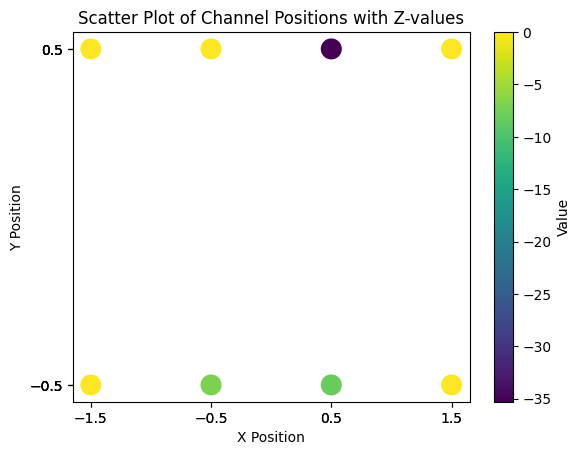

[0, 0, -15.177734375, 0, 0, -8.7001953125, 0, 0]


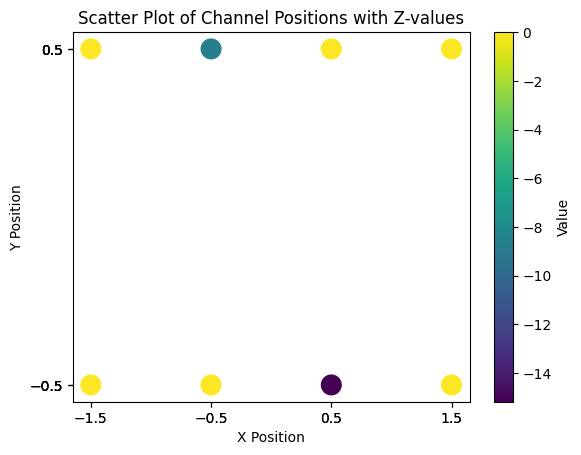

[0, 0, 0, -17.358642578125, -7.97412109375, -22.74267578125, -27.234375, -23.762939453125]


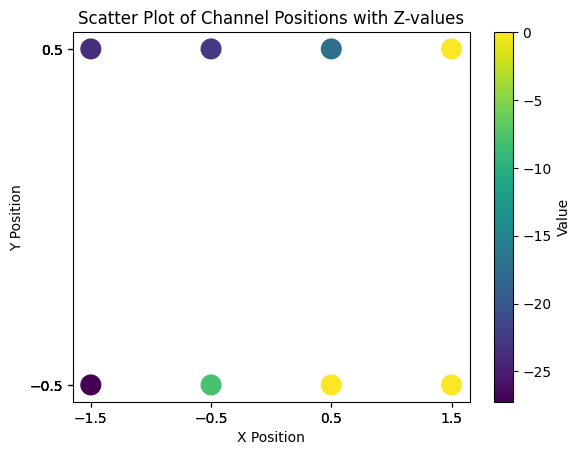

[0, -7.09716796875, 0, -14.667724609375, 0, -24.145751953125, -7.765625, -35.7919921875]


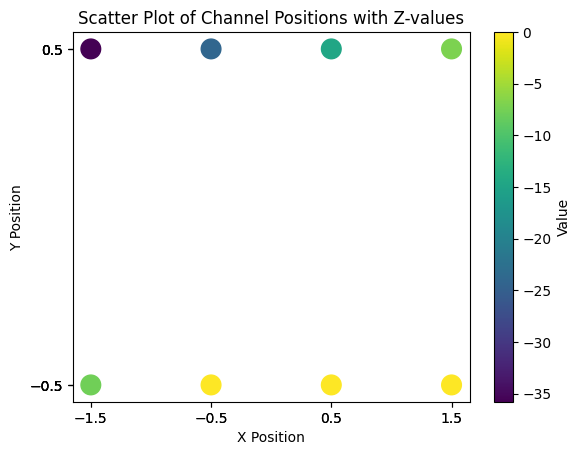

[0, -8.320068359375, 0, -38.58984375, 0, 0, -19.533203125, 0]


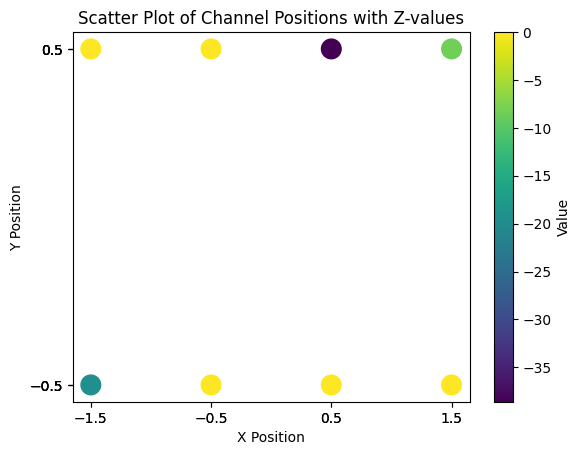

[0, -8.477294921875, 0, -15.704345703125, -7.48974609375, -14.44482421875, 0, 0]


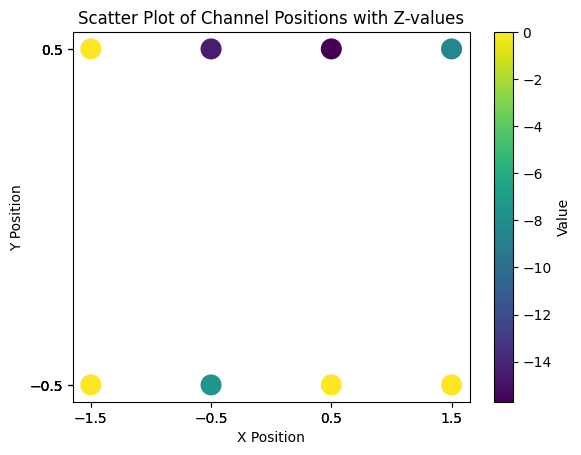

[0, 0, -7.665771484375, -47.30712890625, 0, -18.70068359375, 0, 0]


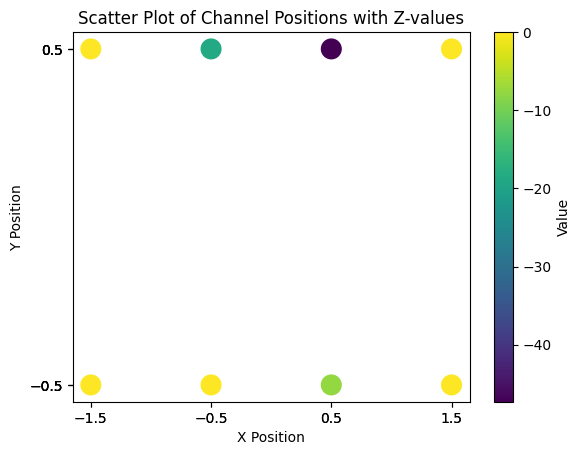

[0, 0, 0, -12.951171875, -16.347412109375, 0, 0, 0]


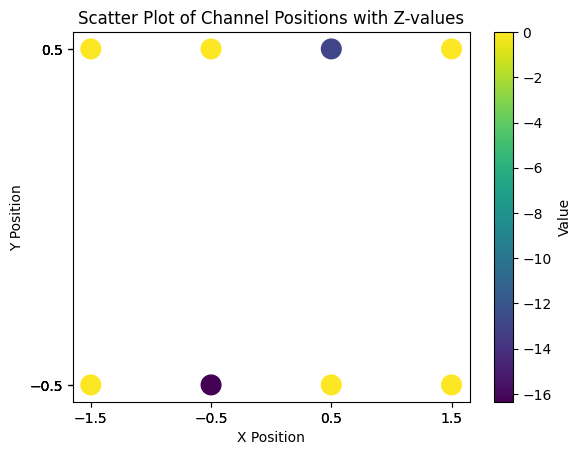

[0, -7.74609375, -8.239501953125, 0, 0, -14.962890625, -7.11962890625, 0]


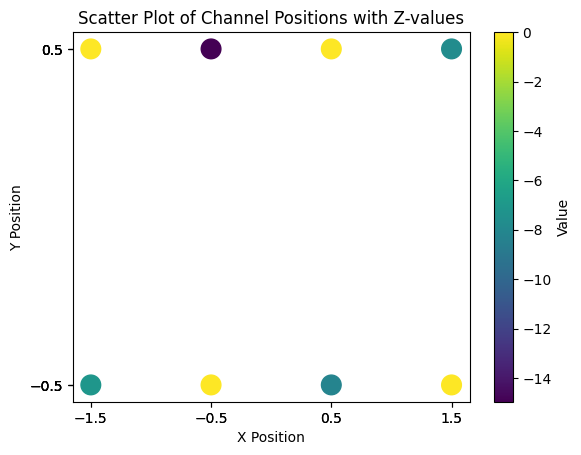

[0, 0, -7.475341796875, -8.001953125, -8.414306640625, -49.0556640625, -9.82666015625, -8.81787109375]


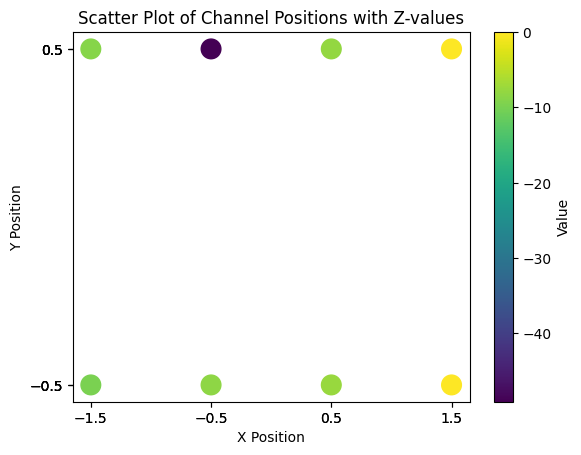

[-7.194580078125, 0, -7.478515625, -8.592041015625, 0, -7.290283203125, 0, -7.688720703125]


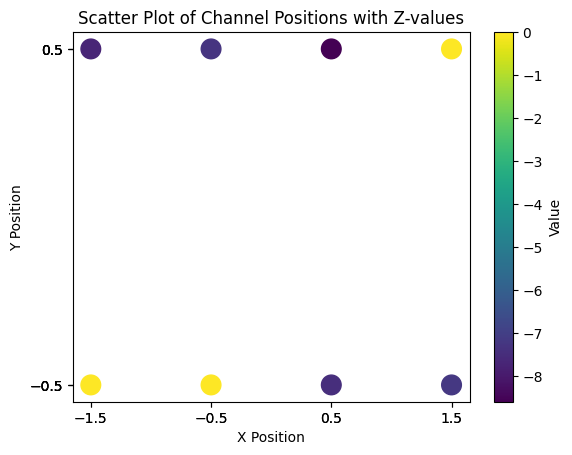

[0, -7.93505859375, -7.810546875, -23.275634765625, -36.2314453125, -32.859619140625, 0, 0]


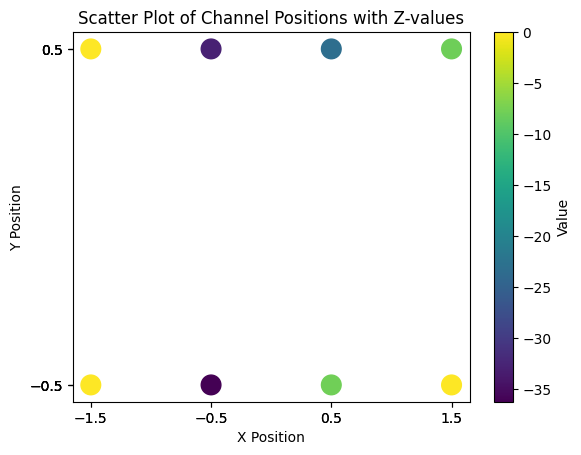

[0, 0, -7.7568359375, -25.27978515625, 0, 0, -7.279296875, 0]


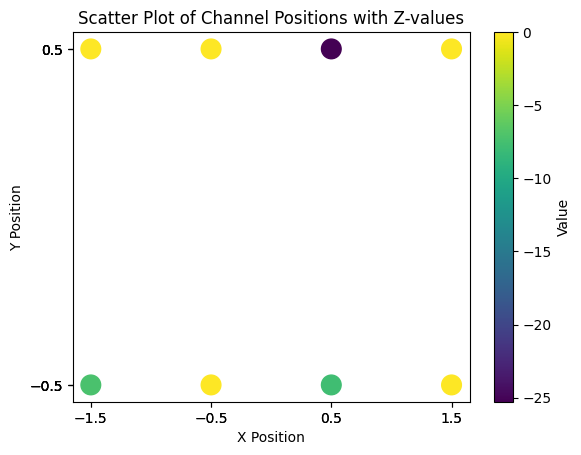

[0, -7.482666015625, -7.640869140625, -12.697998046875, 0, -26.243896484375, -7.8818359375, -37.7353515625]


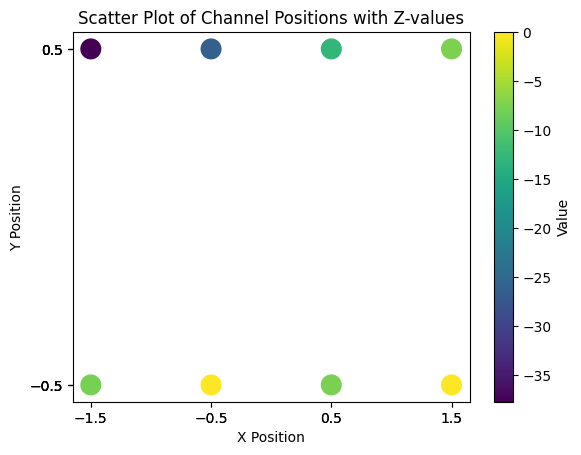

[0, 0, 0, -28.89697265625, -15.298095703125, -19.938720703125, -7.82861328125, 0]


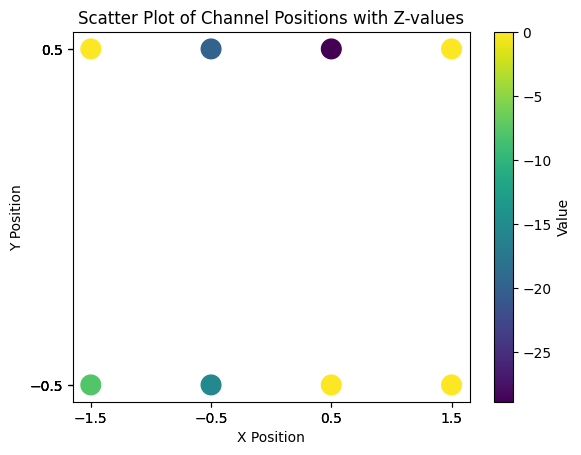

[0, -8.023681640625, -34.026123046875, -11.60986328125, -15.74462890625, 0, 0, 0]


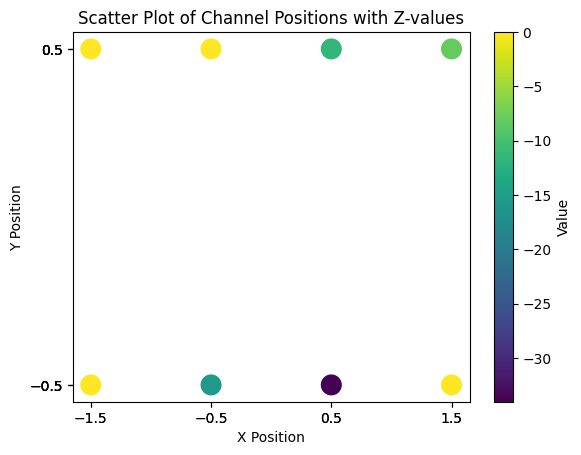

[0, 0, 0, -25.123779296875, 0, 0, 0, 0]


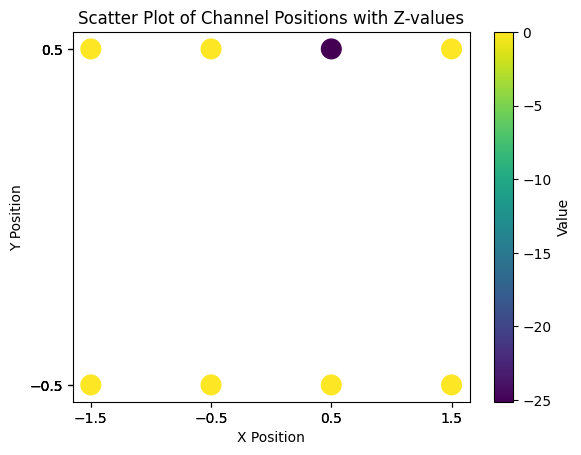

[0, -7.19873046875, 0, -22.578125, 0, -49.28759765625, -14.802978515625, 0]


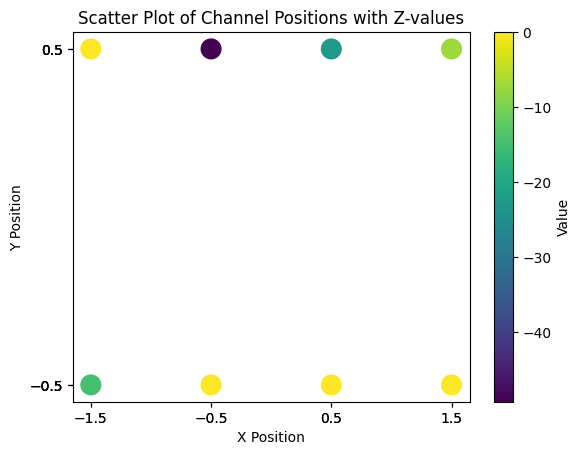

[0, 0, 0, -17.058349609375, 0, 0, 0, 0]


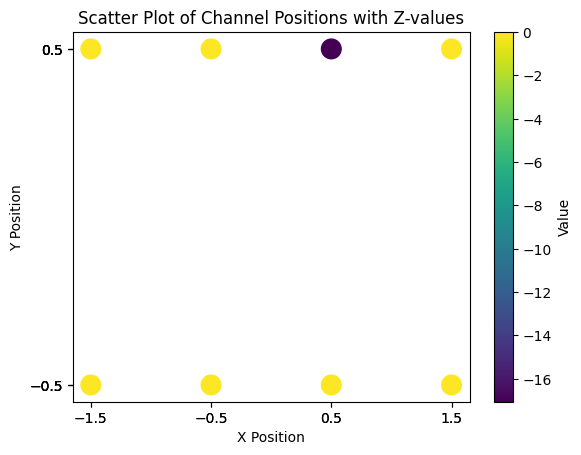

[0, 0, -12.768798828125, -21.935546875, -9.06884765625, -7.202392578125, 0, 0]


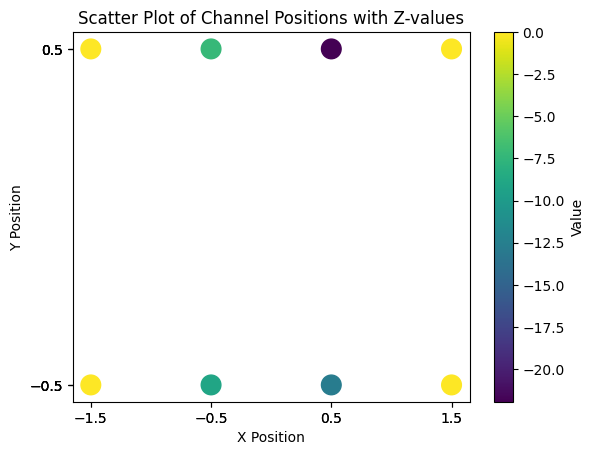

[0, 0, 0, -14.135009765625, -14.945556640625, -21.218994140625, 0, 0]


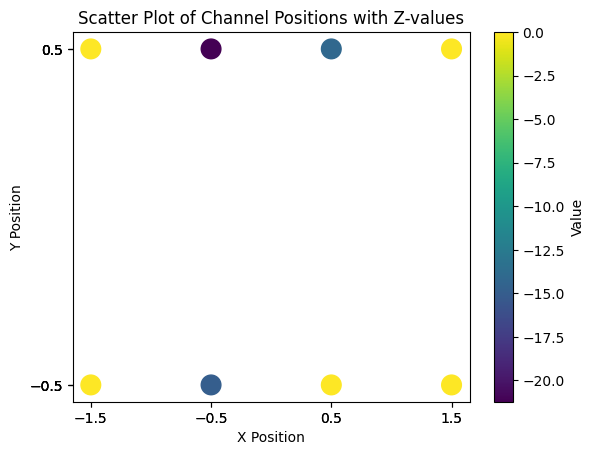

[0, 0, 0, 0, 0, 0, -7.853759765625, 0]


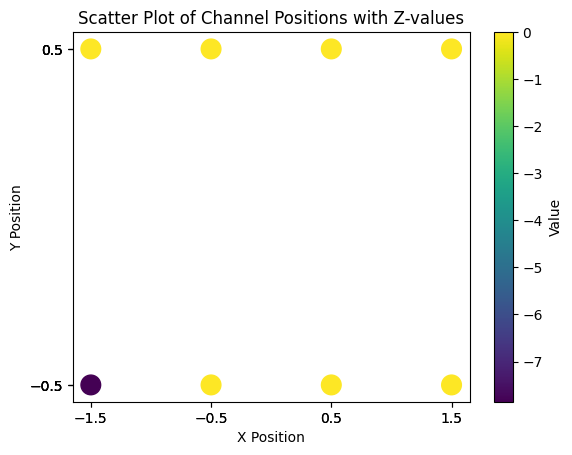

[0, 0, -7.314453125, -12.21337890625, 0, -22.84326171875, 0, 0]


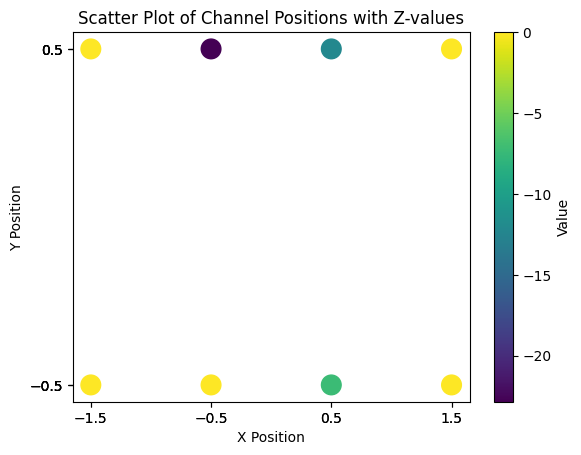

[0, 0, -7.30615234375, -8.029052734375, 0, -21.870849609375, -8.905029296875, -7.989013671875]


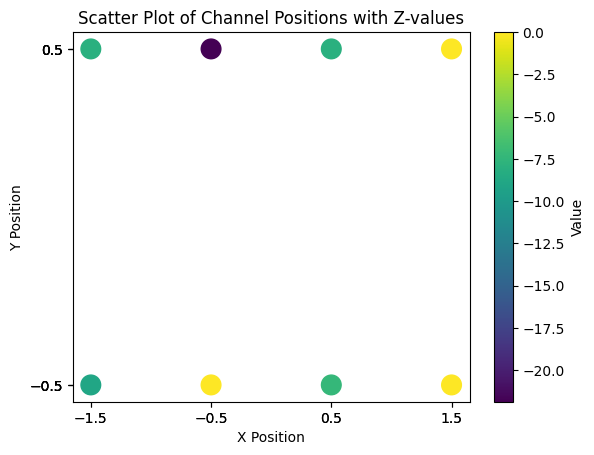

[0, 0, -19.371826171875, -23.090087890625, -7.146484375, 0, 0, 0]


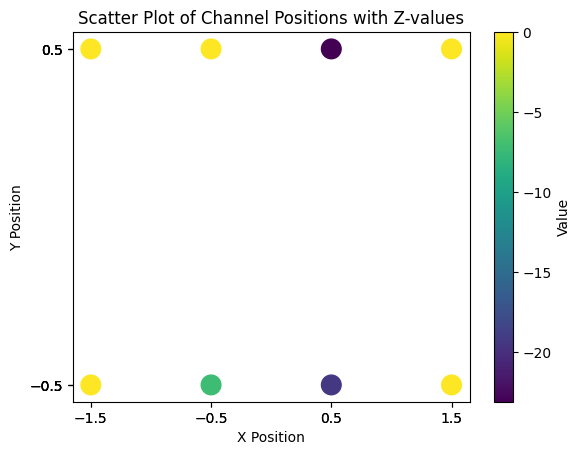

[0, 0, 0, -15.4970703125, -7.0263671875, -41.50732421875, -8.653564453125, 0]


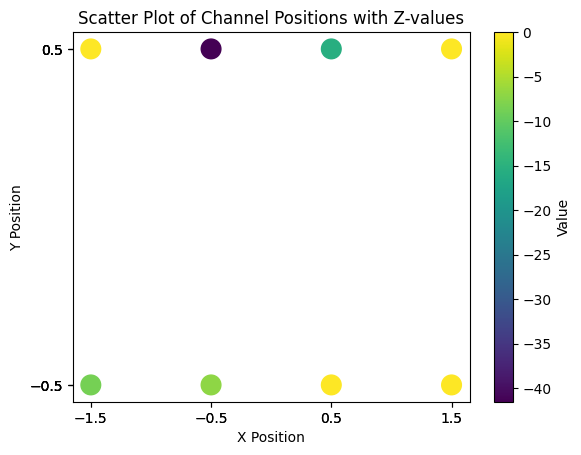

[0, 0, 0, 0, 0, -7.240234375, 0, 0]


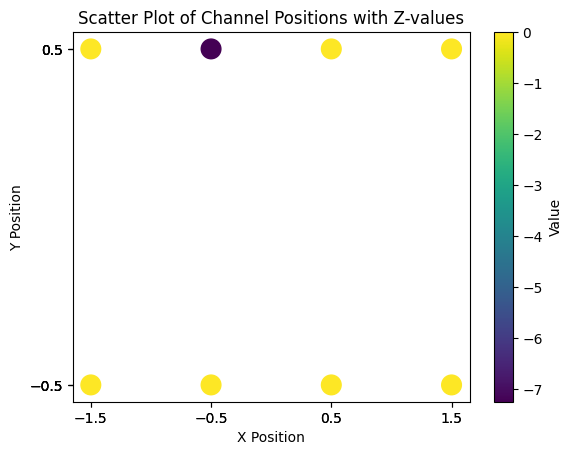

[0, 0, 0, -20.89306640625, 0, 0, -7.47802734375, 0]


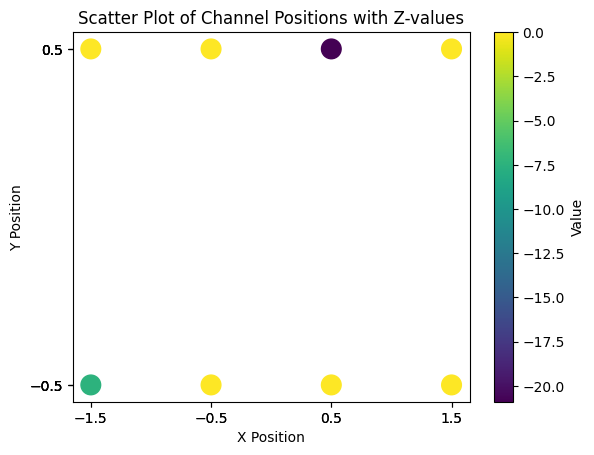

[-7.45703125, -8.865234375, -13.626953125, -11.337158203125, 0, -10.074462890625, 0, -11.125244140625]


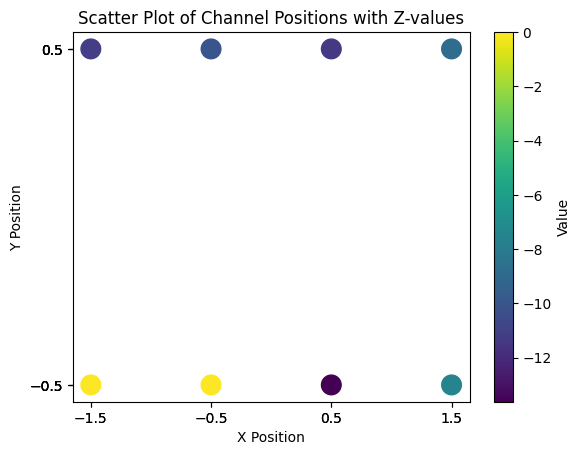

[0, 0, 0, -7.82568359375, -11.67431640625, -17.610595703125, 0, 0]


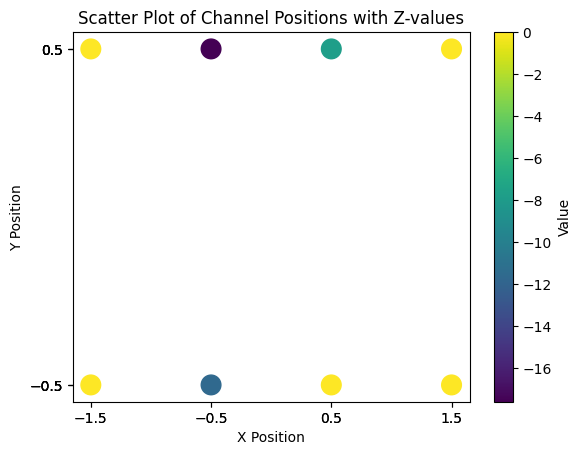

[0, 0, -14.684814453125, -7.016357421875, 0, -10.44384765625, -7.052001953125, 0]


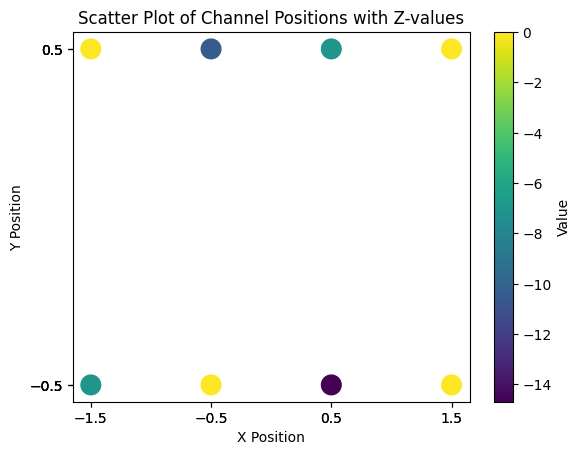

[0, -7.50537109375, 0, -13.76513671875, 0, -7.2353515625, 0, 0]


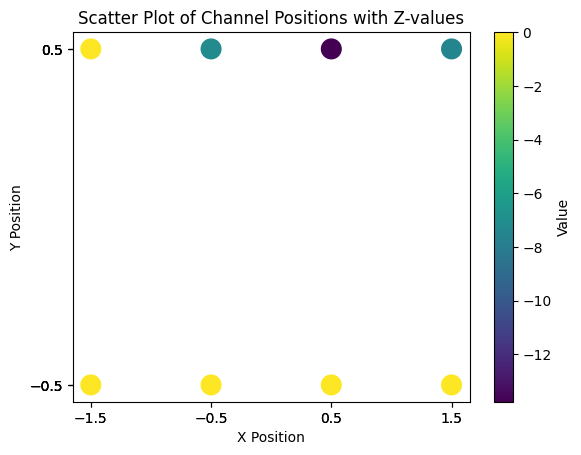

[0, 0, 0, -7.6279296875, -16.556884765625, -15.542236328125, 0, 0]


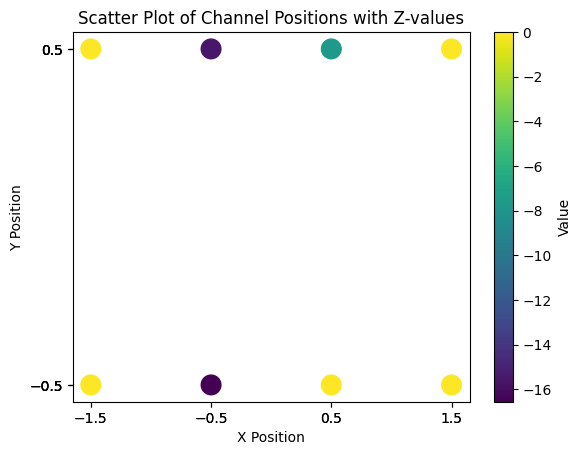

[0, 0, 0, -36.335693359375, 0, 0, -7.659423828125, -30.125]


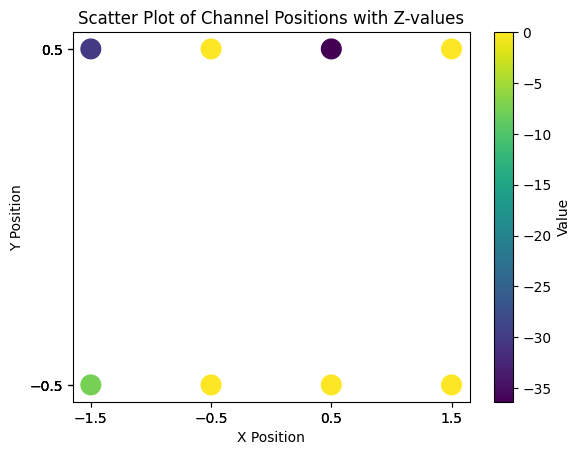

[0, 0, -7.333251953125, -31.59033203125, 0, -25.239990234375, 0, 0]


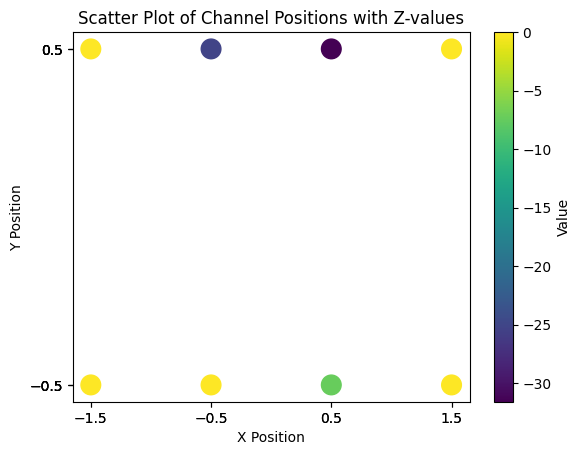

[0, 0, 0, 0, 0, -20.272216796875, -7.49462890625, -10.963623046875]


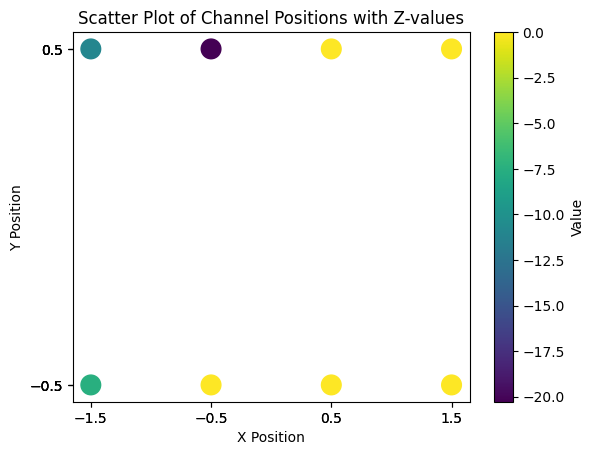

[0, 0, -32.509521484375, 0, 0, -10.96435546875, 0, -11.77734375]


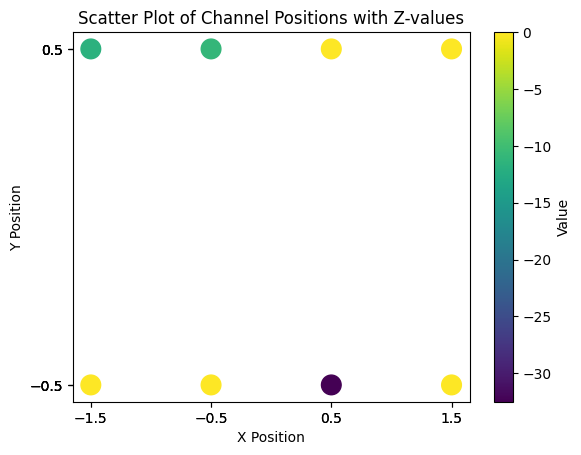

[0, 0, 0, -12.78369140625, -13.54736328125, -12.416748046875, 0, 0]


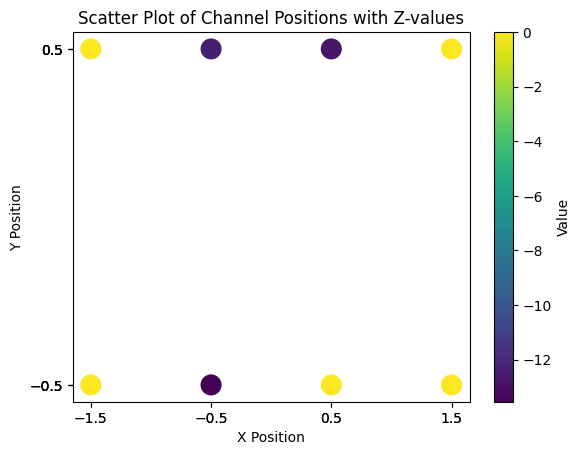

[0, 0, 0, -13.840087890625, -8.281494140625, -40.267578125, 0, -8.292236328125]


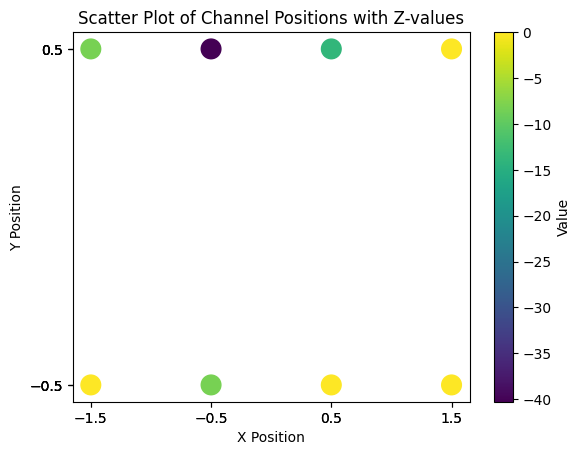

[0, 0, -7.39599609375, -14.209716796875, 0, -18.521484375, 0, 0]


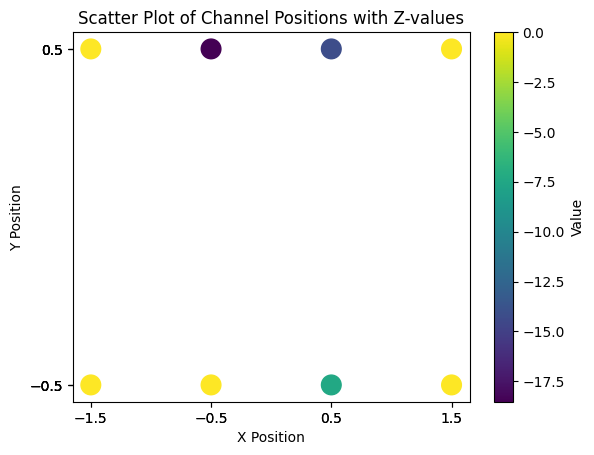

[0, 0, -13.560302734375, -21.27490234375, 0, 0, -7.511962890625, 0]


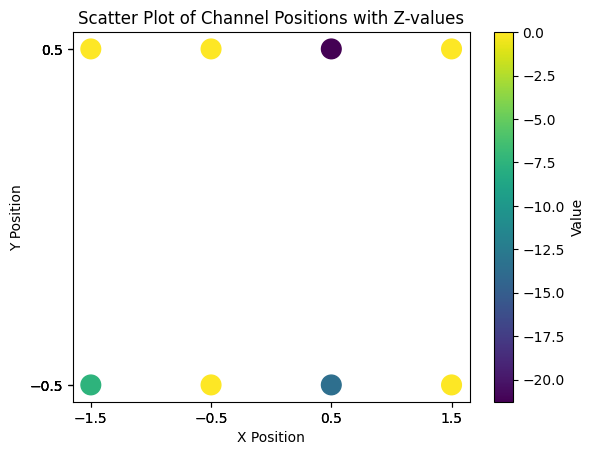

[0, 0, -7.203857421875, 0, -24.615966796875, -9.767822265625, 0, -12.410888671875]


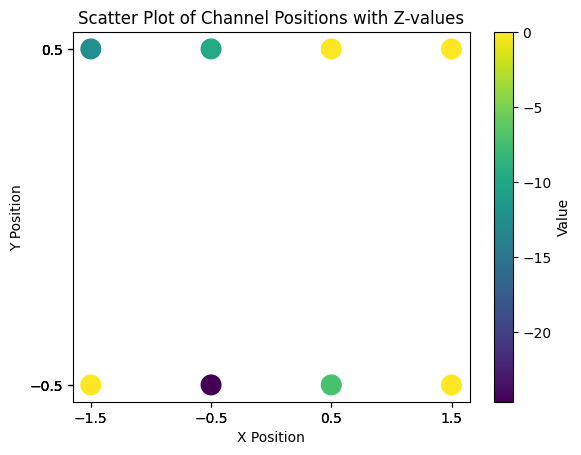

[0, 0, 0, -14.24853515625, -15.366455078125, -23.572021484375, 0, 0]


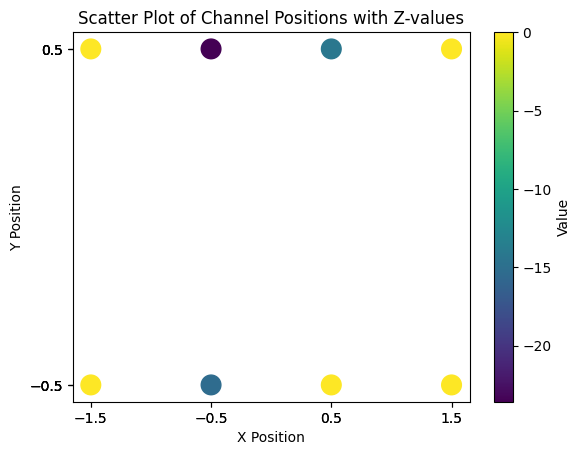

[0, 0, -11.653564453125, -7.512939453125, 0, -11.847412109375, 0, 0]


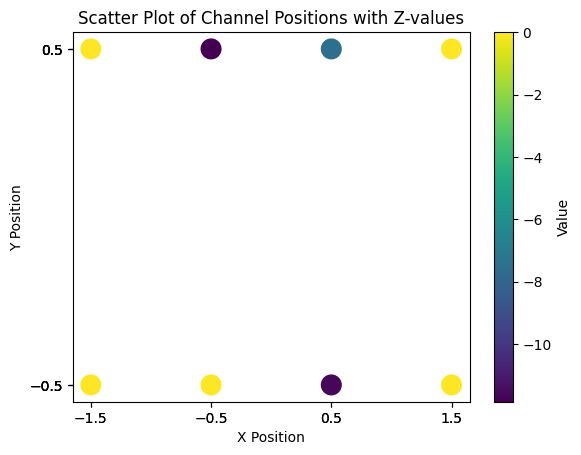

[0, 0, 0, -8.742919921875, 0, -23.048095703125, 0, -15.426025390625]


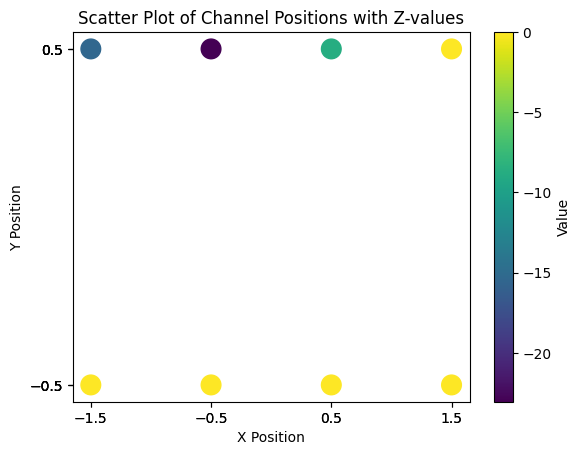

[0, -8.511474609375, 0, -79.116943359375, 0, -23.755126953125, 0, 0]


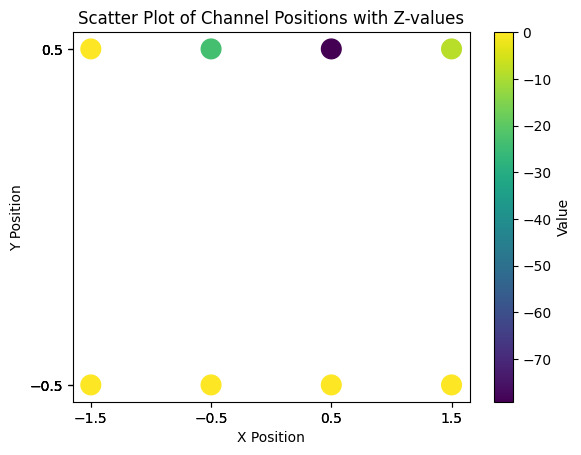

[0, -7.6650390625, 0, 0, 0, -26.720947265625, -8.160400390625, 0]


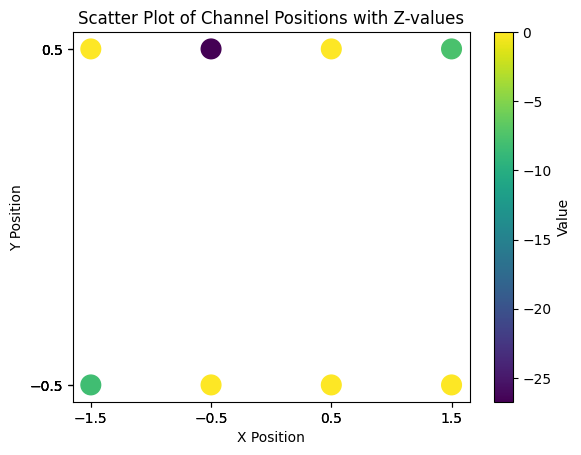

[0, -10.462646484375, 0, 0, 0, -25.72900390625, 0, -23.7255859375]


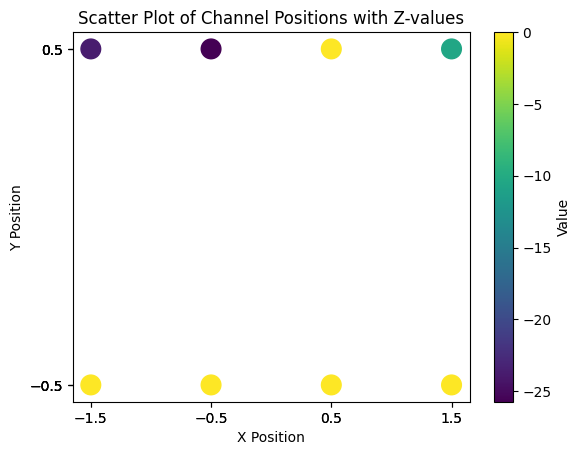

[0, -11.446533203125, -23.137939453125, -52.7734375, -14.7841796875, 0, 0, 0]


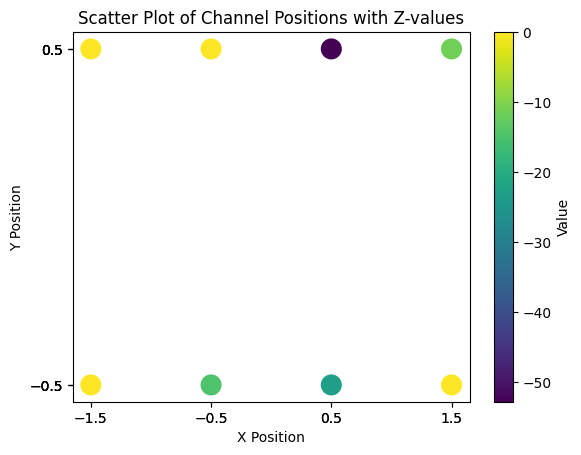

[0, -8.998046875, 0, 0, 0, 0, 0, -22.1083984375]


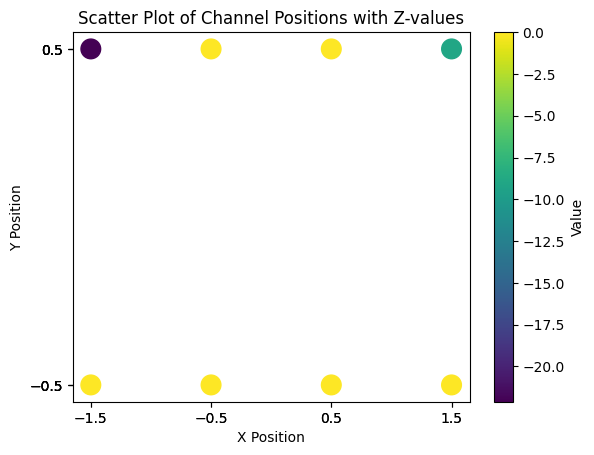

[0, -8.373046875, 0, -15.78076171875, 0, -22.035888671875, -7.114501953125, -24.912353515625]


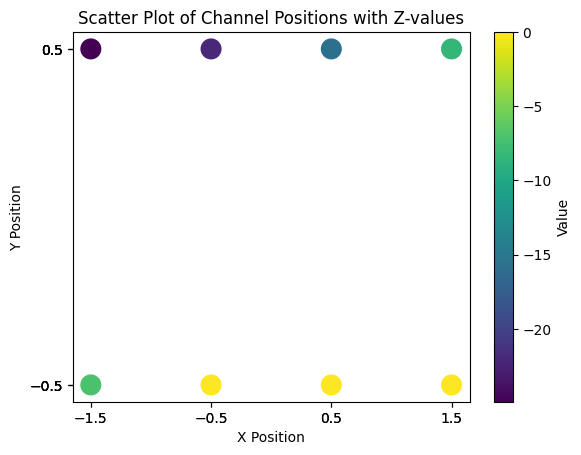

[0, 0, 0, 0, 0, -25.551025390625, -8.095947265625, -8.531005859375]


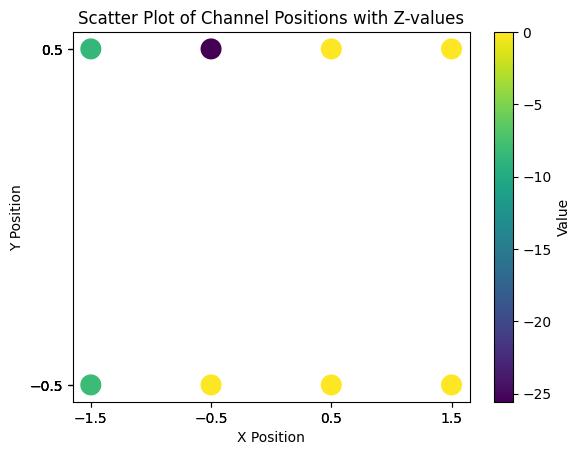

[0, 0, 0, -10.805908203125, -11.806884765625, -49.39501953125, 0, 0]


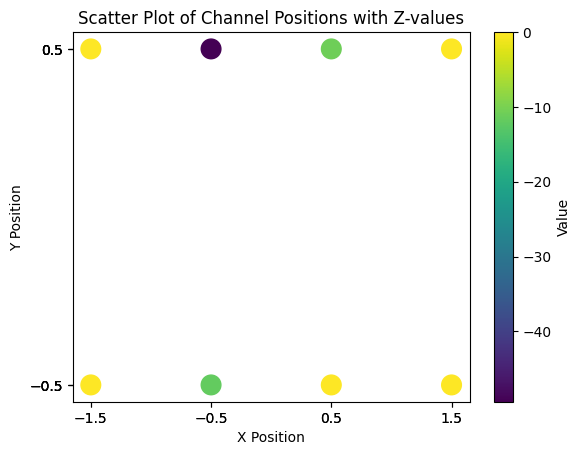

[0, 0, -25.6240234375, -26.7236328125, 0, -21.13916015625, 0, 0]


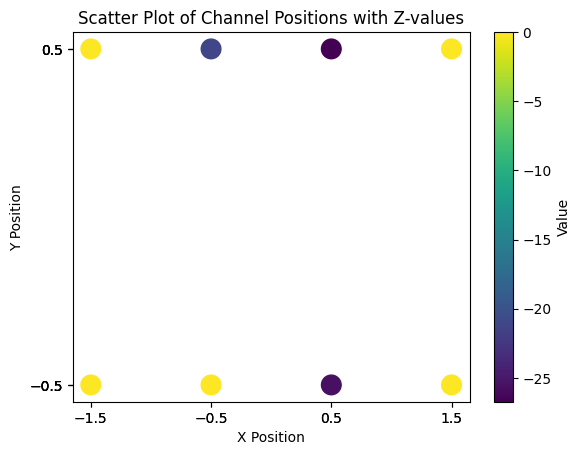

[0, 0, 0, -7.55615234375, 0, -13.14453125, 0, 0]


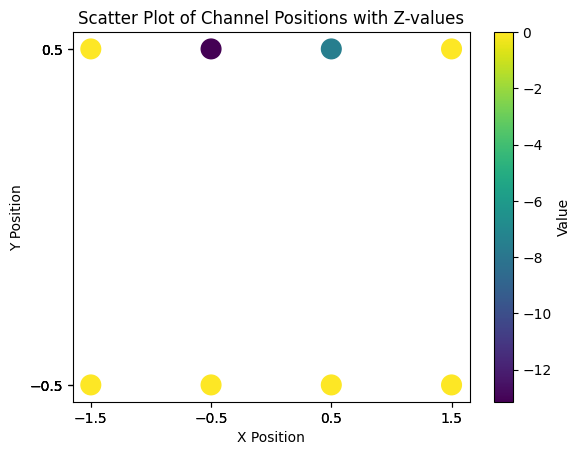

[0, 0, -12.934814453125, 0, -12.531005859375, -17.289794921875, 0, 0]


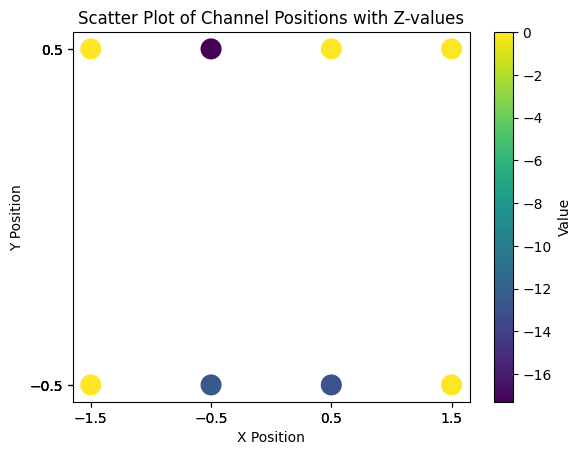

[0, 0, 0, -15.821533203125, 0, -7.203369140625, -8.13623046875, 0]


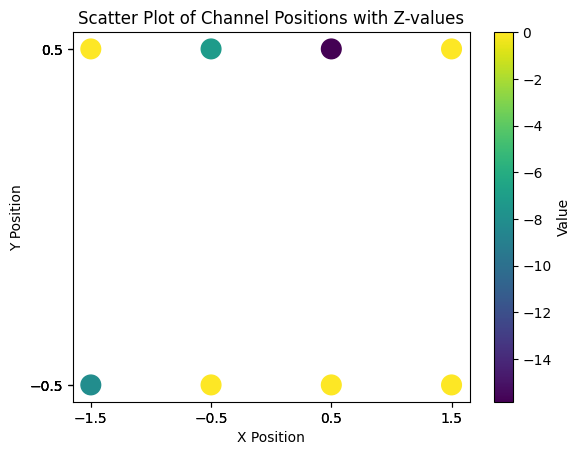

[-7.045654296875, 0, 0, -33.322021484375, -7.510009765625, 0, 0, 0]


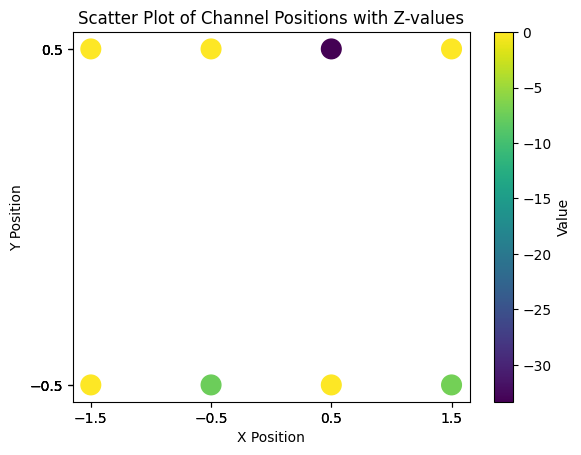

[-7.416748046875, 0, -44.7548828125, 0, -23.6376953125, -34.934814453125, 0, 0]


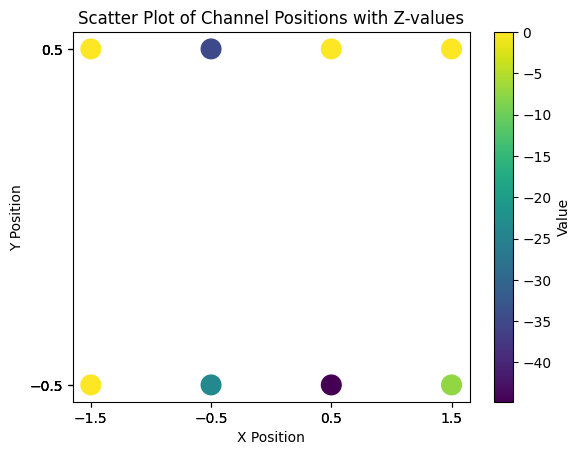

[0, 0, -7.24365234375, 0, 0, 0, -16.528564453125, 0]


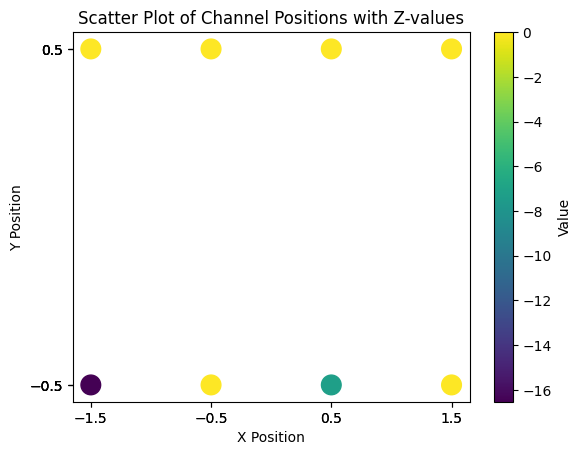

[0, 0, -18.6982421875, 0, 0, -12.14404296875, 0, 0]


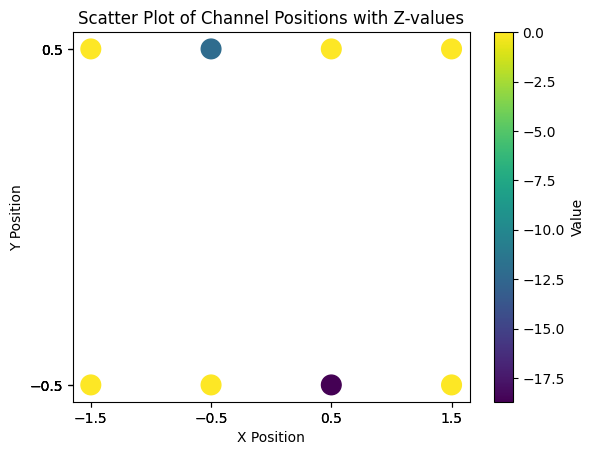

[-7.404052734375, 0, -7.09716796875, -44.3798828125, 0, 0, -11.29248046875, -7.787109375]


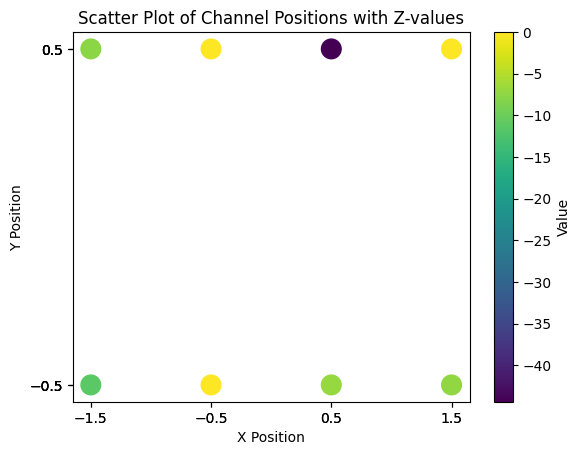

[0, 0, 0, -69.74169921875, -25.7041015625, 0, 0, 0]


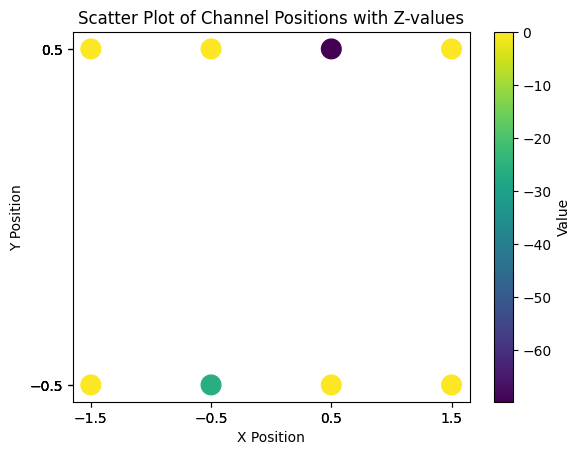

[0, 0, -7.073974609375, 0, 0, -10.231689453125, 0, 0]


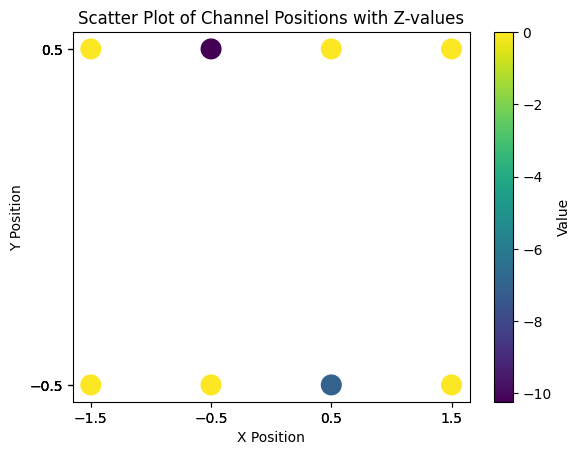

[0, 0, 0, 0, 0, -12.44580078125, 0, -13.699951171875]


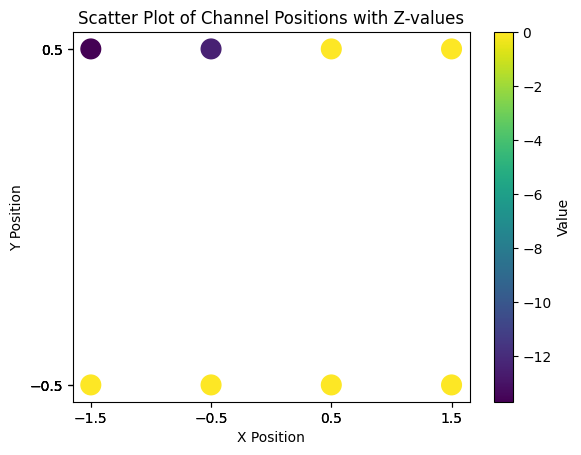

[0, 0, 0, -44.27392578125, -56.47998046875, 0, -22.469482421875, -14.2802734375]


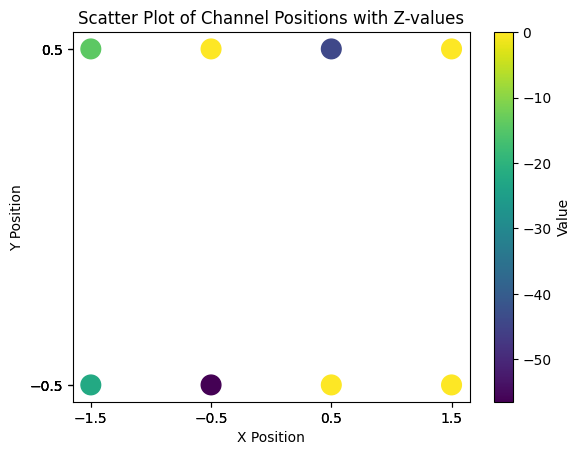

[-7.205078125, -7.871826171875, -7.862548828125, -8.438720703125, -17.083740234375, -14.260009765625, 0, -28.61767578125]


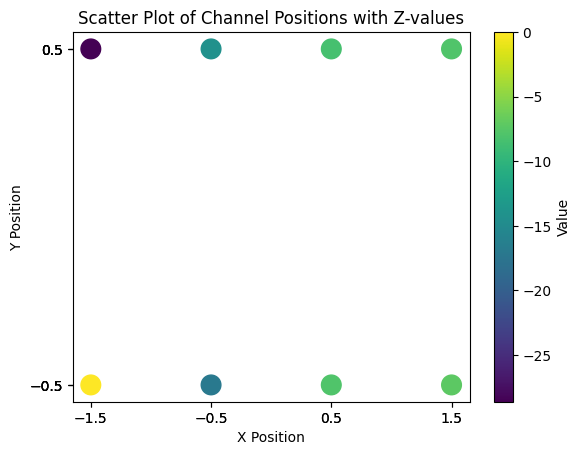

[0, 0, -7.674072265625, -8.3232421875, 0, -37.35986328125, 0, -8.99560546875]


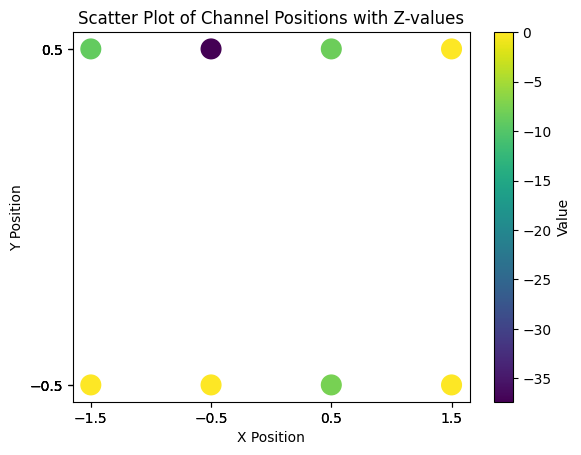

[-7.35009765625, -7.99560546875, -8.323486328125, -12.218994140625, 0, -14.732666015625, 0, 0]


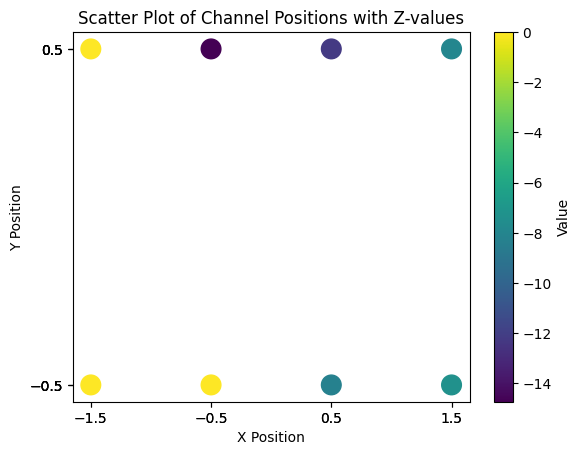

[0, 0, 0, -8.57861328125, -14.687255859375, -21.0361328125, -17.11865234375, -8.53515625]


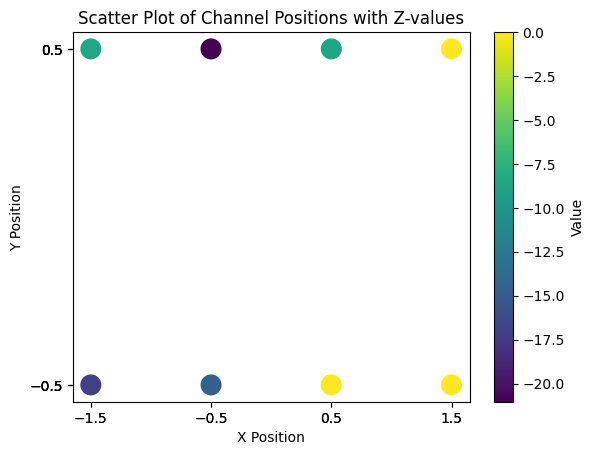

[0, 0, 0, -27.136962890625, -7.768798828125, -25.906494140625, 0, 0]


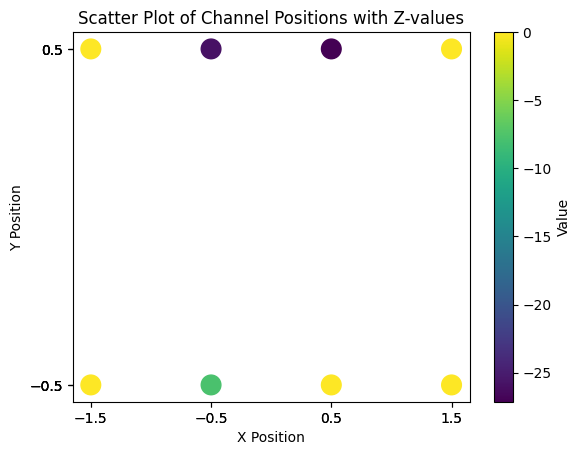

[-8.569580078125, 0, 0, -7.21923828125, -9.1728515625, -7.1064453125, 0, -14.698974609375]


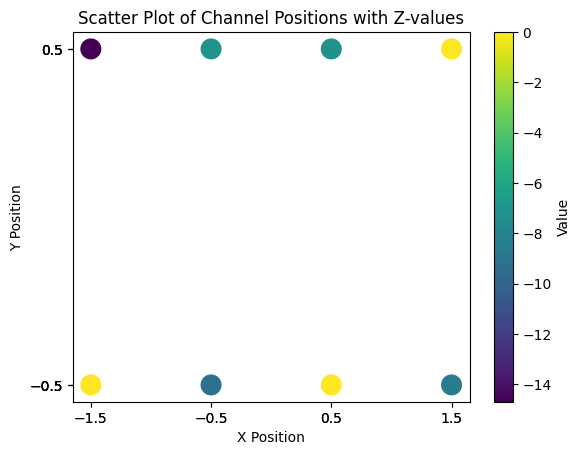

[0, -7.02294921875, -7.78857421875, -29.08447265625, 0, 0, -8.686279296875, 0]


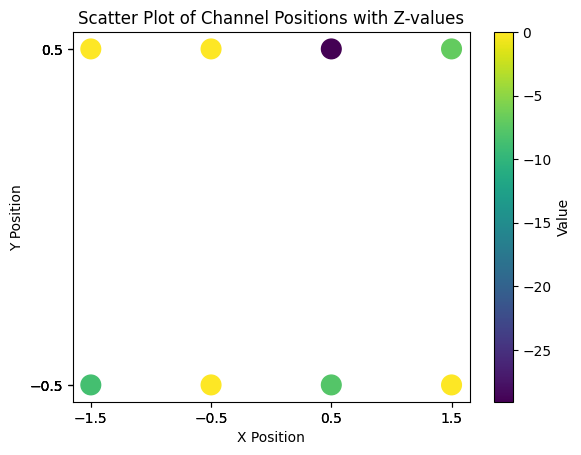

[0, -8.056884765625, -24.239990234375, 0, -15.80419921875, -7.124755859375, 0, 0]


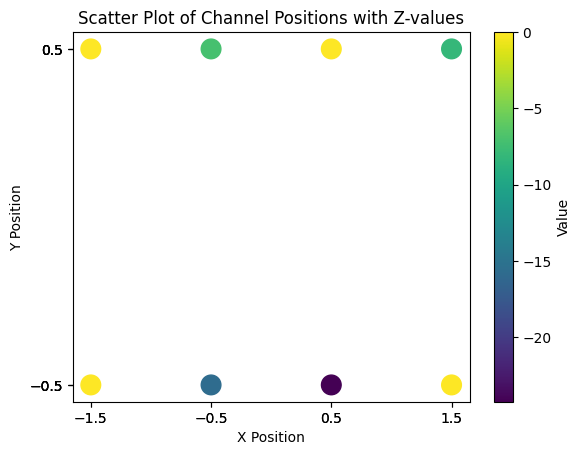

[0, 0, -7.34912109375, 0, 0, 0, 0, -8.942626953125]


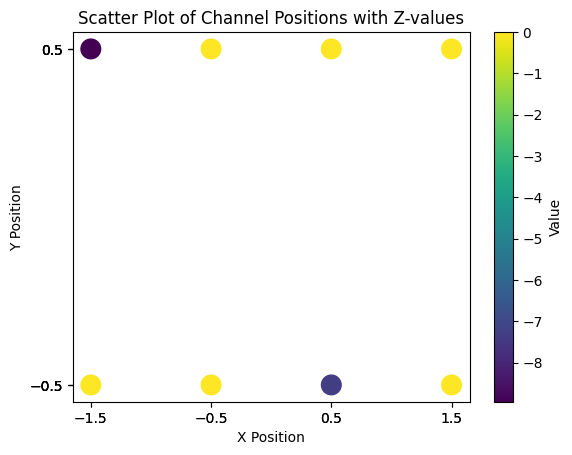

[0, -7.367431640625, -7.158935546875, -12.676513671875, 0, -44.905517578125, -14.482666015625, -13.03173828125]


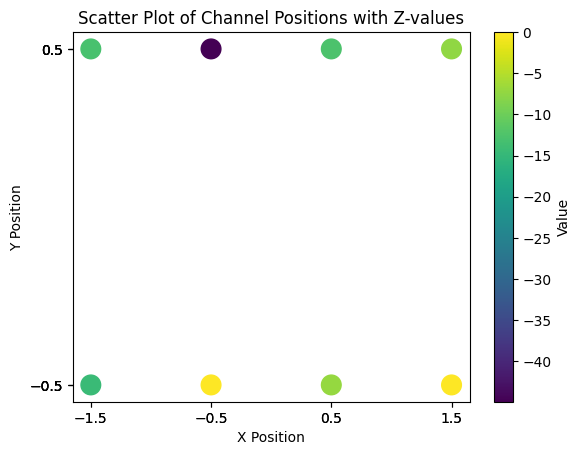

[0, 0, -40.28564453125, -13.246337890625, -7.439453125, 0, -8.017333984375, 0]


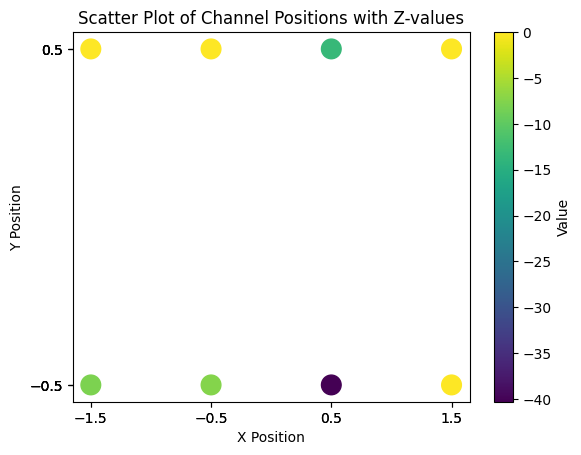

[0, 0, 0, -36.77685546875, 0, 0, 0, 0]


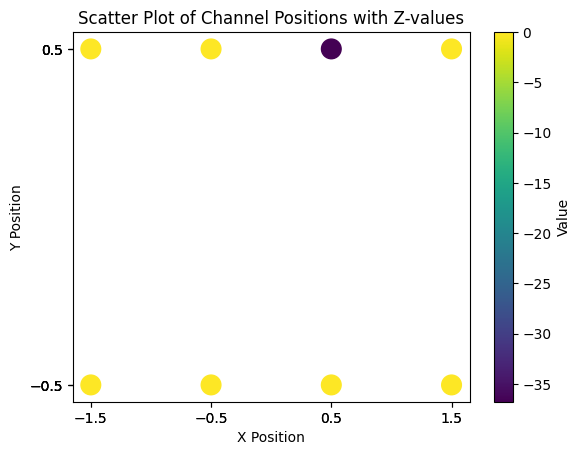

[0, -7.098388671875, -8.993408203125, 0, 0, -7.018310546875, 0, 0]


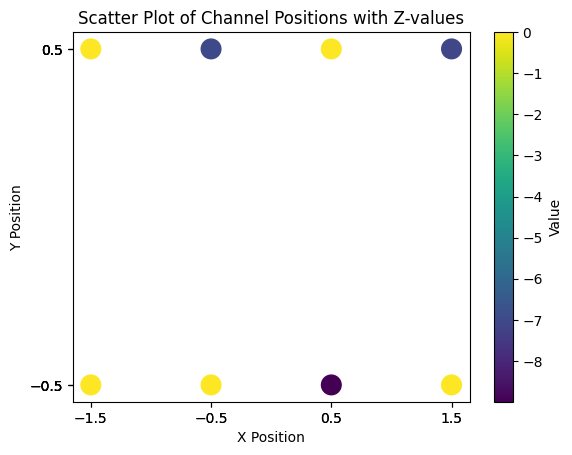

[0, 0, -8.3115234375, -7.04443359375, -30.450439453125, -72.3876953125, 0, 0]


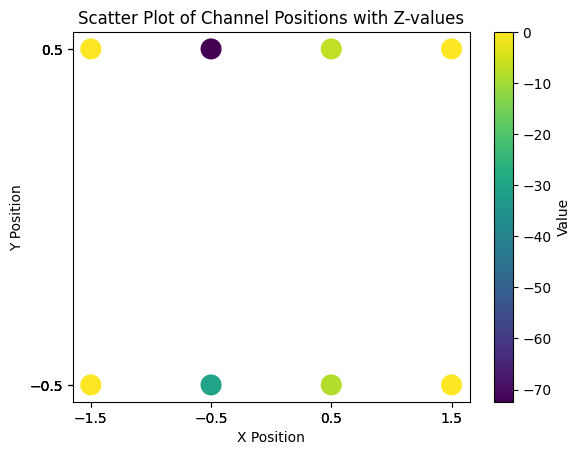

[0, 0, 0, -13.3427734375, -7.383544921875, -7.8271484375, 0, 0]


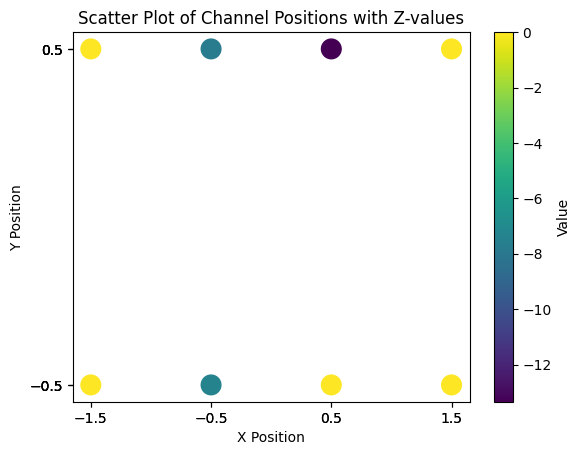

[0, -7.6044921875, 0, 0, -13.8876953125, 0, 0, -8.354736328125]


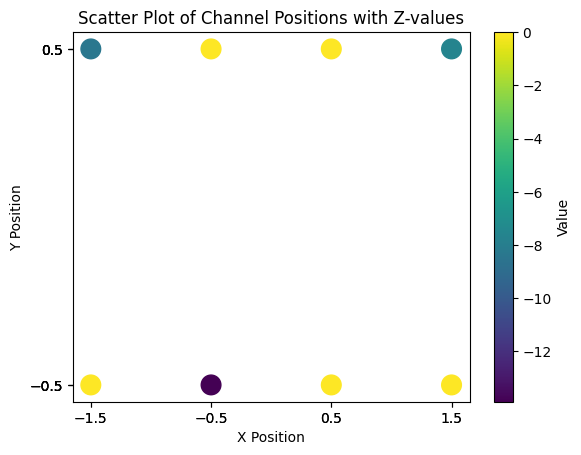

[-7.17919921875, 0, -18.513916015625, -23.714599609375, 0, -31.504150390625, -14.679443359375, -11.75634765625]


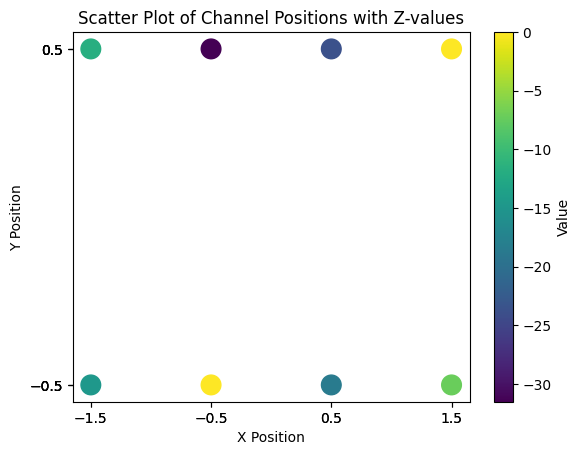

[0, 0, -22.58203125, -12.4345703125, 0, -16.876953125, -7.404541015625, -7.386474609375]


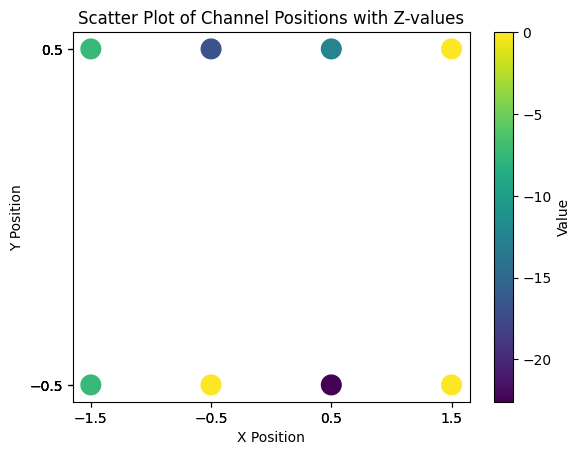

[0, 0, -14.881591796875, 0, 0, 0, -8.311767578125, 0]


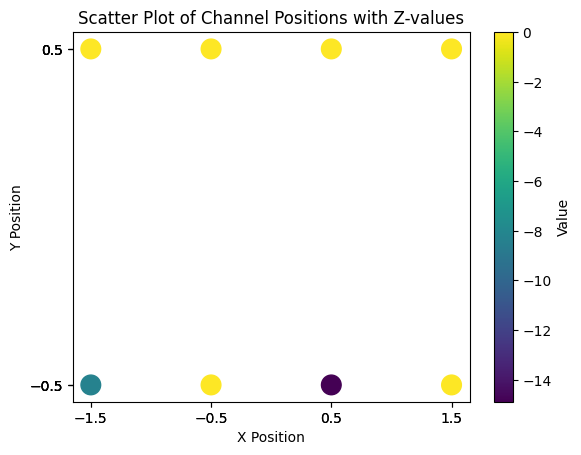

[0, 0, 0, -11.74755859375, -7.2822265625, -39.94189453125, -8.242431640625, 0]


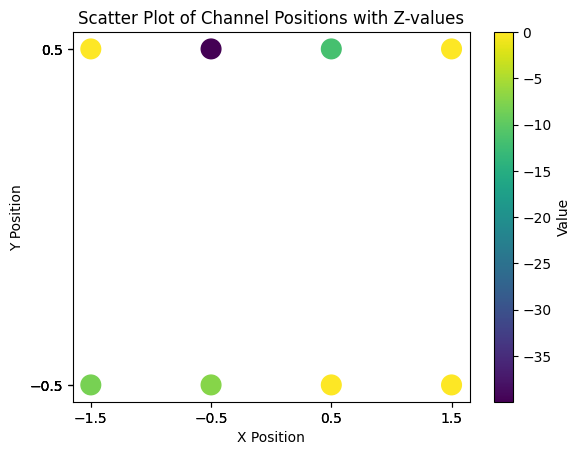

[0, -7.53857421875, 0, 0, -7.22900390625, -33.985595703125, -12.39453125, 0]


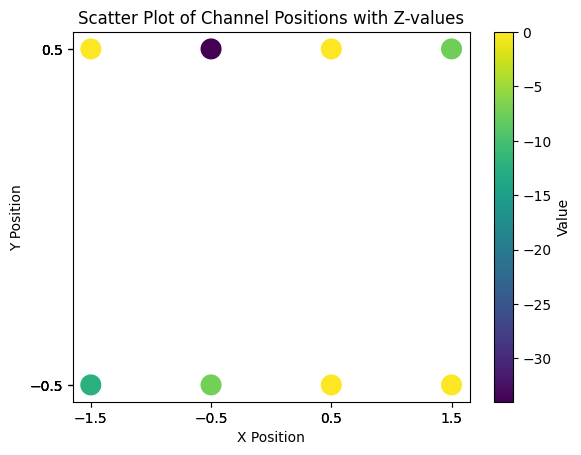

[0, 0, 0, 0, 0, -13.44189453125, -9.217529296875, 0]


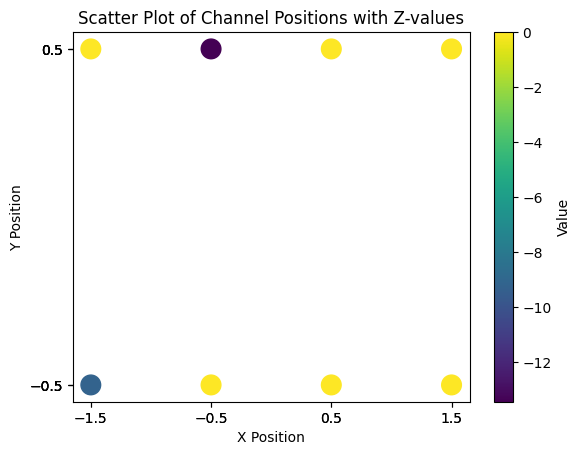

[-7.218505859375, 0, -7.068115234375, -7.024658203125, -7.238525390625, 0, -7.1337890625, 0]


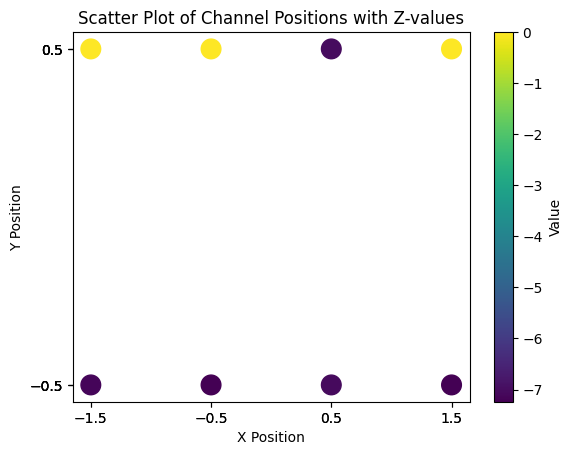

[0, 0, 0, -13.794921875, 0, 0, 0, 0]


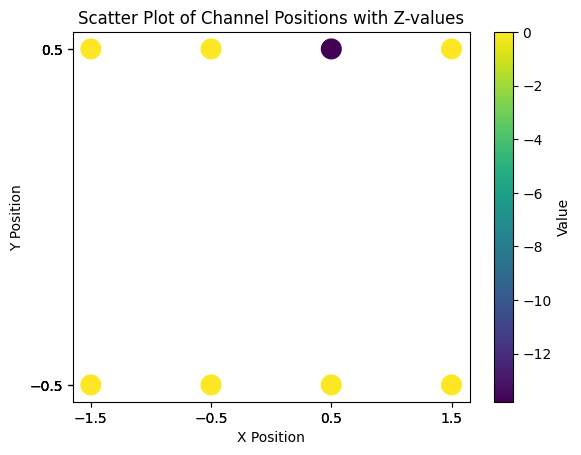

[0, 0, 0, -34.14404296875, 0, -35.766357421875, 0, 0]


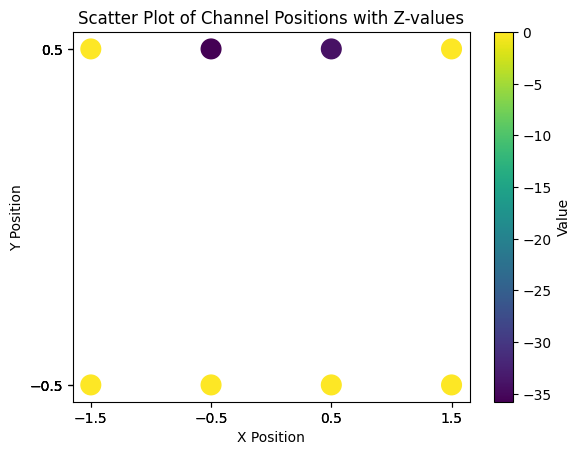

[0, 0, 0, 0, 0, -17.027587890625, 0, -24.101318359375]


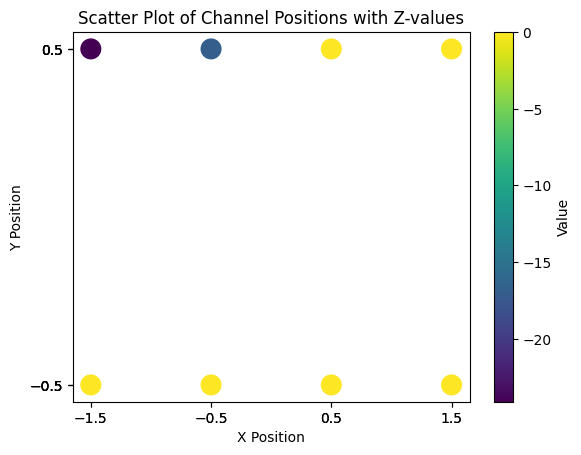

[0, 0, 0, -41.608154296875, -9.541748046875, 0, 0, 0]


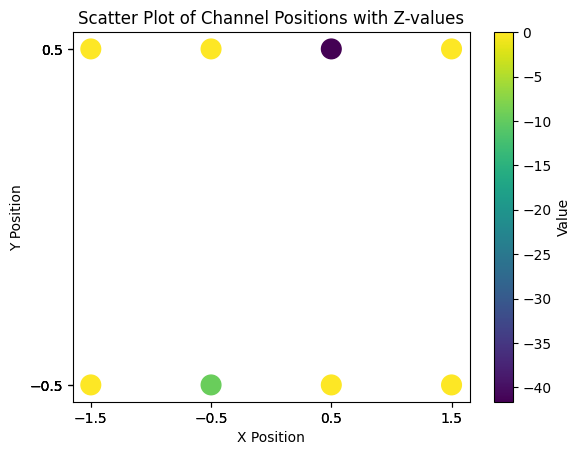

[0, 0, 0, -15.739013671875, 0, -11.103515625, 0, 0]


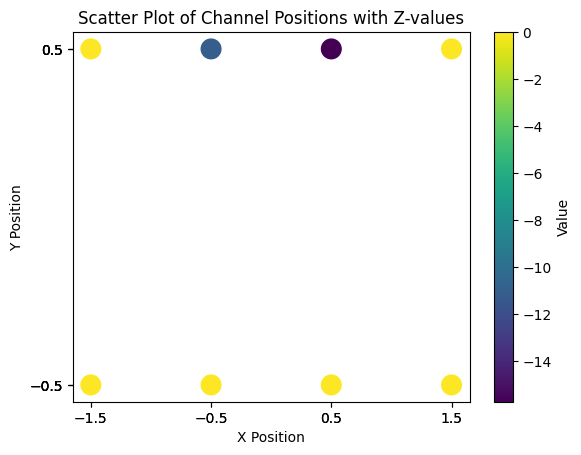

[0, 0, 0, -57.2509765625, -17.40185546875, 0, 0, 0]


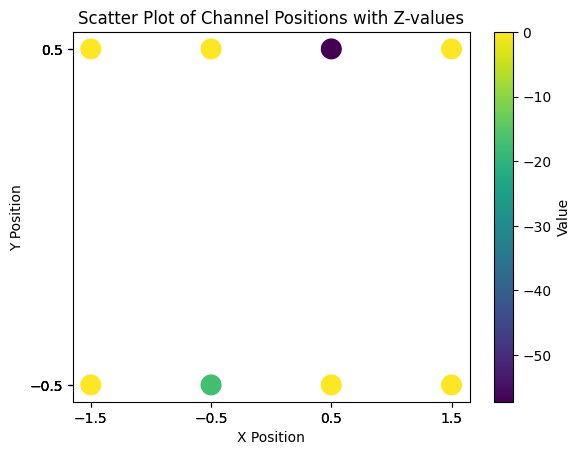

[0, 0, -16.266845703125, -12.37060546875, 0, -33.216064453125, 0, -7.3203125]


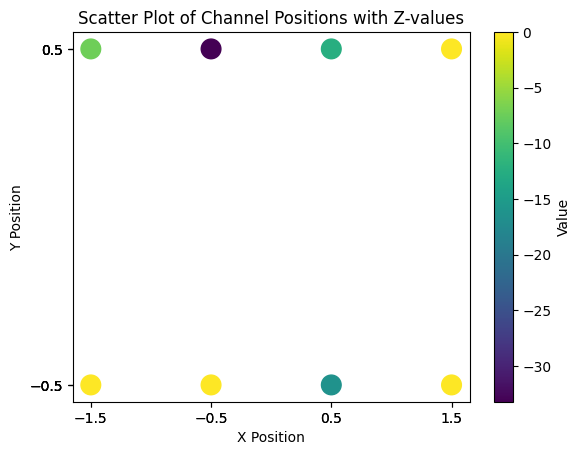

[0, 0, -16.085205078125, -11.450439453125, 0, -9.658935546875, 0, -13.765625]


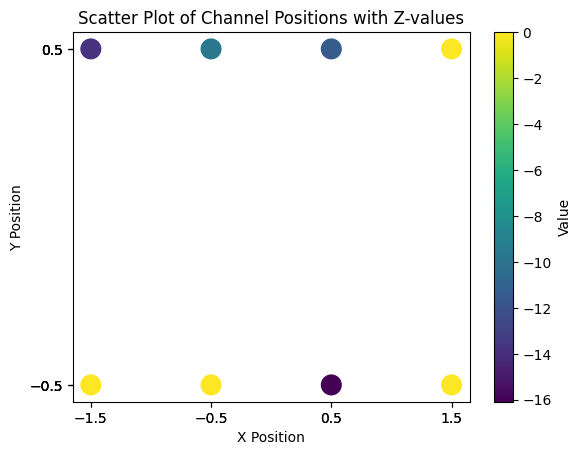

[0, 0, 0, -36.247314453125, 0, -40.535888671875, 0, -11.267333984375]


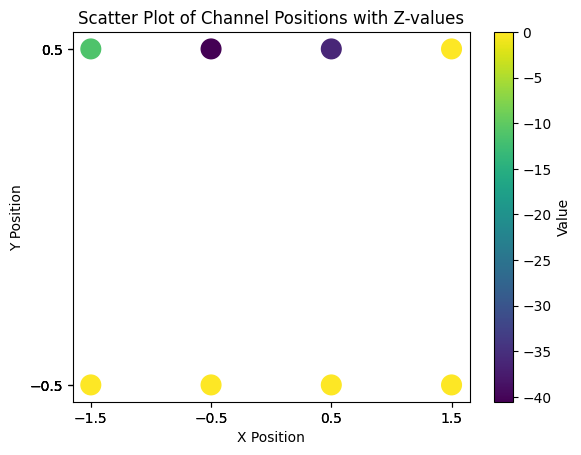

[0, 0, -12.435791015625, -34.555419921875, -29.015625, -15.343505859375, 0, 0]


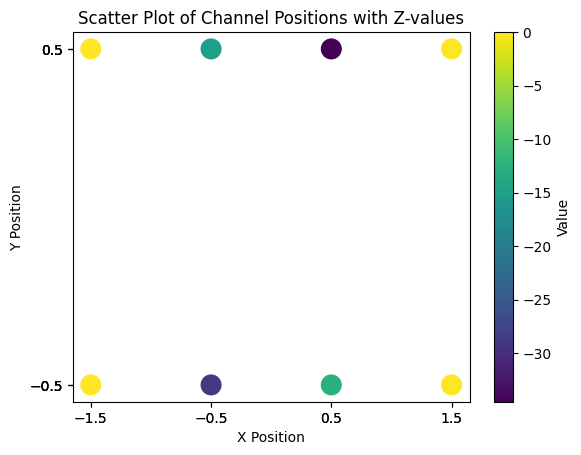

[0, 0, 0, -25.66845703125, 0, 0, -14.171630859375, -10.46875]


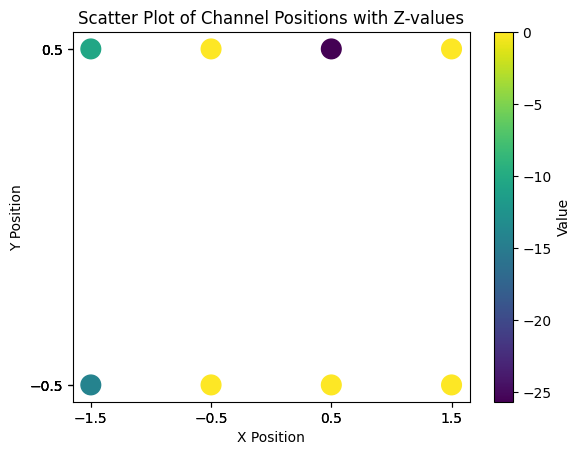

[0, 0, -7.18017578125, -24.82275390625, 0, -9.454833984375, 0, -12.603759765625]


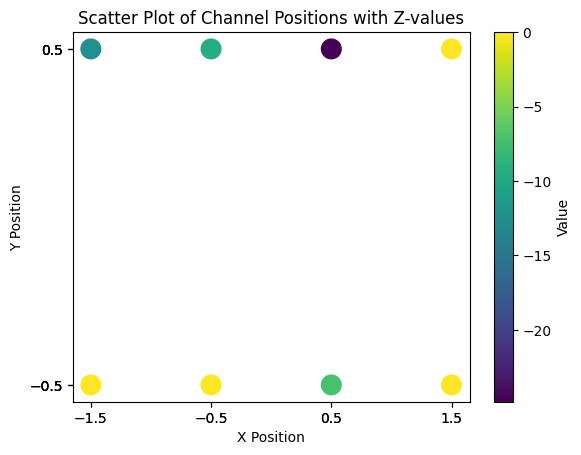

[0, 0, -17.61865234375, 0, 0, -19.427490234375, 0, -24.2646484375]


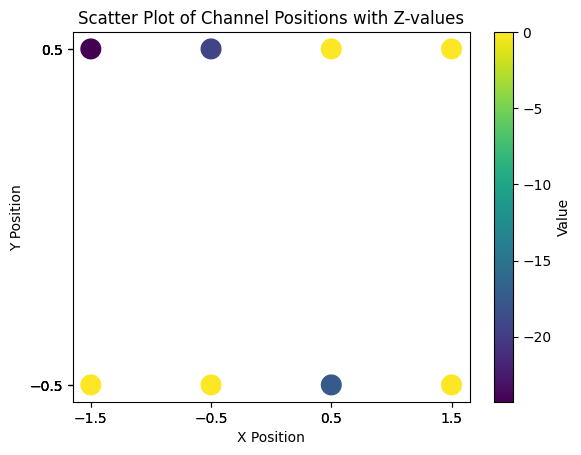

[0, 0, -11.250732421875, -27.413818359375, -15.981201171875, 0, 0, 0]


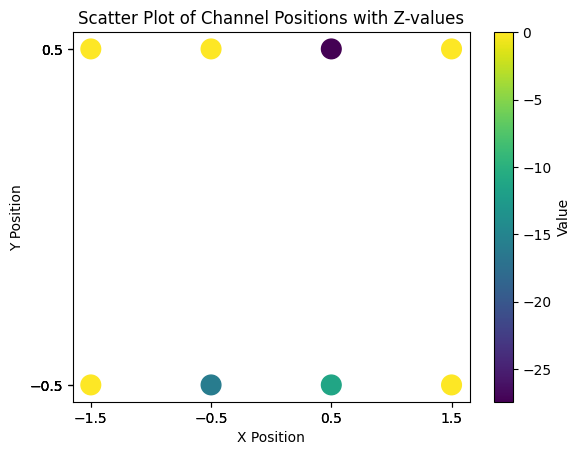

[0, 0, -7.754638671875, -12.622314453125, -15.0185546875, 0, 0, -11.346435546875]


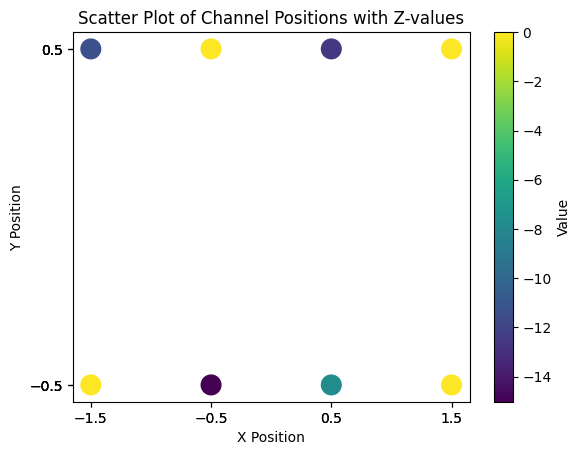

[0, 0, 0, -13.522705078125, -13.578369140625, -21.333984375, 0, 0]


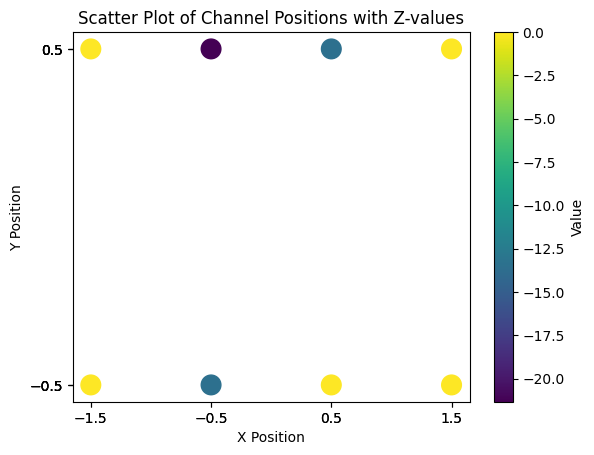

[0, 0, -14.809326171875, -40.180419921875, 0, -12.597412109375, 0, 0]


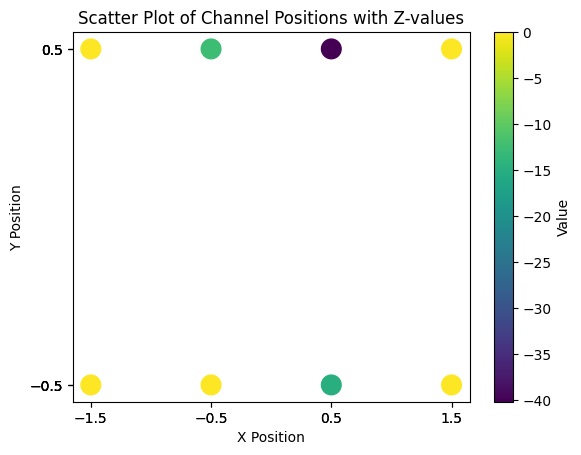

[0, 0, 0, -7.91943359375, -15.8017578125, -9.958740234375, 0, 0]


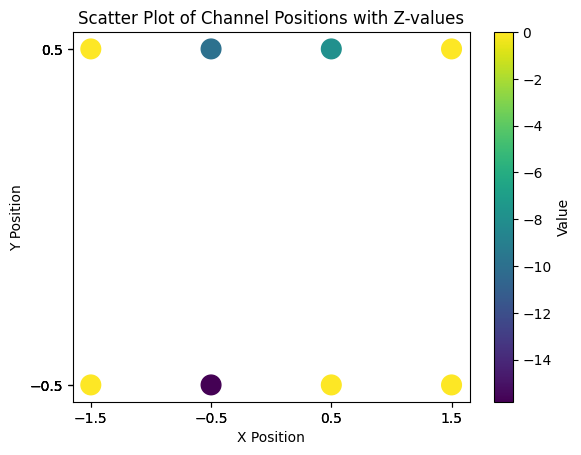

[0, 0, -17.312255859375, -35.264892578125, 0, -11.486328125, 0, -13.962646484375]


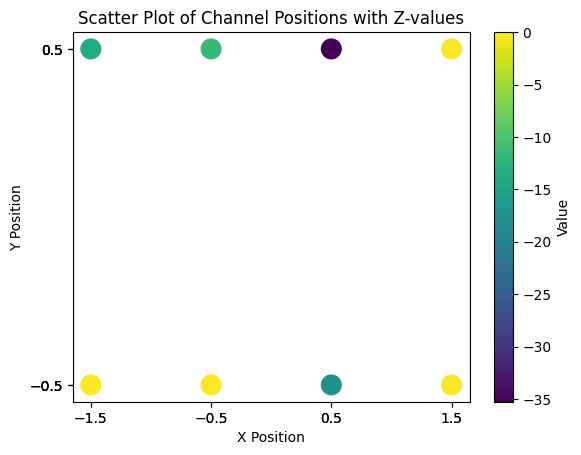

[0, 0, -14.923095703125, -21.66455078125, 0, 0, -16.13525390625, 0]


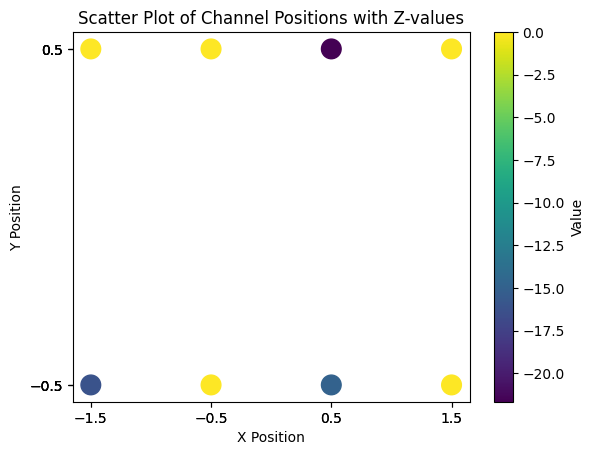

[0, 0, -8.3154296875, -105.307373046875, 0, -11.871826171875, -14.6513671875, -22.339599609375]


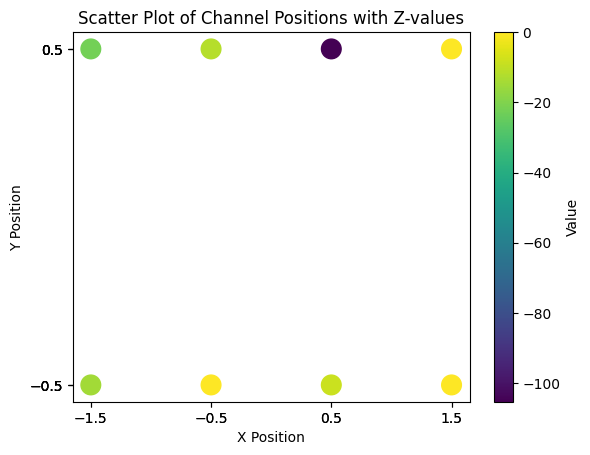

[0, 0, 0, -11.6171875, 0, -21.814697265625, 0, 0]


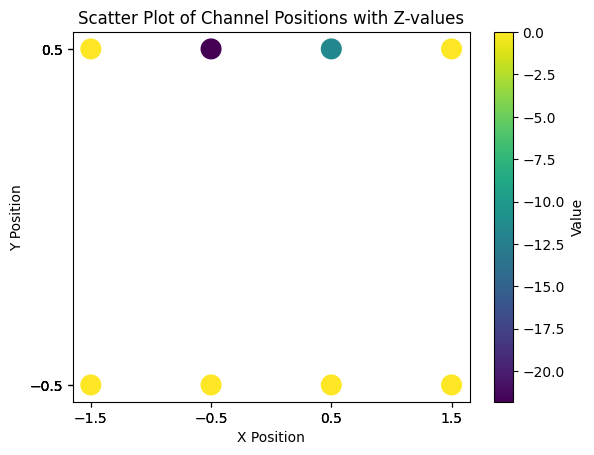

[0, 0, 0, -21.67626953125, -14.093017578125, -31.2080078125, 0, -12.507080078125]


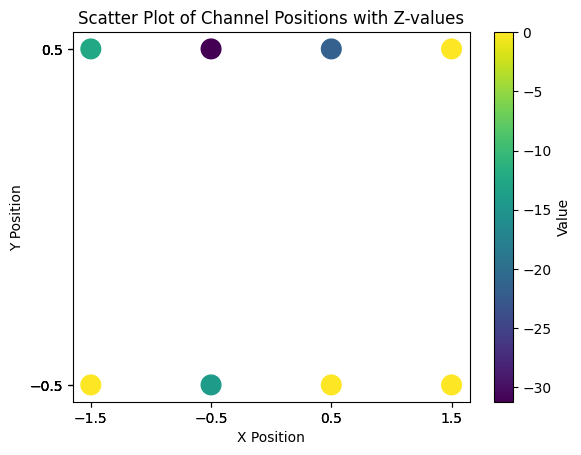

[0, -11.24609375, 0, -23.42822265625, 0, -7.025390625, -7.285888671875, -23.4892578125]


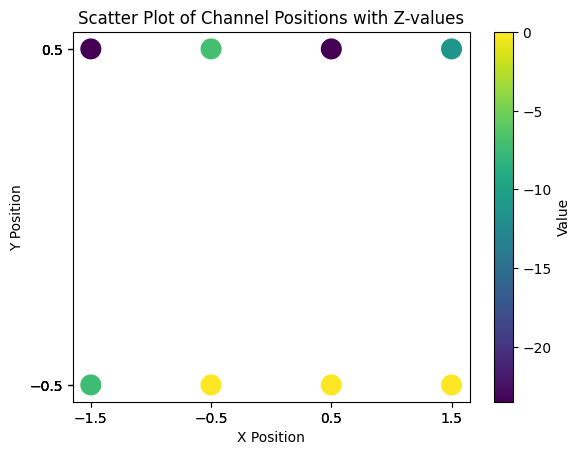

[0, -11.16748046875, -14.53662109375, -12.03955078125, -12.255615234375, -12.82470703125, 0, 0]


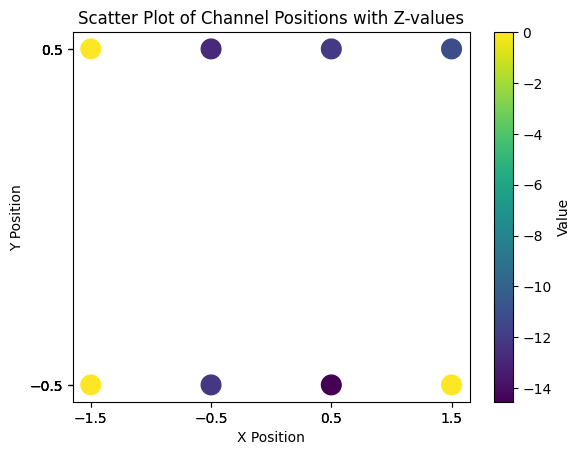

[0, -8.699462890625, 0, -7.402587890625, 0, -13.340576171875, 0, 0]


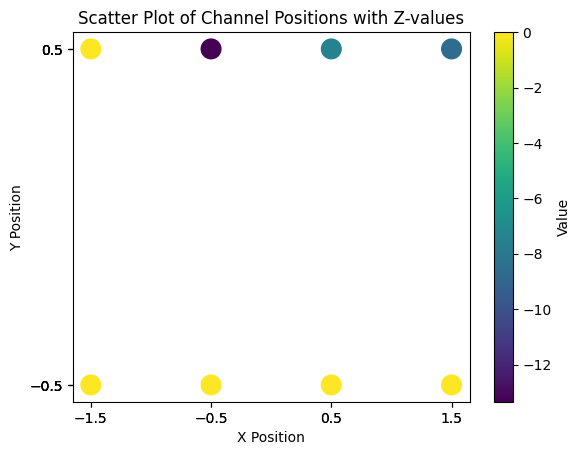

[0, -8.011962890625, 0, -37.43505859375, 0, -7.248779296875, 0, 0]


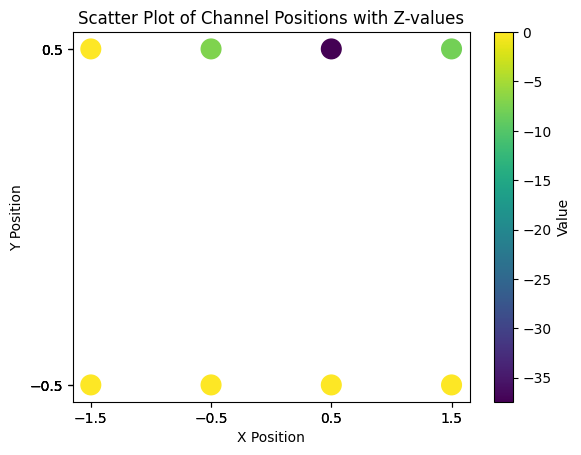

[0, 0, 0, -16.1591796875, -15.95556640625, -11.269287109375, -17.476806640625, -9.529296875]


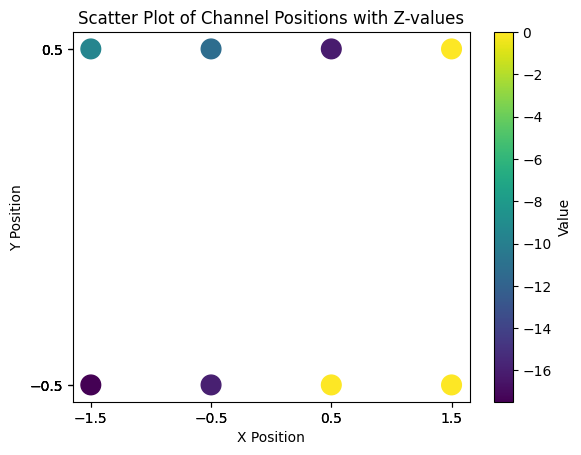

[0, -9.46044921875, 0, -7.011962890625, 0, 0, -12.659423828125, -13.229736328125]


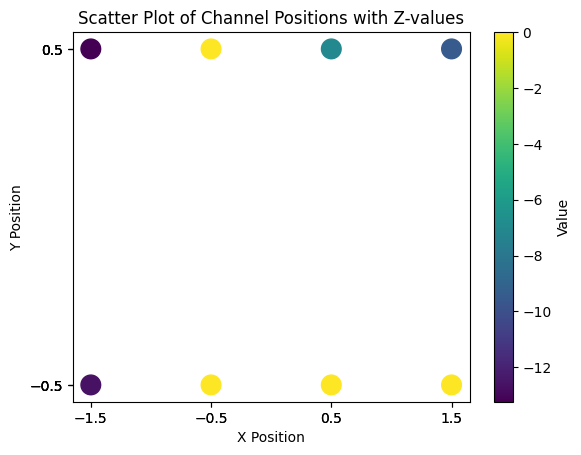

[0, -8.034423828125, -13.725341796875, 0, 0, 0, -56.267822265625, 0]


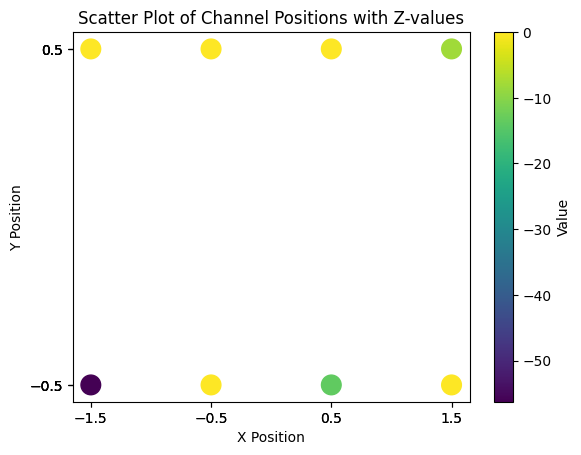

[0, -8.818603515625, 0, 0, 0, -7.032958984375, 0, 0]


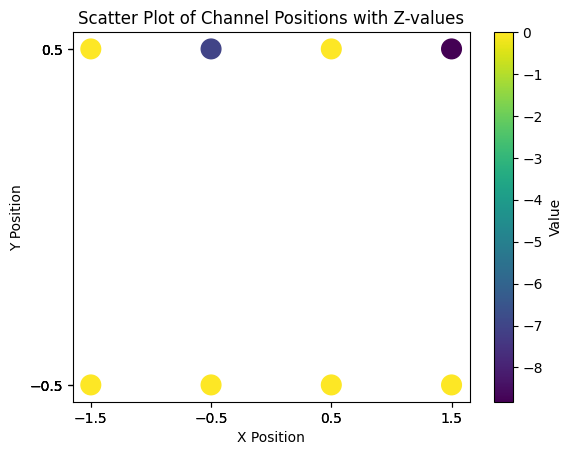

[0, 0, 0, 0, -12.81689453125, -7.52587890625, 0, 0]


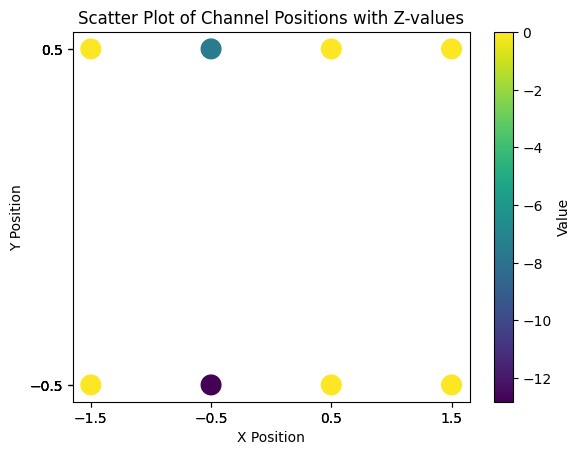

[-7.885986328125, 0, -13.942138671875, 0, 0, -21.841552734375, 0, -28.7158203125]


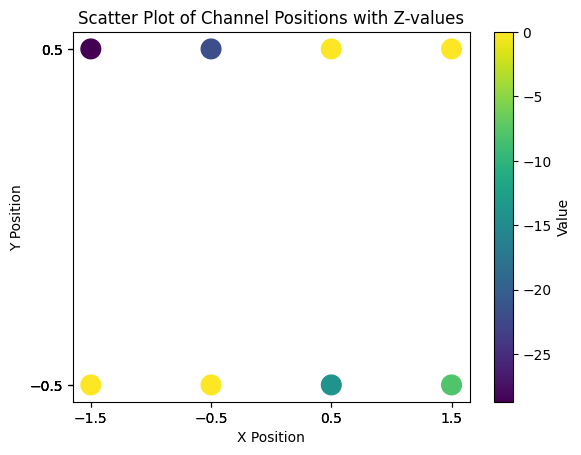

[0, 0, 0, -26.750732421875, -28.584228515625, -13.7294921875, -23.6298828125, 0]


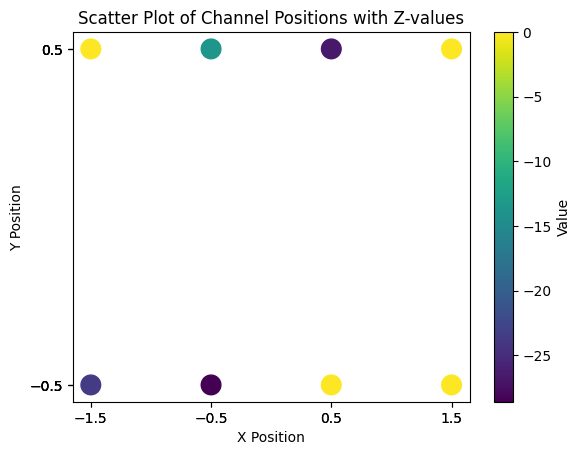

[0, 0, 0, 0, 0, -26.916748046875, 0, -11.810546875]


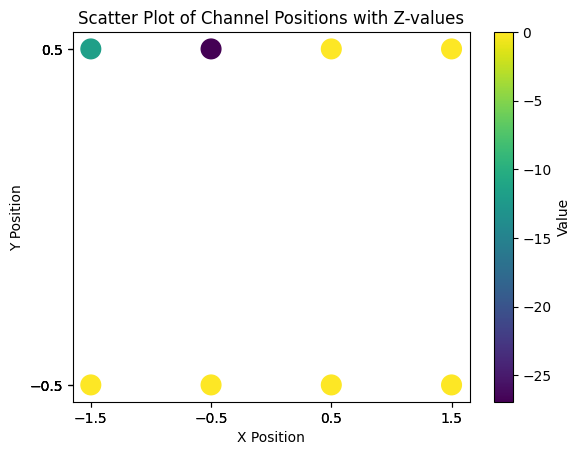

[0, 0, -14.259521484375, -54.1484375, 0, -14.082275390625, 0, 0]


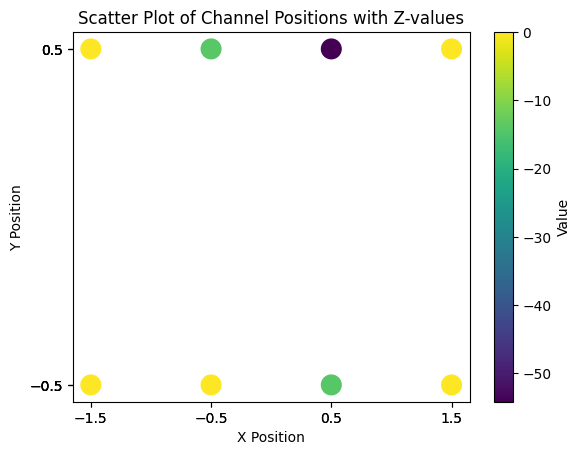

[0, -7.86962890625, -7.519775390625, -7.54296875, 0, -7.5673828125, 0, 0]


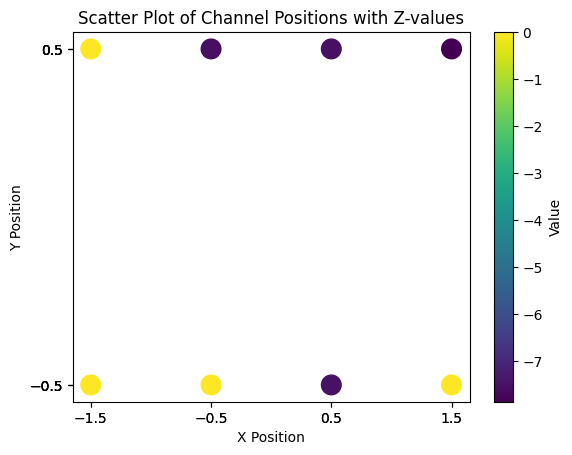

[0, 0, -15.611083984375, -15.31884765625, 0, 0, -38.88818359375, -25.25]


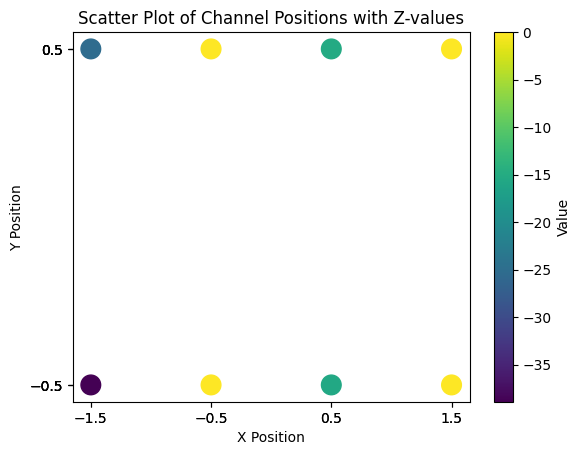

[0, 0, -14.431396484375, -7.795166015625, -7.212890625, -15.862060546875, -23.647216796875, 0]


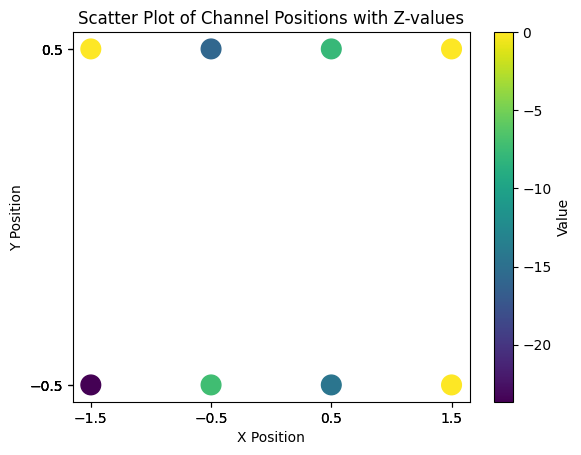

[0, 0, -29.795654296875, -51.22802734375, -15.972900390625, -15.55712890625, -48.050537109375, 0]


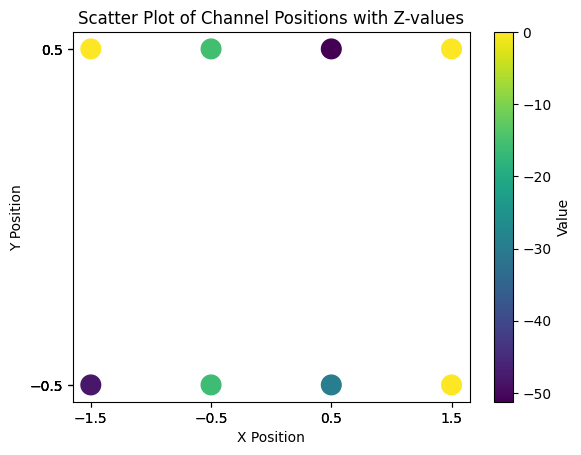

[0, -7.939697265625, 0, -36.59130859375, 0, -9.278076171875, -8.63134765625, 0]


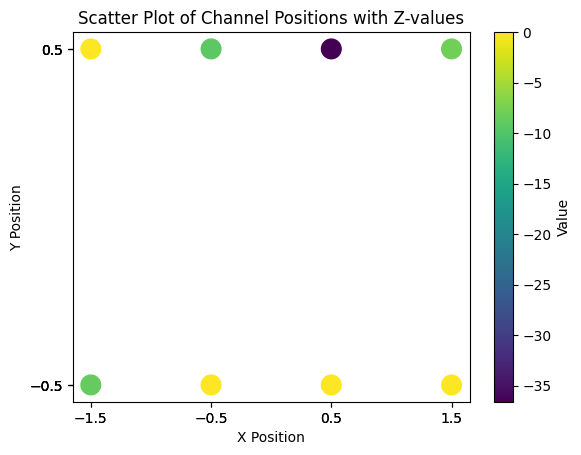

[0, 0, -8.718505859375, 0, 0, 0, -7.950927734375, 0]


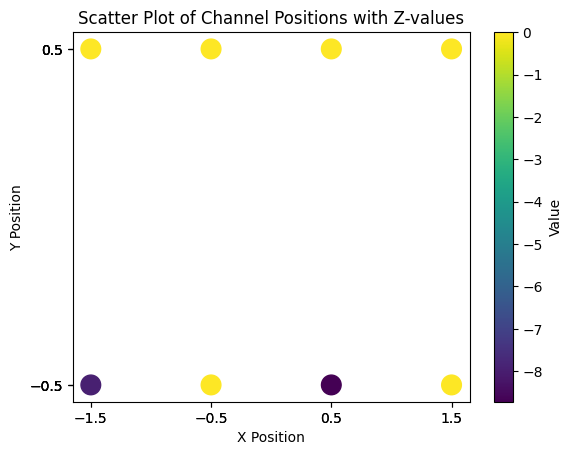

[0, -9.280517578125, 0, 0, 0, -12.4609375, 0, -35.473876953125]


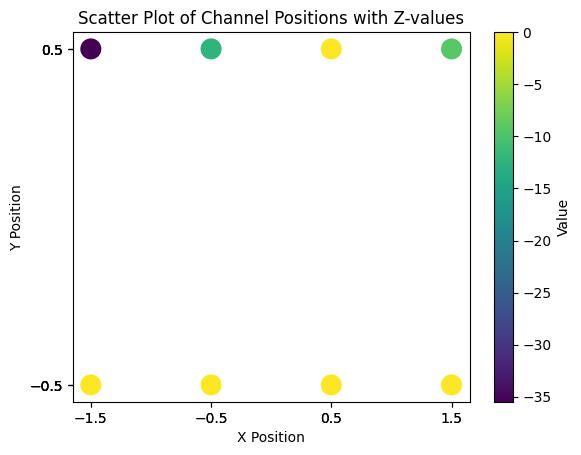

[0, 0, -7.849609375, 0, 0, -26.843017578125, 0, 0]


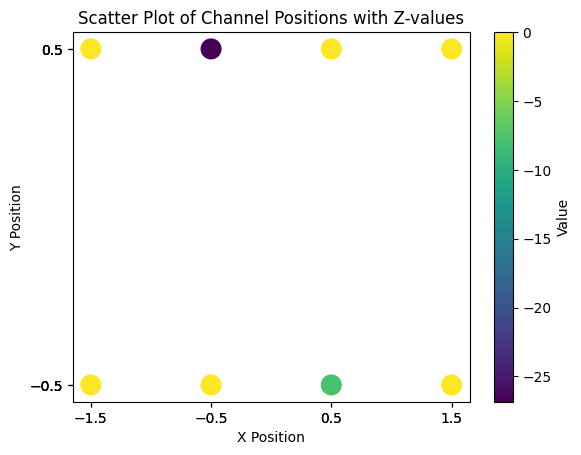

[0, 0, -8.267822265625, -61.3369140625, -30.56298828125, -21.126953125, -15.422607421875, -16.850341796875]


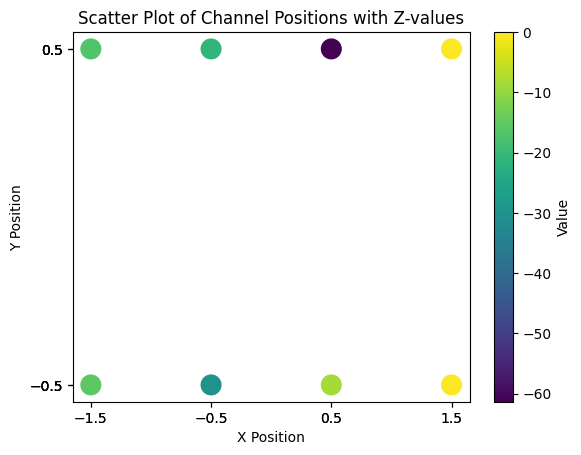

[0, -7.053955078125, 0, -11.612548828125, 0, -20.77490234375, -32.171630859375, -8.493896484375]


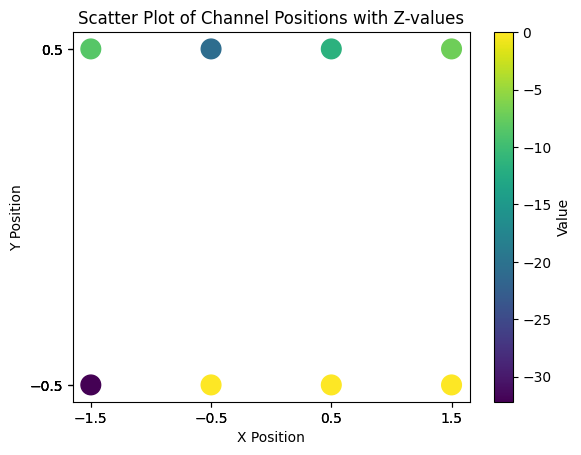

[0, -8.749755859375, -9.88916015625, -13.5888671875, -7.754638671875, -12.8974609375, 0, 0]


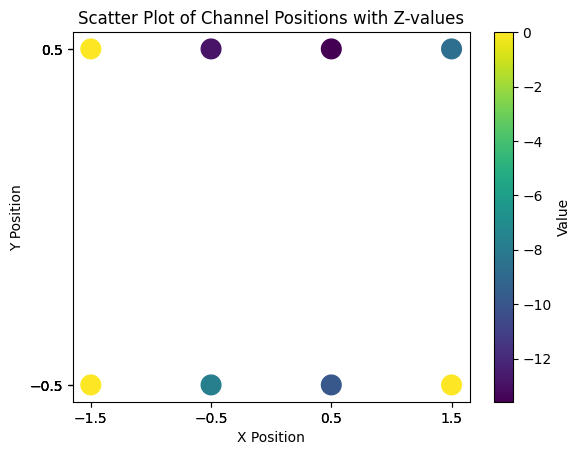

[-7.190673828125, 0, -7.885986328125, -15.602783203125, -29.285400390625, 0, -8.35986328125, -37.463623046875]


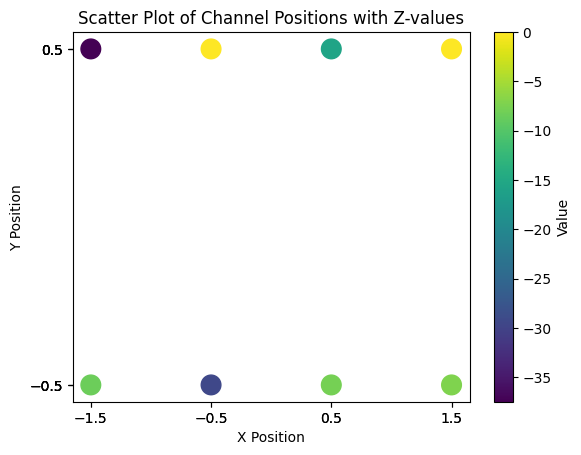

[0, 0, 0, -27.54052734375, 0, -14.237548828125, 0, -13.089599609375]


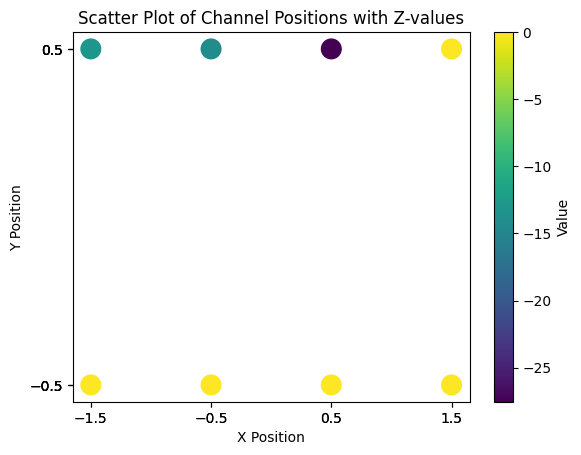

[0, 0, 0, -14.412841796875, -7.639892578125, -12.043701171875, 0, -7.099609375]


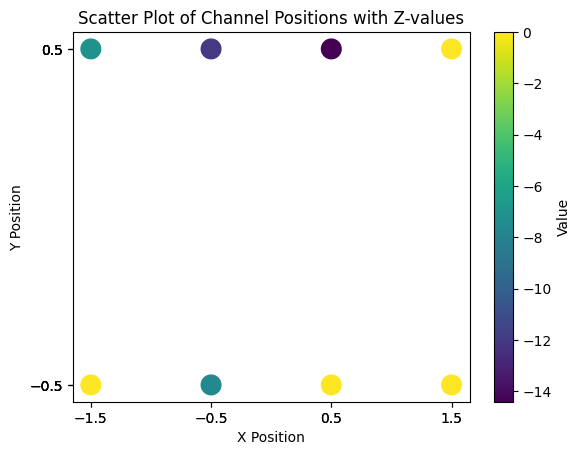

[0, -7.15869140625, -15.2841796875, -8.015869140625, -20.3818359375, -23.48291015625, -38.39013671875, 0]


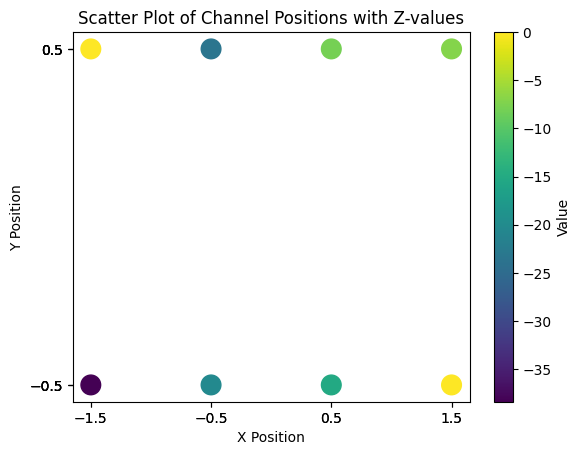

[0, -7.76953125, -8.046875, 0, -7.329833984375, -27.7109375, -15.5986328125, -32.392578125]


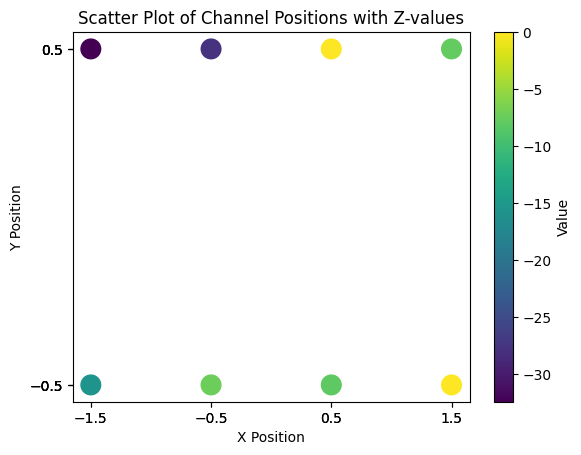

[0, 0, -8.416259765625, -22.584716796875, -14.3203125, 0, -7.858154296875, 0]


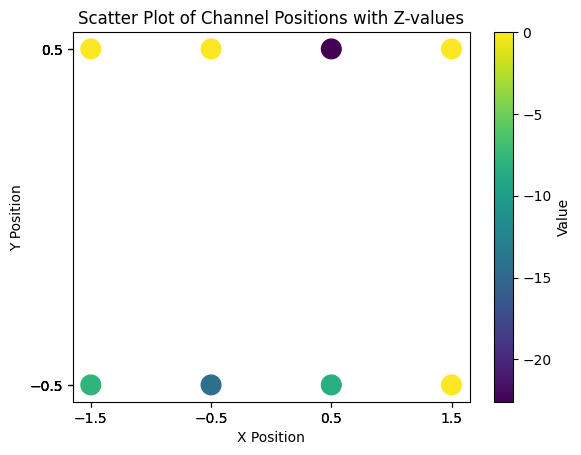

[0, -7.15771484375, 0, 0, 0, -14.385009765625, 0, 0]


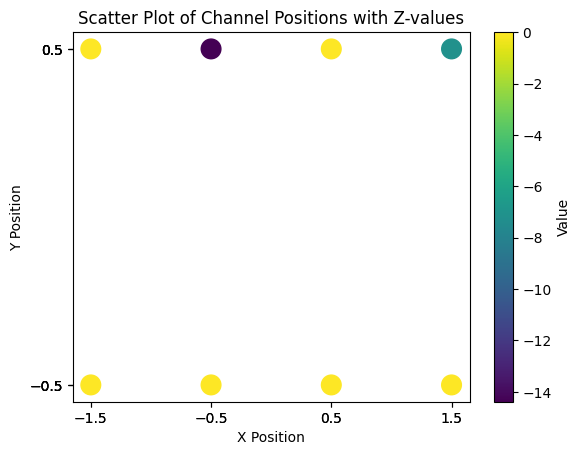

[0, 0, 0, -7.37841796875, 0, 0, -49.605224609375, -81.16796875]


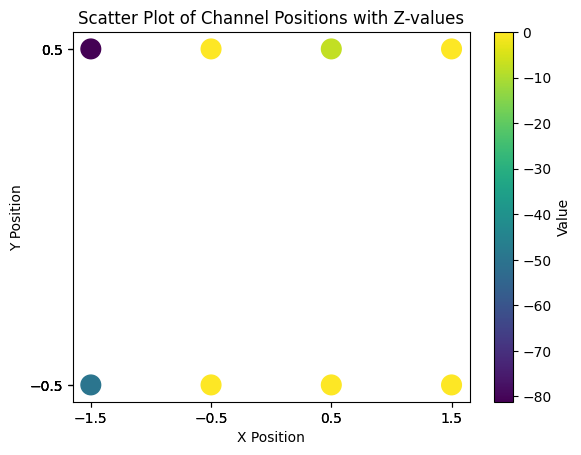

[0, 0, 0, -9.26513671875, -7.443359375, -11.80322265625, 0, 0]


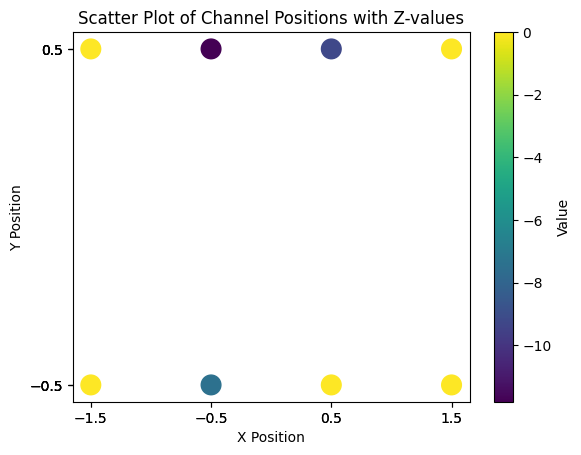

[0, 0, 0, -7.213623046875, 0, 0, 0, 0]


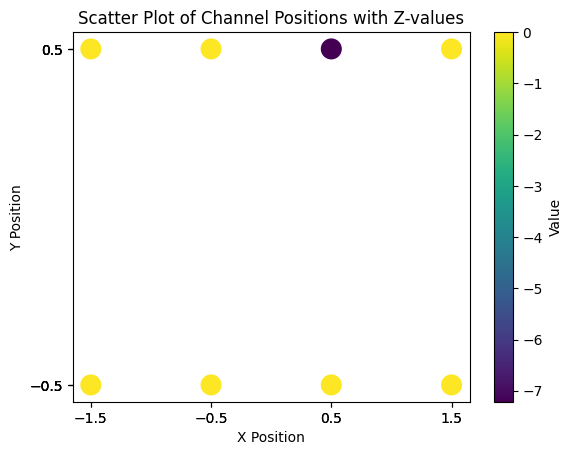

[0, 0, 0, -24.166015625, -16.79833984375, -7.986572265625, -14.84619140625, 0]


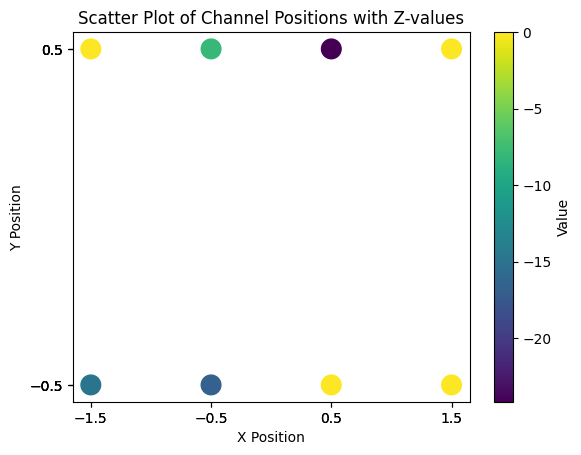

[0, 0, 0, -26.275634765625, 0, -10.8583984375, -15.219970703125, -24.4765625]


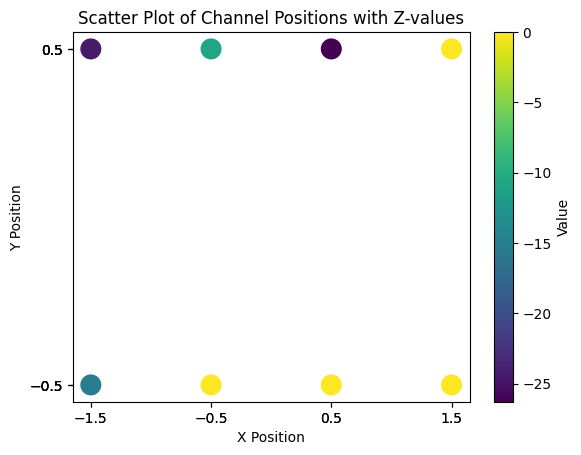

[0, 0, -7.008056640625, -32.744140625, 0, -34.57958984375, 0, 0]


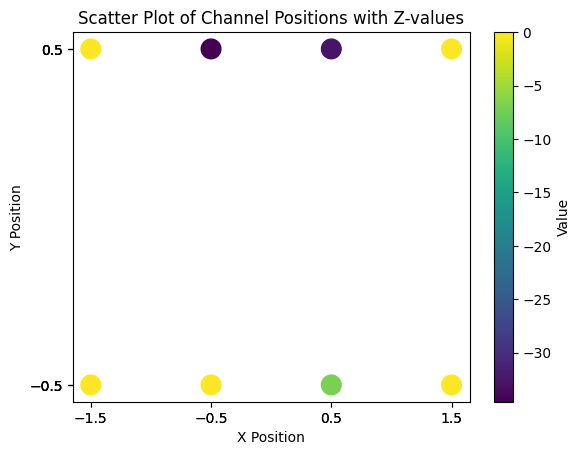

[0, 0, 0, -25.573974609375, 0, -13.517822265625, -7.617919921875, 0]


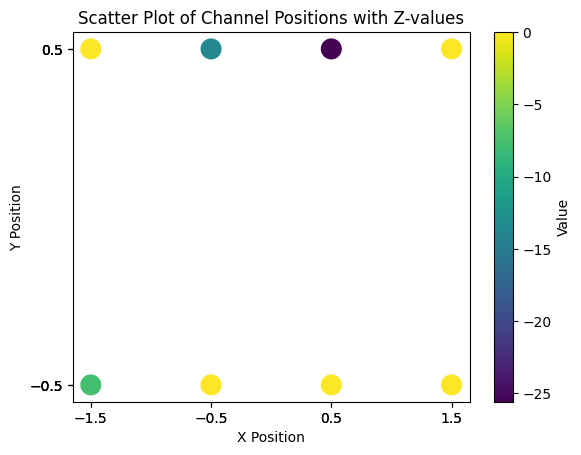

[0, 0, -24.520263671875, 0, -43.833251953125, 0, -7.038818359375, 0]


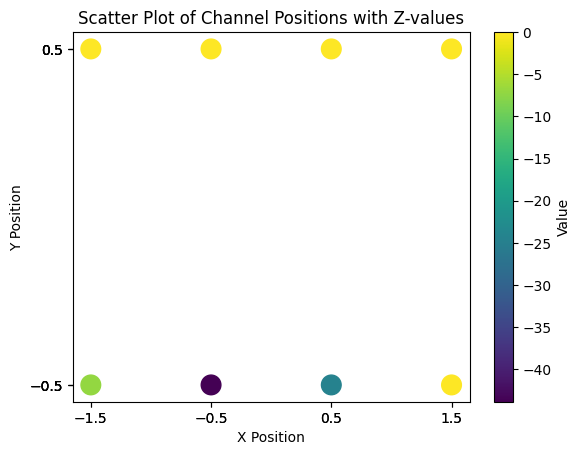

[0, 0, 0, -7.285400390625, -8.225830078125, -8.8798828125, -17.208740234375, -7.628662109375]


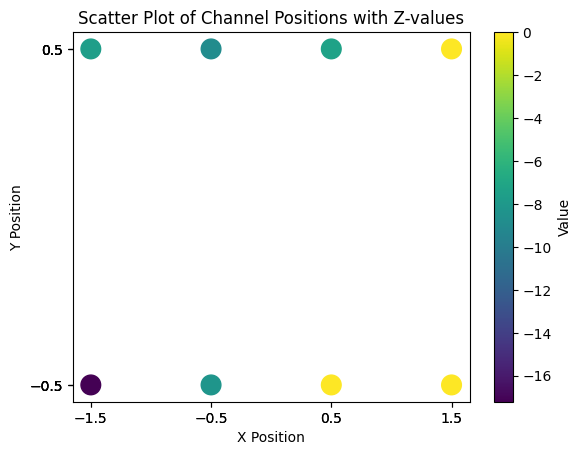

[0, 0, -9.2685546875, -9.531982421875, 0, -19.441162109375, 0, 0]


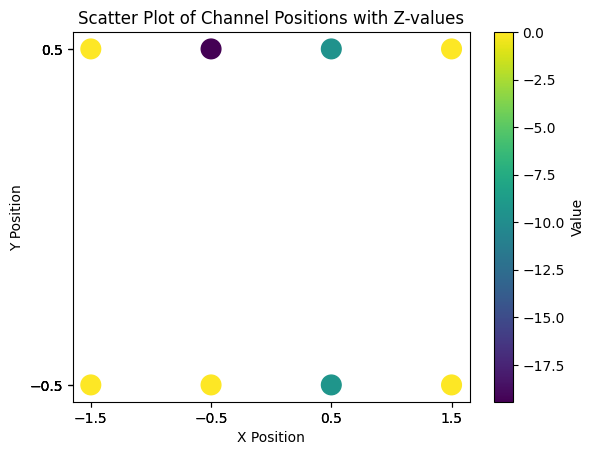

[0, 0, 0, -62.191650390625, 0, -26.01025390625, 0, -22.0419921875]


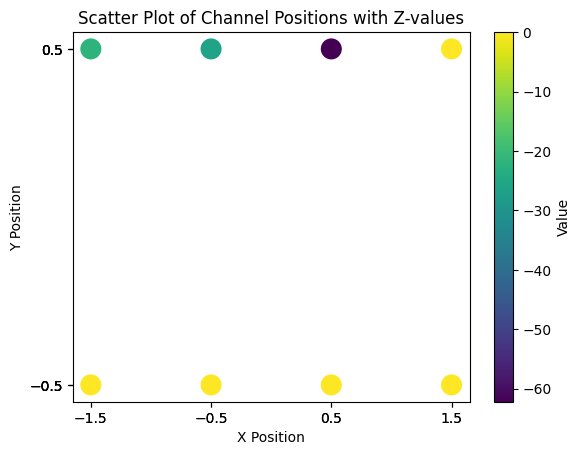

[-7.432373046875, 0, -8.445556640625, -27.51806640625, -16.33203125, -13.564453125, 0, 0]


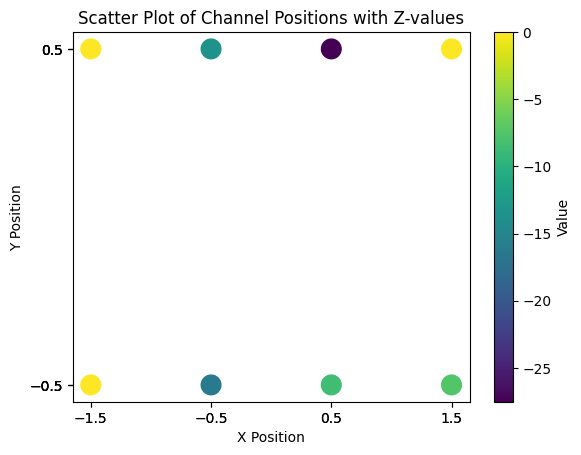

[0, 0, -12.90673828125, -33.127197265625, 0, -31.21337890625, 0, 0]


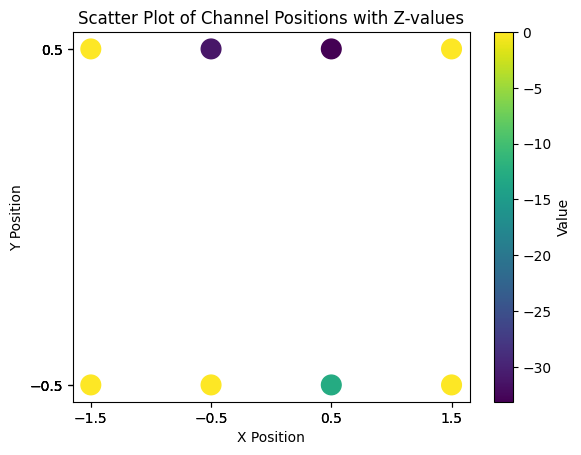

[0, 0, 0, -22.527099609375, -14.395751953125, -24.83837890625, -16.0986328125, -9.432373046875]


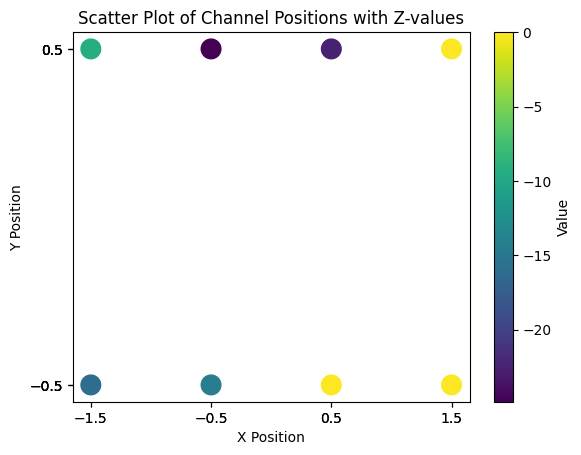

[0, 0, 0, -29.148681640625, -27.984619140625, -8.261962890625, 0, -15.64111328125]


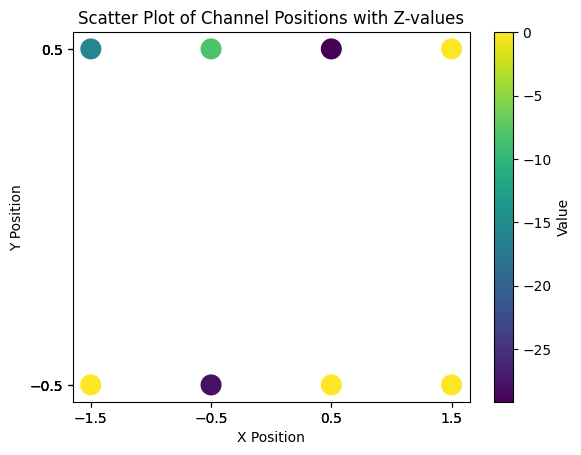

[0, 0, -27.40625, -15.28564453125, 0, -11.72216796875, 0, 0]


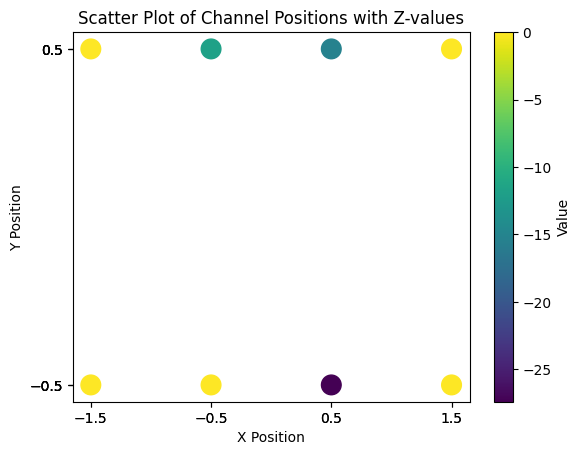

[0, 0, 0, 0, -23.298583984375, -14.334228515625, 0, 0]


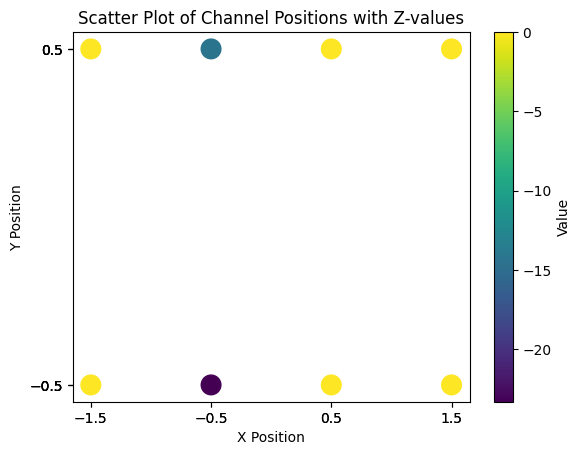

[0, 0, 0, -12.2607421875, 0, -11.48681640625, 0, -20.69970703125]


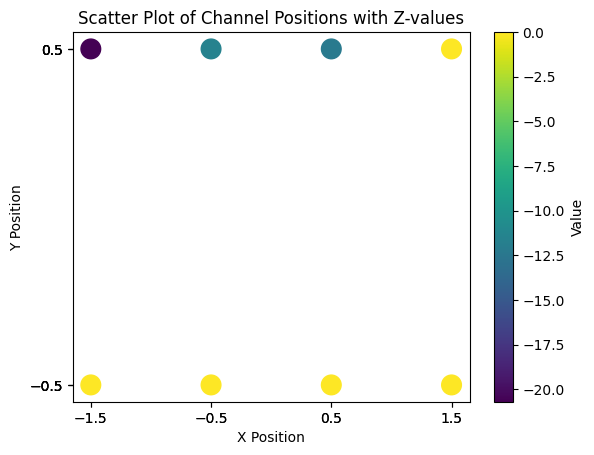

[0, 0, -27.642578125, 0, -13.062744140625, 0, 0, 0]


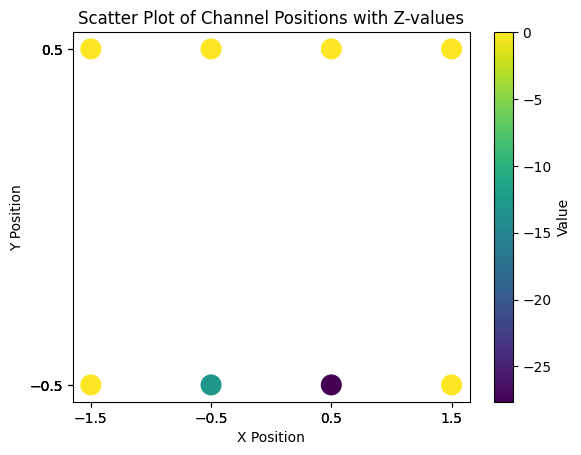

[0, 0, 0, -11.68115234375, 0, -10.37890625, -14.29833984375, 0]


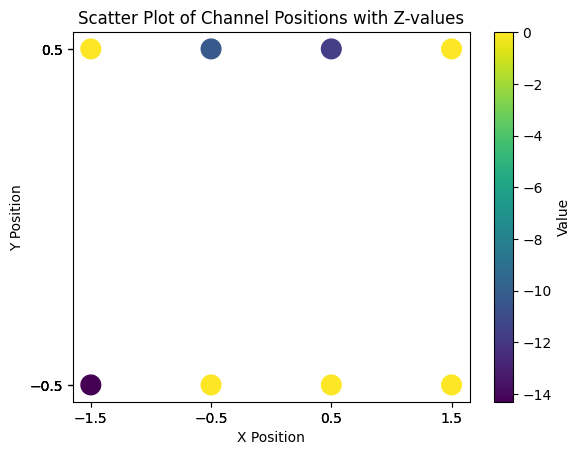

[0, 0, 0, -41.15185546875, -34.941162109375, -7.059814453125, 0, -8.68017578125]


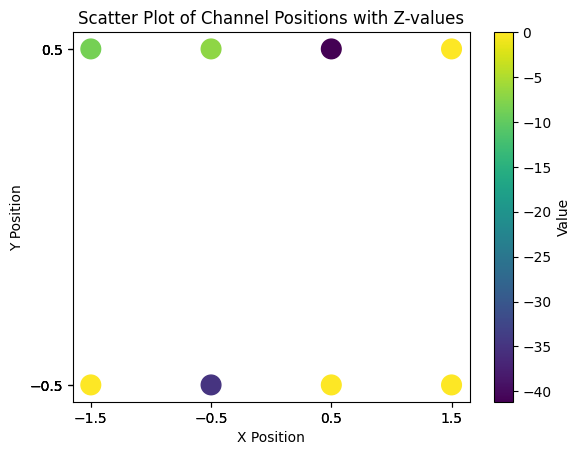

[0, 0, 0, -12.1416015625, -18.078369140625, -17.563232421875, 0, 0]


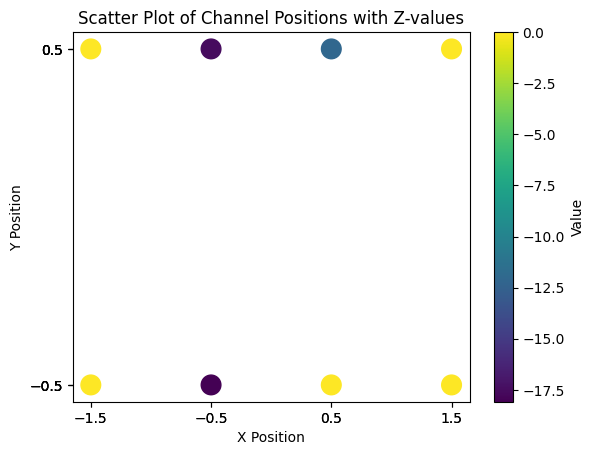

[0, 0, 0, 0, -14.208984375, -39.913818359375, -7.516357421875, -7.3017578125]


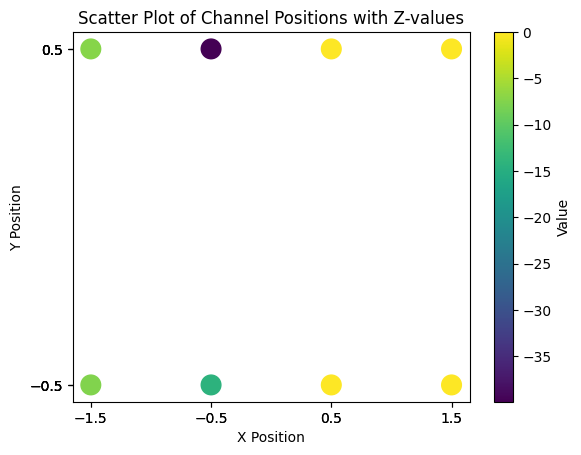

[0, 0, -7.91259765625, 0, 0, -22.11328125, -16.668212890625, 0]


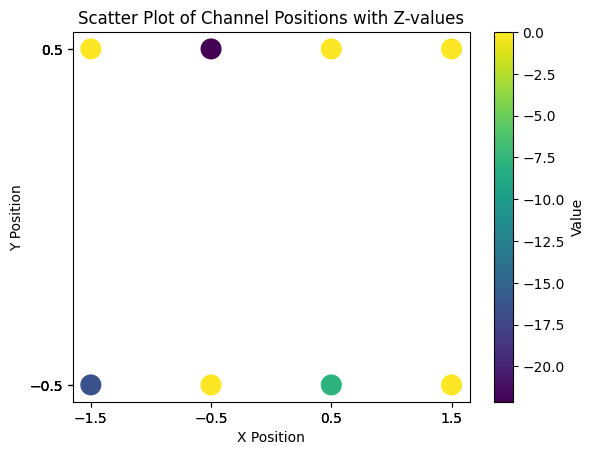

[0, 0, -17.14990234375, -13.3896484375, 0, -7.715087890625, 0, 0]


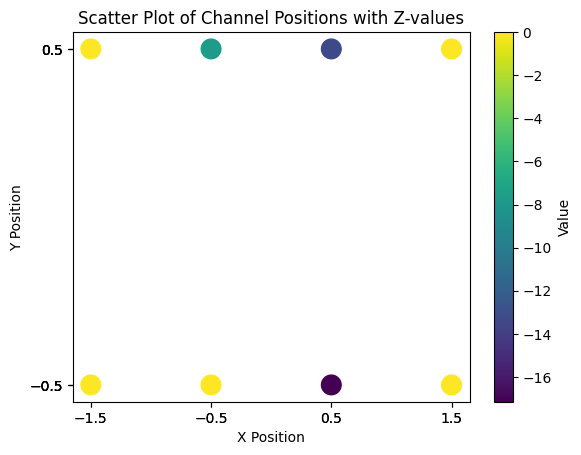

[0, 0, 0, -35.24169921875, -14.926513671875, 0, -9.648681640625, 0]


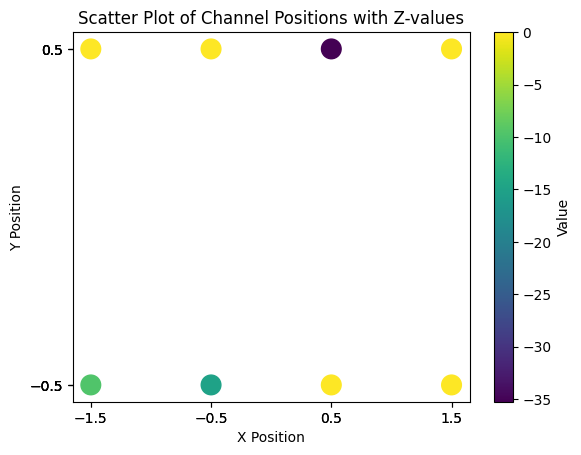

[0, -10.073486328125, -26.962646484375, -25.23583984375, 0, -19.67724609375, 0, -14.325439453125]


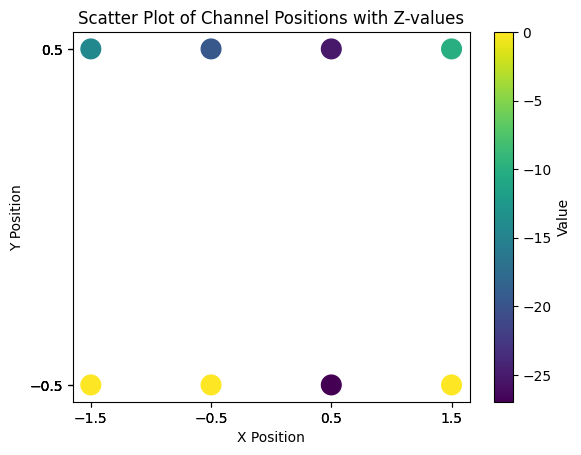

[0, -8.955810546875, 0, -12.885009765625, 0, -19.0947265625, 0, -15.014892578125]


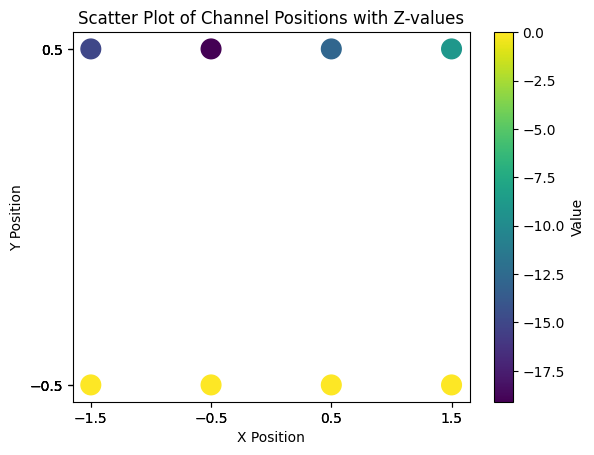

[0, -8.878173828125, 0, -12.514404296875, 0, -22.79541015625, 0, -14.460693359375]


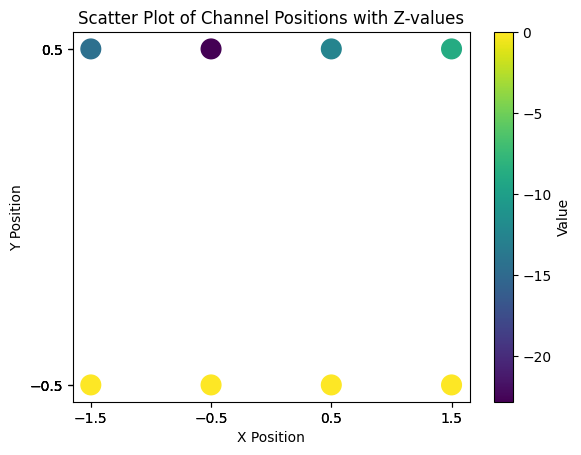

[0, -8.364501953125, -14.164794921875, -12.647216796875, 0, 0, 0, 0]


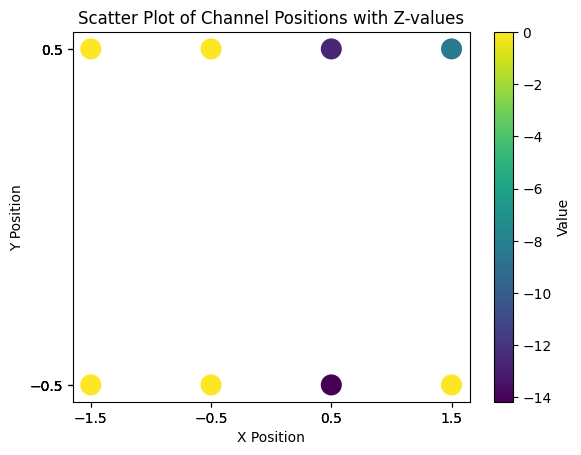

[0, 0, -15.335205078125, -15.61767578125, 0, -24.279296875, 0, 0]


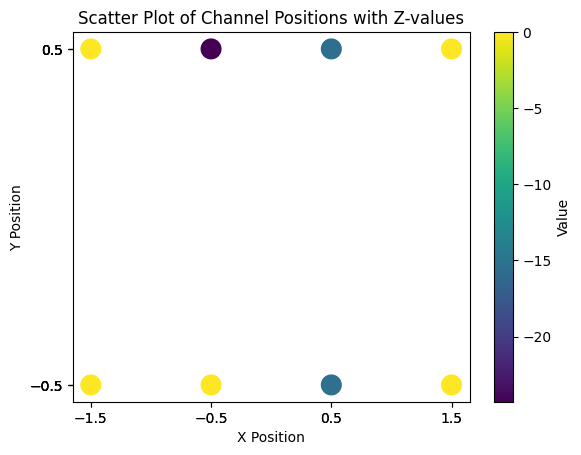

[0, 0, -85.366943359375, -26.336669921875, 0, 0, 0, 0]


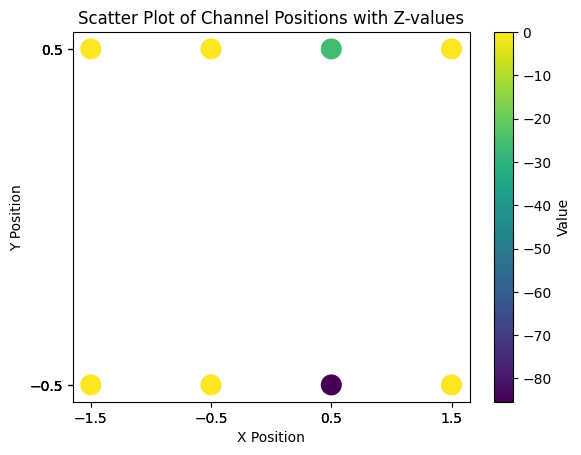

[0, 0, 0, 0, 0, -37.257080078125, -14.6259765625, 0]


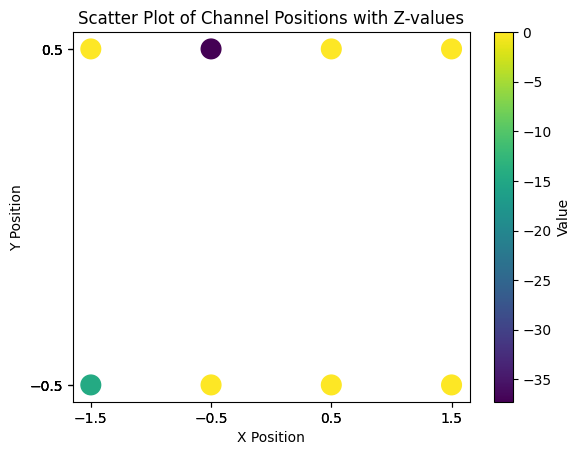

[0, 0, -39.494873046875, 0, 0, -16.148681640625, 0, 0]


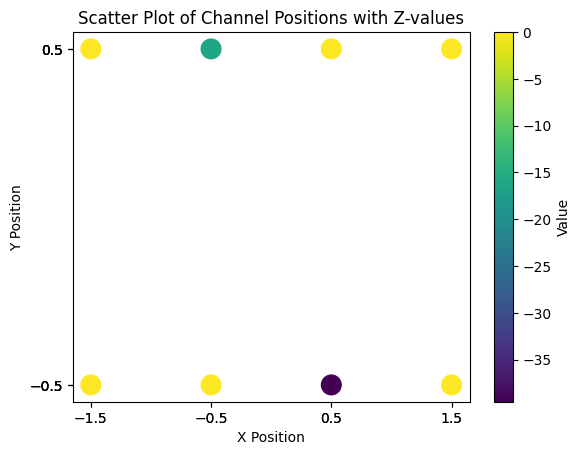

[0, 0, 0, -53.23095703125, -15.8759765625, -14.385986328125, -17.48974609375, -21.881103515625]


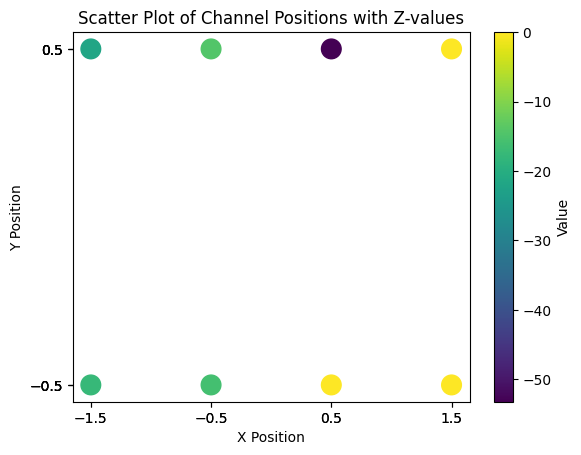

[0, 0, -11.58154296875, -28.845458984375, 0, -10.217041015625, 0, 0]


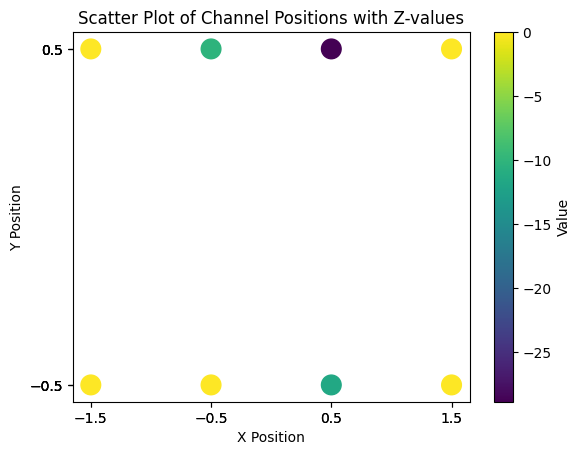

[0, 0, 0, -29.89599609375, -15.53515625, -11.79833984375, 0, -42.3173828125]


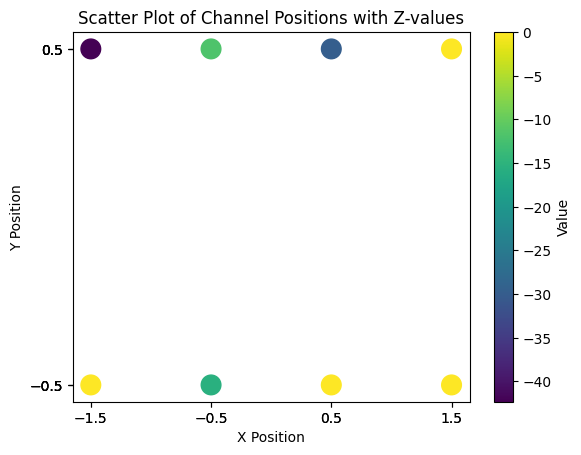

[0, 0, 0, -26.5615234375, -27.478515625, 0, 0, 0]


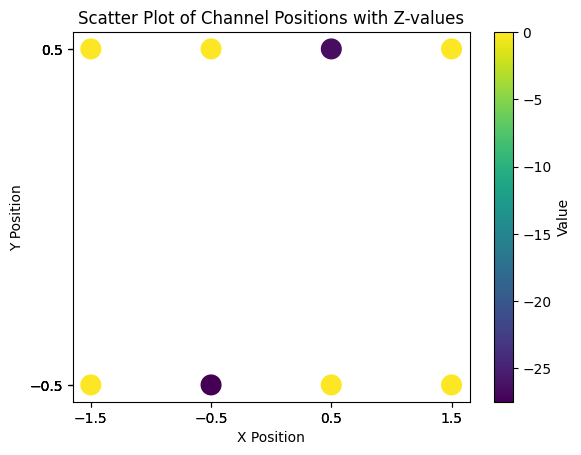

[0, -7.36572265625, 0, -19.0146484375, 0, -9.084716796875, 0, 0]


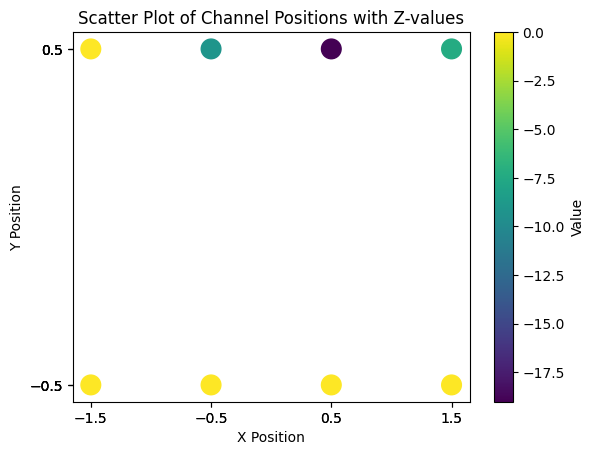

[0, -8.314453125, -13.1826171875, 0, 0, -14.6748046875, 0, 0]


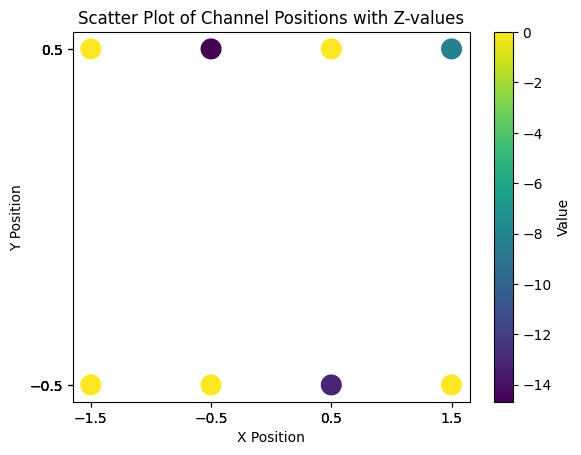

[0, 0, 0, 0, 0, 0, -8.304443359375, 0]


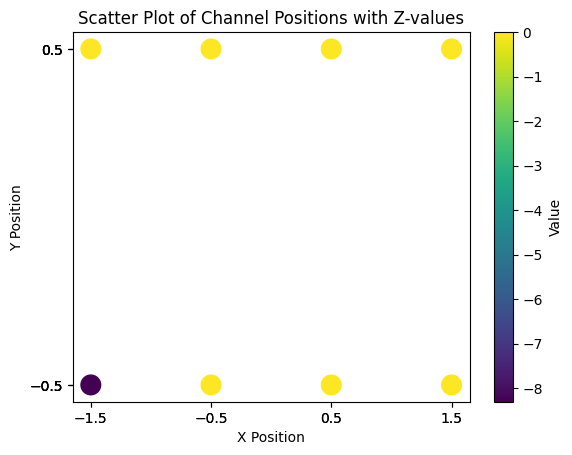

[0, 0, 0, -41.127197265625, -13.802490234375, -8.249267578125, 0, 0]


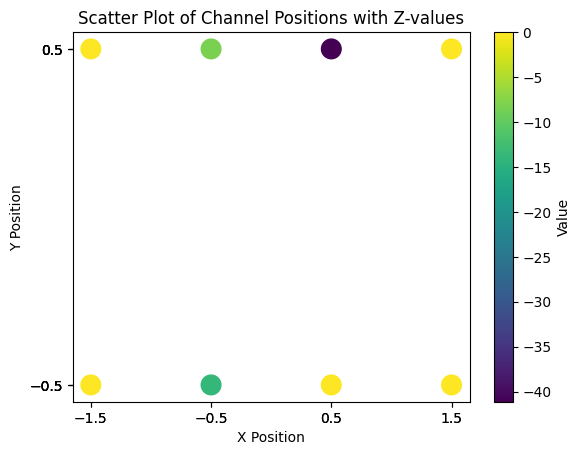

[0, -8.6884765625, -7.012939453125, -8.030029296875, -25.55029296875, 0, 0, -15.183837890625]


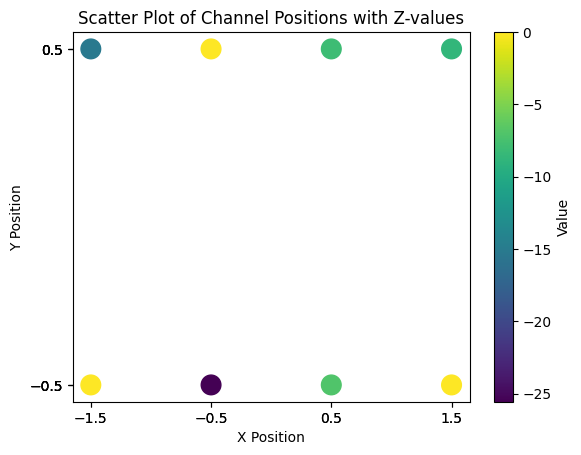

[0, 0, 0, -12.458740234375, 0, -12.64013671875, 0, -14.393310546875]


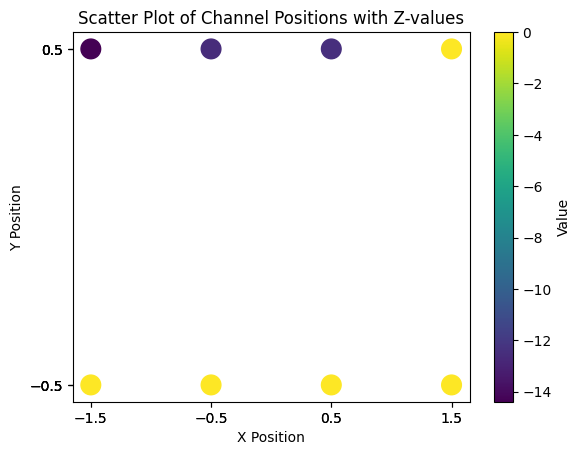

[0, -7.45361328125, -8.2939453125, 0, 0, 0, 0, -12.888671875]


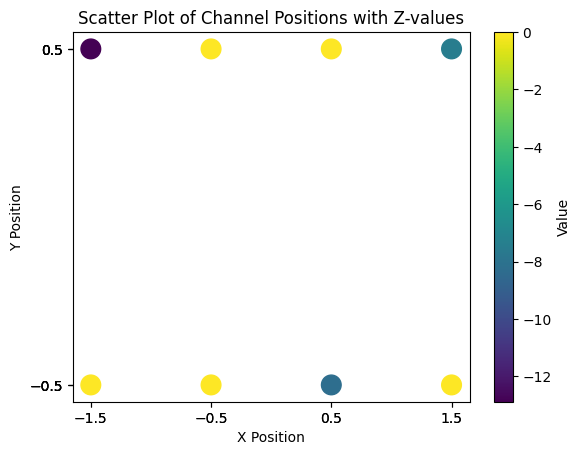

[0, 0, -8.349609375, -16.53955078125, -7.1103515625, -13.248779296875, -7.27978515625, 0]


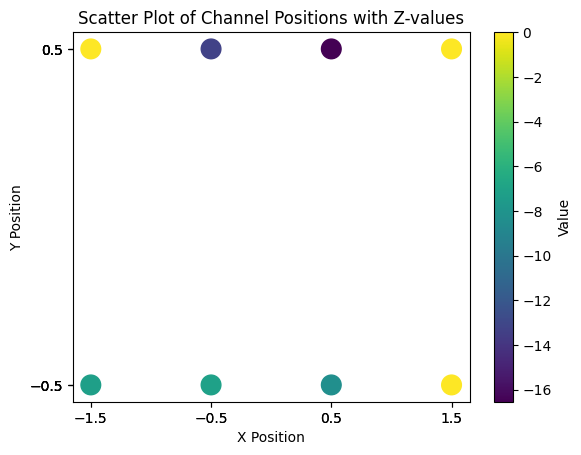

[0, 0, 0, 0, -7.4658203125, -41.9560546875, -23.7119140625, -17.401123046875]


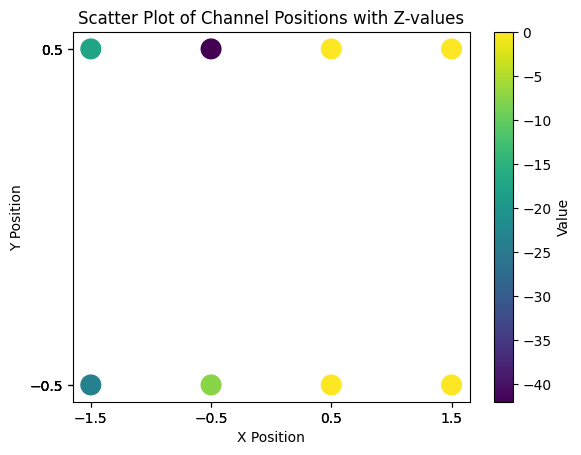

[0, -7.448486328125, -7.42529296875, 0, 0, -29.1962890625, -19.04296875, 0]


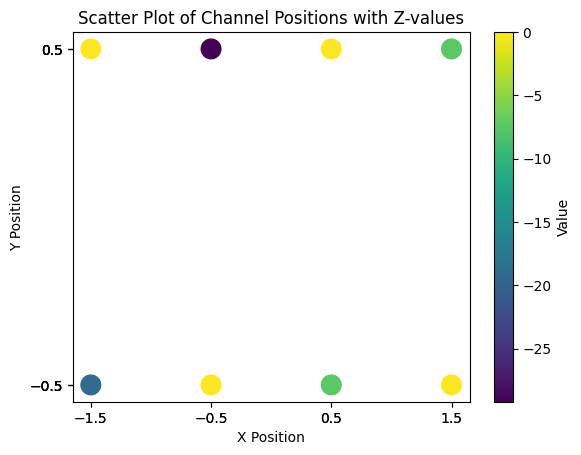

[-7.909912109375, 0, 0, -15.813720703125, 0, -23.76123046875, -7.214111328125, 0]


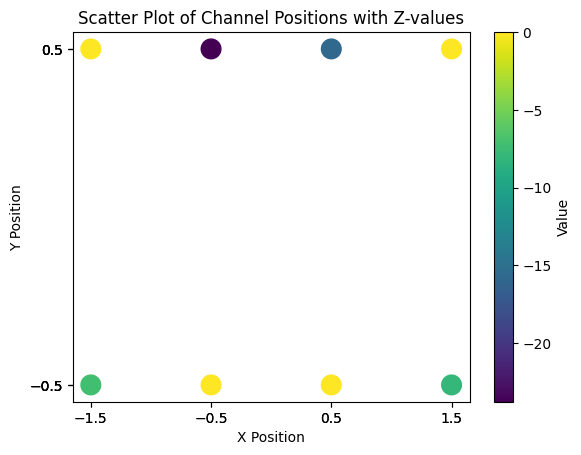

[0, 0, -8.126953125, -24.09326171875, 0, 0, 0, 0]


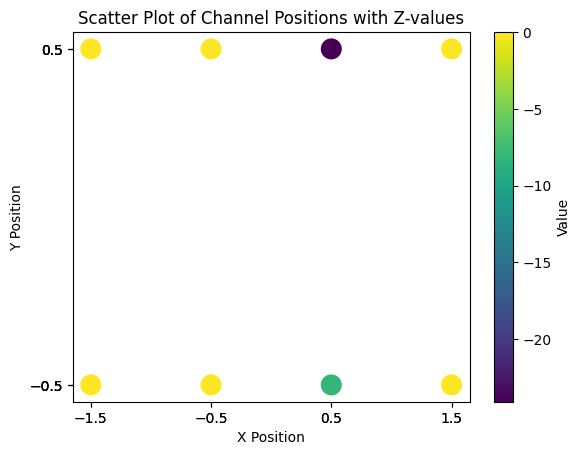

[0, 0, 0, -13.171142578125, 0, -26.423828125, -7.302734375, 0]


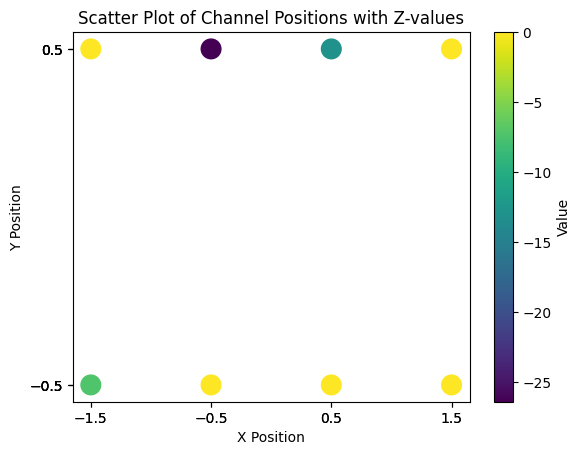

[0, 0, 0, -25.36279296875, -7.37060546875, -11.06591796875, -17.444091796875, -17.518798828125]


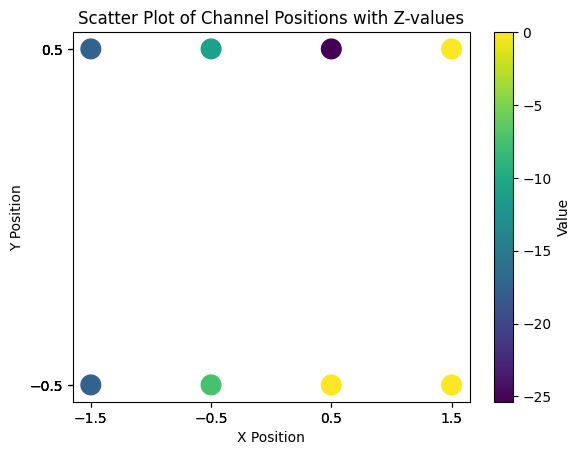

[0, -14.33447265625, 0, -16.78857421875, -7.81689453125, -14.199951171875, 0, 0]


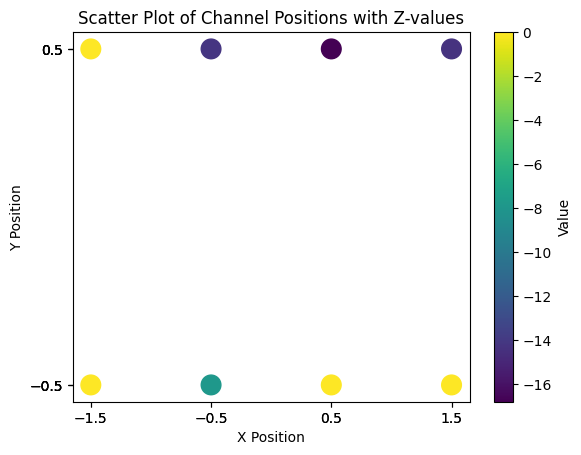

[0, 0, 0, -22.818115234375, -7.802001953125, -7.9287109375, 0, 0]


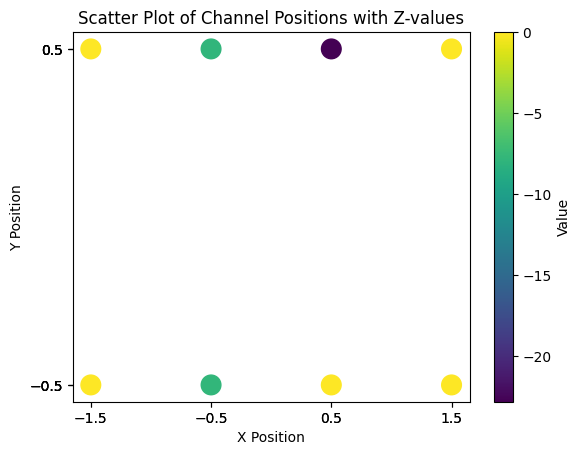

[0, 0, 0, 0, -8.7900390625, -35.216796875, 0, -57.72412109375]


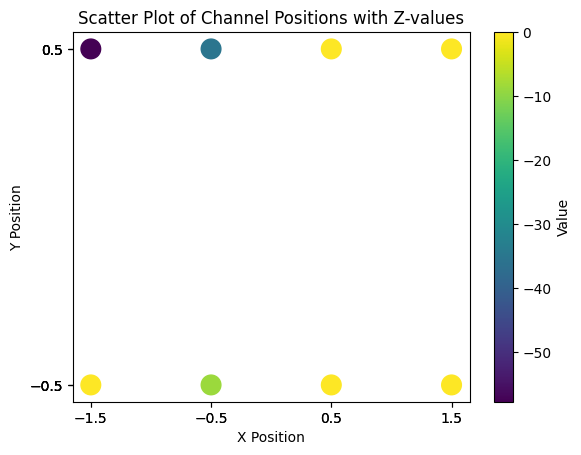

[0, 0, 0, -22.2275390625, 0, -19.842529296875, 0, -7.033203125]


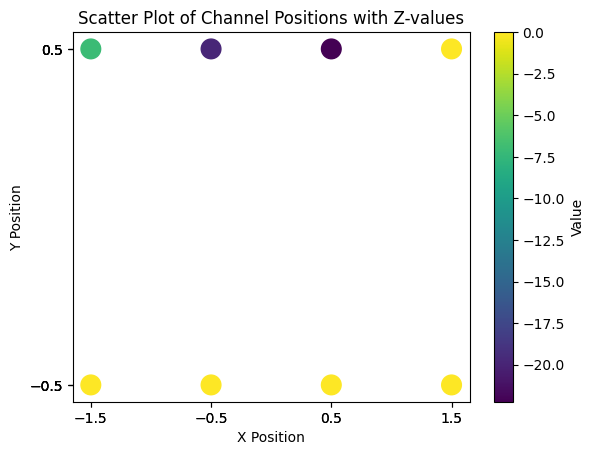

[0, 0, -7.012451171875, 0, -7.762939453125, -17.47998046875, 0, 0]


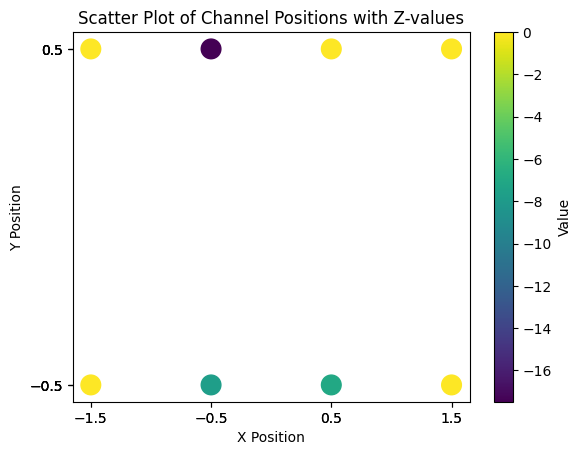

[0, -7.195556640625, 0, -15.50732421875, 0, -25.98095703125, 0, 0]


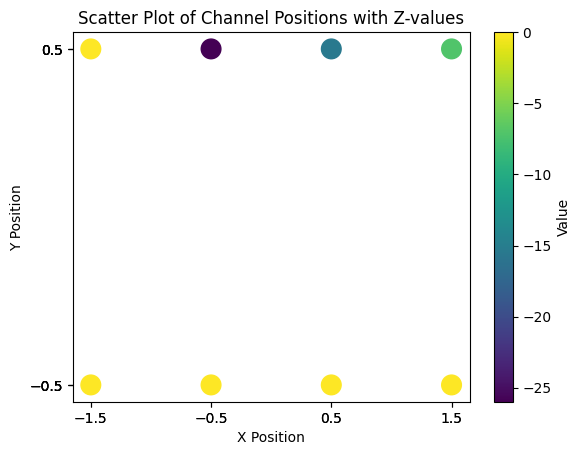

[0, 0, -7.15283203125, -22.71826171875, 0, 0, -8.1826171875, -24.55029296875]


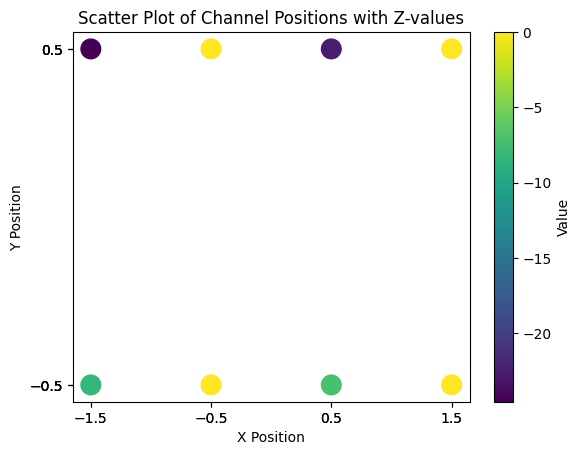

[0, -7.322509765625, 0, 0, 0, -25.63671875, -16.479248046875, -9.40185546875]


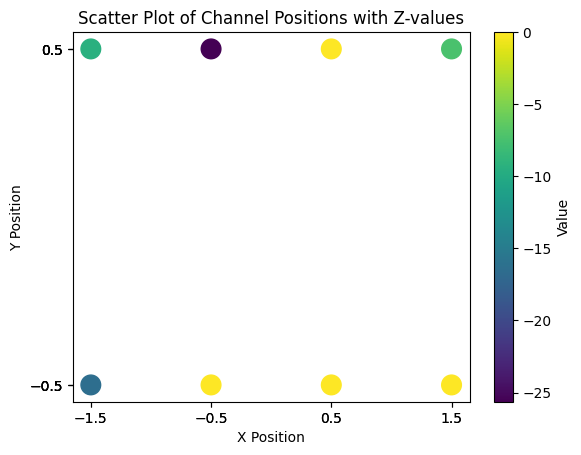

[0, 0, 0, 0, 0, -7.697265625, -14.218994140625, 0]


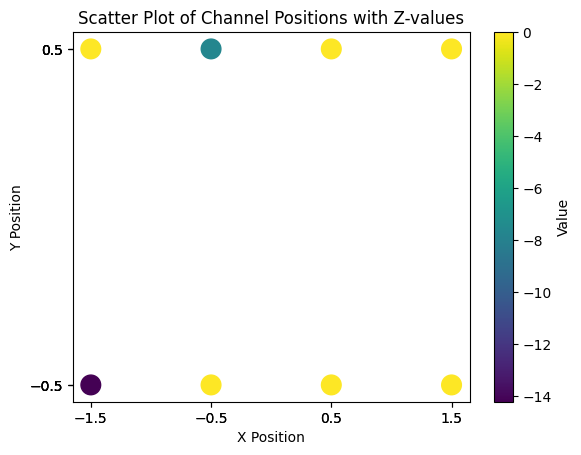

[0, 0, 0, 0, 0, 0, 0, -7.833251953125]


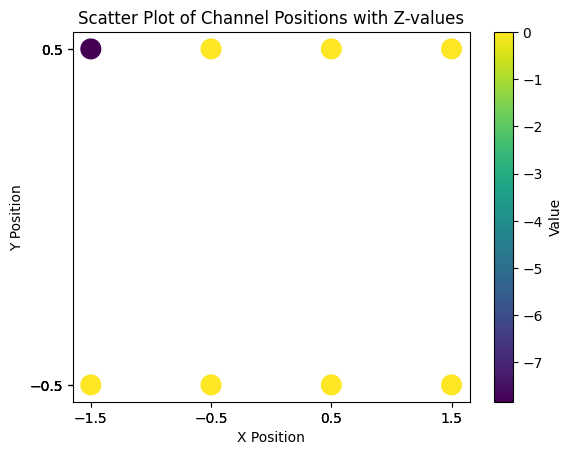

[0, 0, 0, 0, 0, -35.943359375, -14.447509765625, 0]


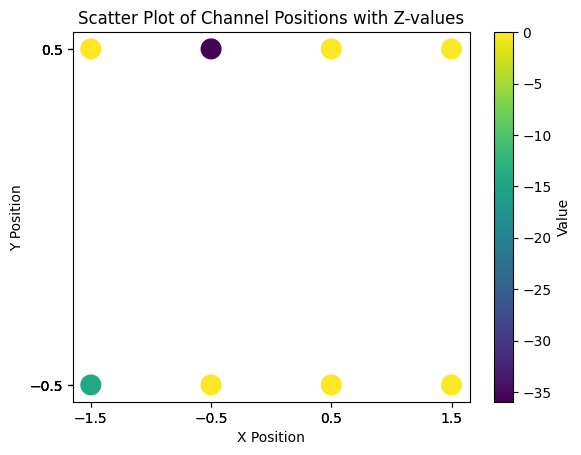

[0, 0, -15.63720703125, -35.6220703125, 0, -23.99853515625, 0, 0]


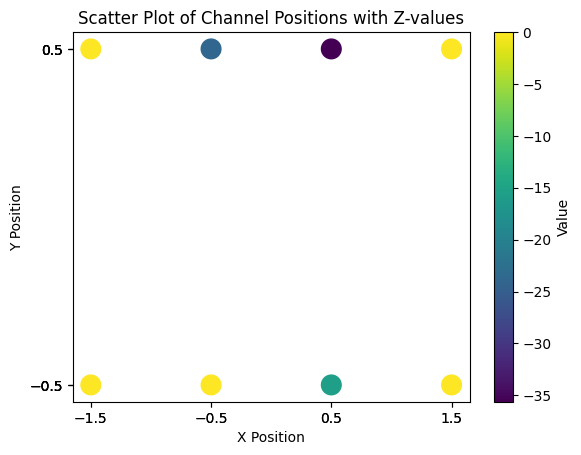

[0, 0, 0, -39.037353515625, 0, 0, 0, 0]


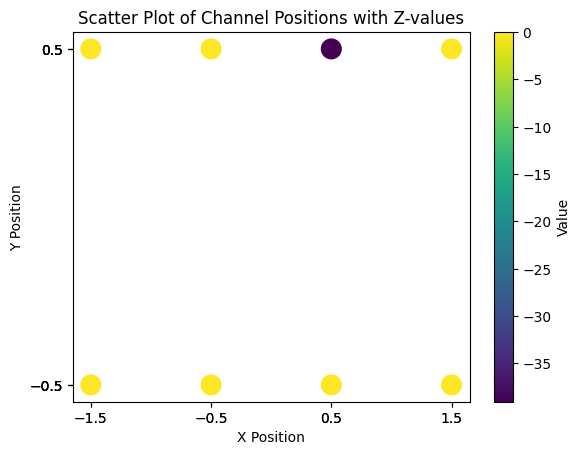

[0, 0, -12.953369140625, -13.86181640625, 0, -22.799072265625, -7.34716796875, -7.954833984375]


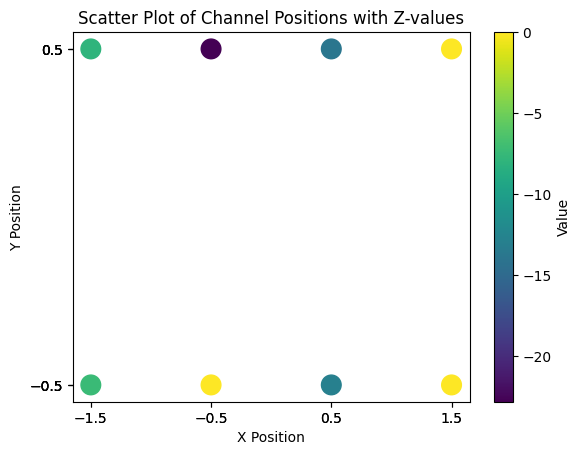

[-7.81005859375, 0, -7.385986328125, 0, 0, 0, 0, -9.519287109375]


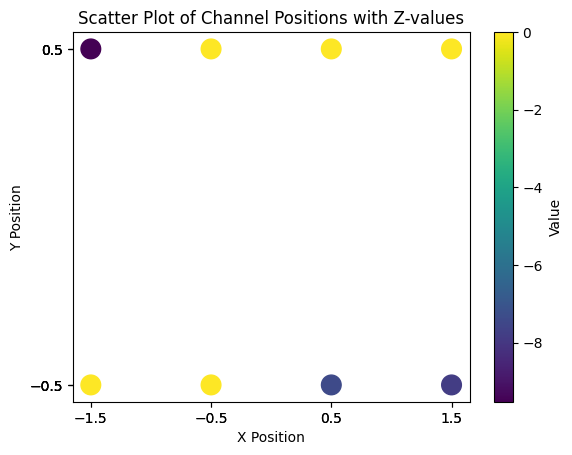

[0, 0, -25.342041015625, 0, 0, 0, 0, 0]


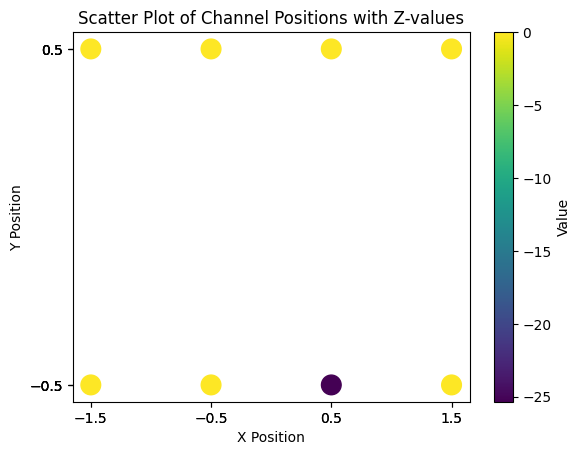

[0, 0, 0, -24.19921875, 0, 0, 0, 0]


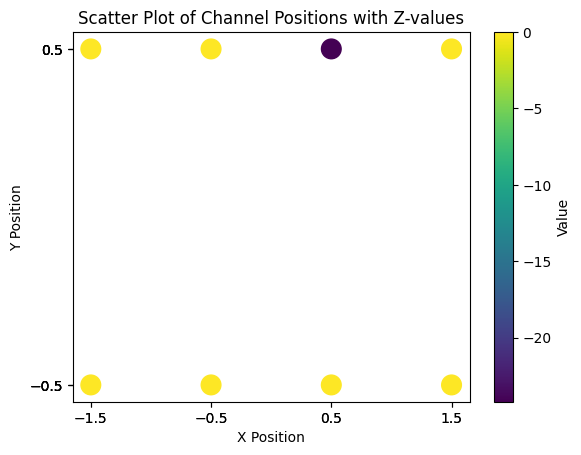

[0, 0, -8.21728515625, 0, -7.7080078125, 0, -24.803955078125, 0]


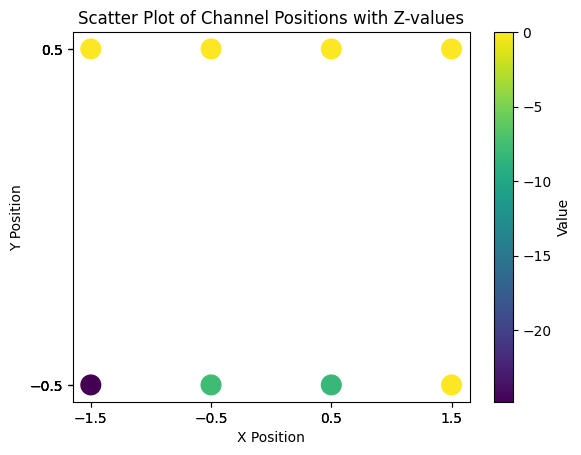

[0, 0, -7.34912109375, 0, 0, 0, 0, -35.537841796875]


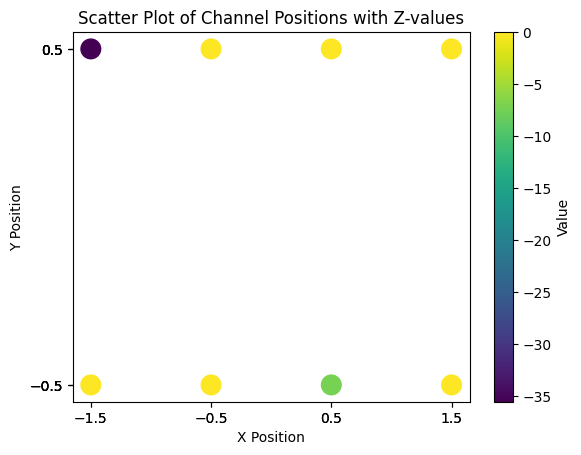

[0, 0, -7.374267578125, 0, 0, -10.01513671875, 0, -34.791748046875]


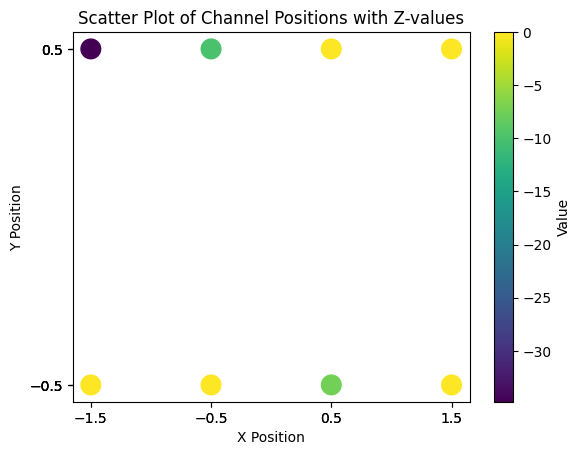

[0, 0, 0, -21.81787109375, 0, -11.513916015625, -10.27587890625, 0]


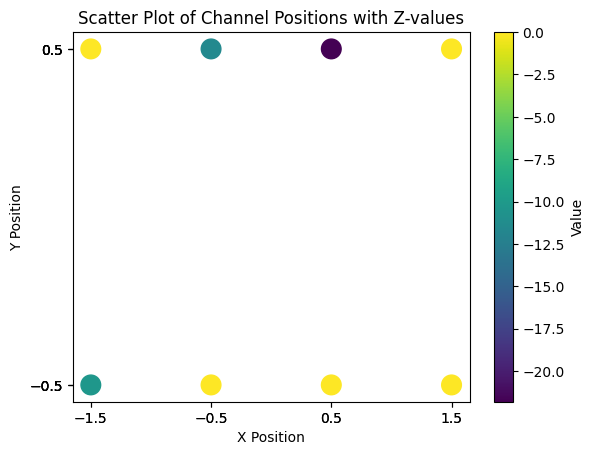

[0, 0, 0, -7.522216796875, -21.598876953125, -7.22021484375, 0, 0]


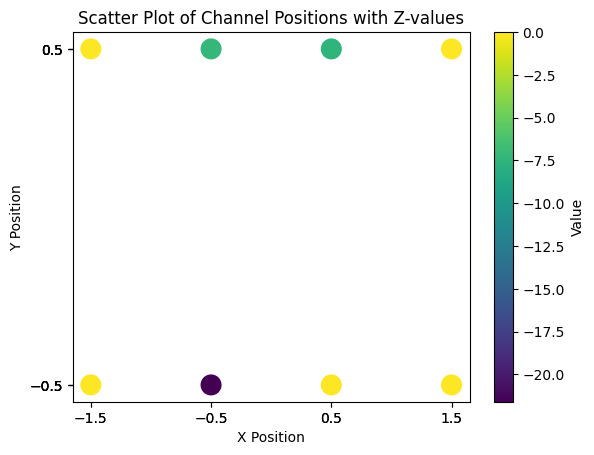

[0, 0, -31.12109375, -12.873046875, 0, -10.154541015625, -48.74365234375, 0]


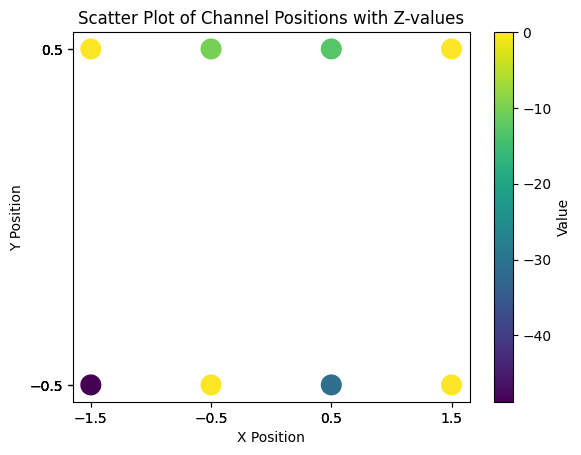

[-7.5283203125, -7.3310546875, -7.2265625, -12.571044921875, 0, -13.173583984375, 0, 0]


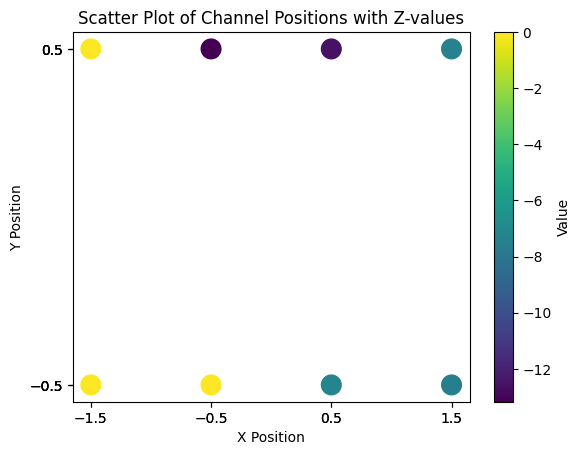

[0, 0, 0, -16.463134765625, 0, -15.20751953125, -8.01416015625, 0]


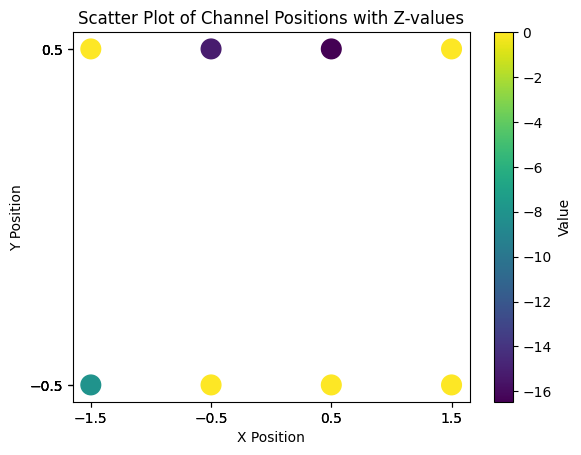

[0, 0, 0, 0, -23.08544921875, -12.08349609375, 0, 0]


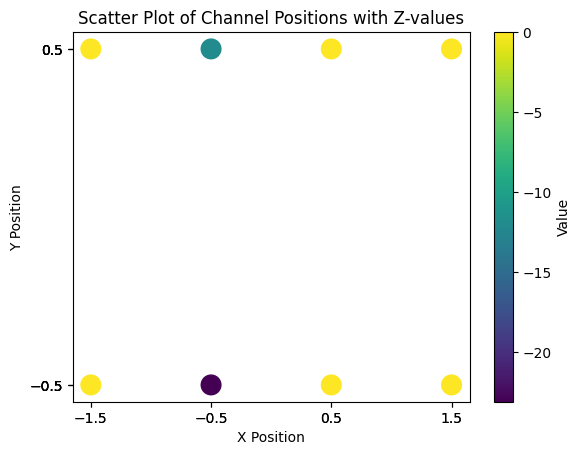

[0, 0, -12.741455078125, -37.251708984375, -14.32275390625, 0, -13.270263671875, 0]


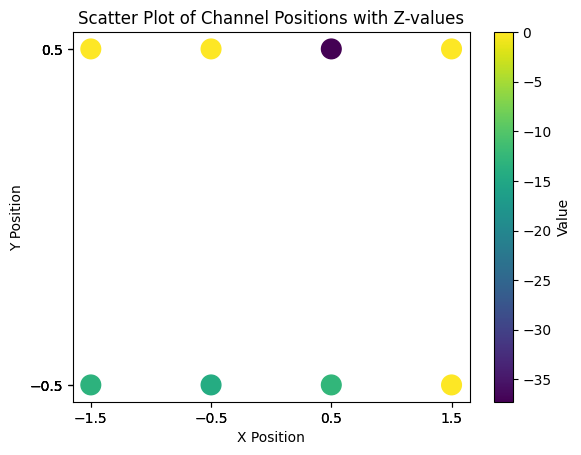

[0, 0, 0, -11.1865234375, -17.520263671875, -29.4033203125, 0, 0]


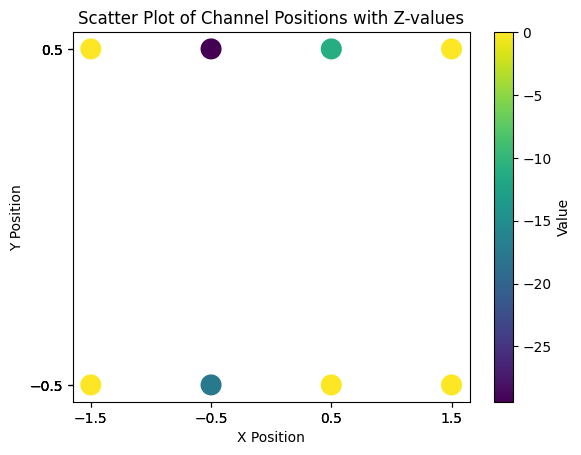

[0, 0, -11.99658203125, -14.48193359375, 0, -11.461181640625, 0, 0]


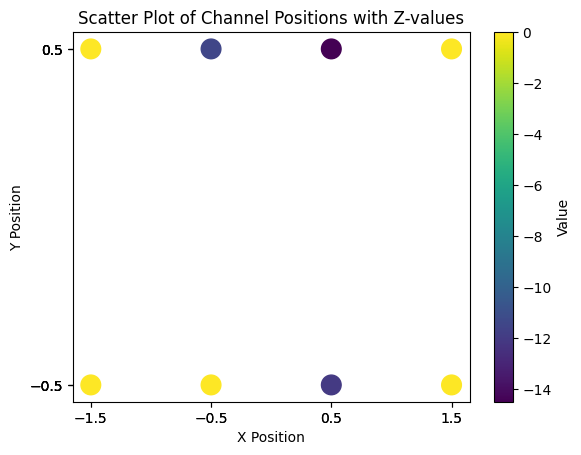

[0, 0, -12.5966796875, -14.47607421875, 0, 0, 0, -13.066162109375]


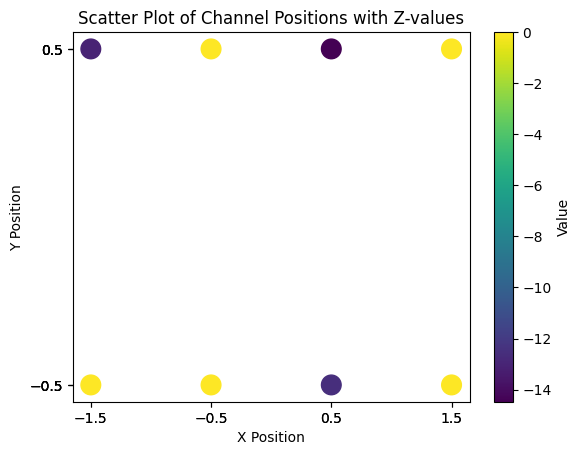

[0, 0, 0, -25.74462890625, 0, -10.33642578125, 0, -13.561279296875]


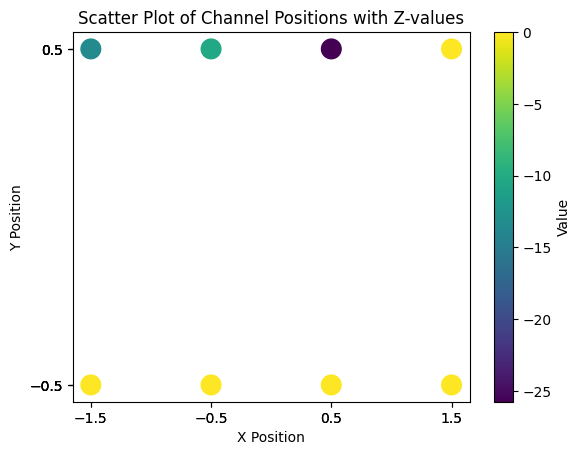

[0, 0, 0, -37.920654296875, 0, -20.748046875, 0, -12.46484375]


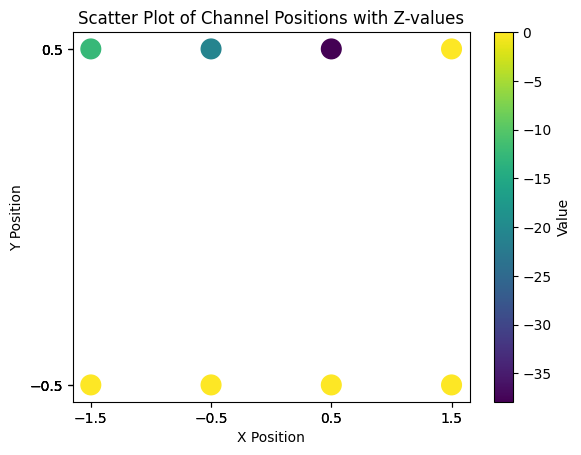

[0, 0, -29.49609375, -13.160888671875, 0, 0, 0, 0]


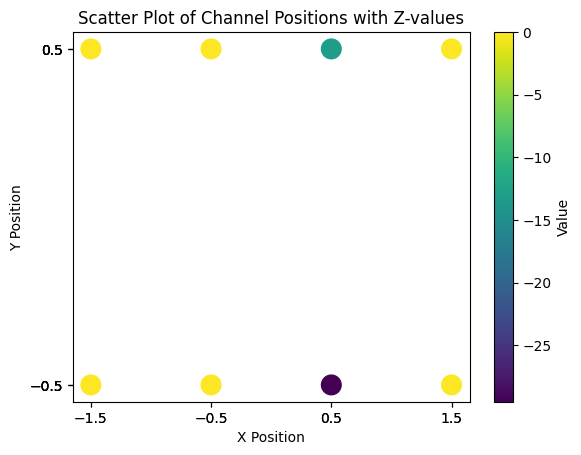

[0, 0, -7.203369140625, -10.474365234375, 0, -20.952880859375, 0, -24.892822265625]


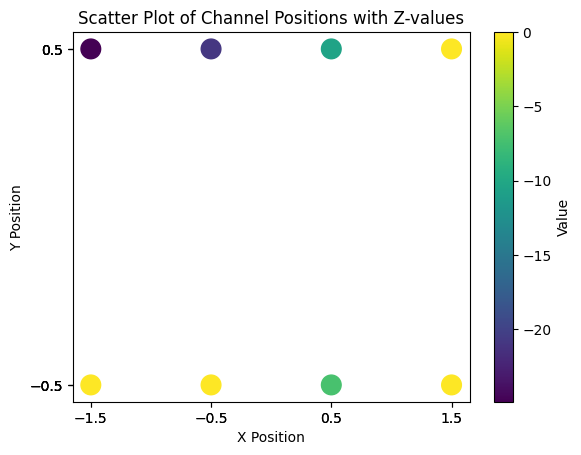

[0, 0, -14.736572265625, 0, 0, -30.323974609375, -8.5654296875, -8.146240234375]


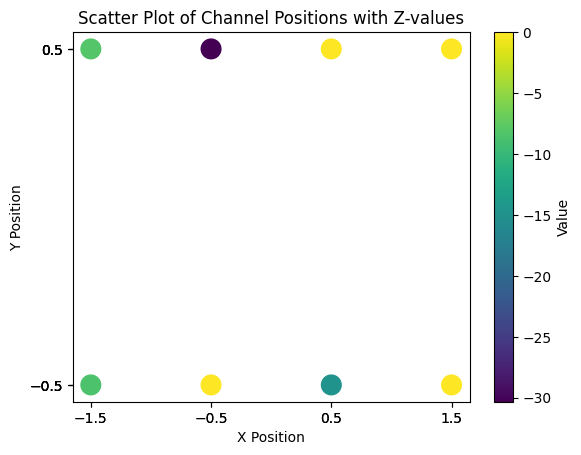

[0, 0, -13.091552734375, 0, 0, -28.9619140625, 0, 0]


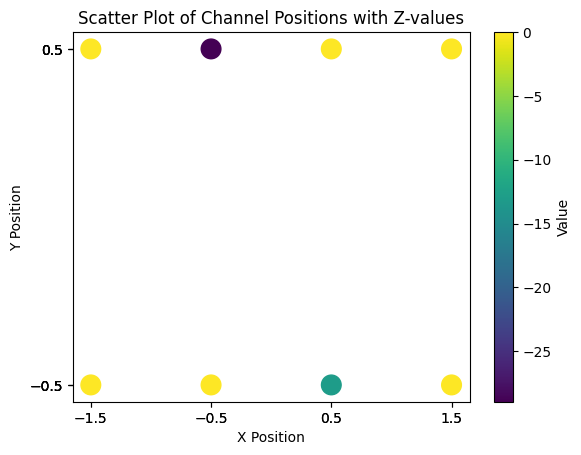

In [42]:
ROI_L = 200
ROI_H = 500
multiplicity  = {}
for event_num,(event_str,data) in tqdm(enumerate(events.items()),desc='Event'):
    #For each event:
    if event_num not in multiplicity:
        multiplicity.update({event_num:{"multi":0}})
    for channel_num,(channel_str,waveform) in enumerate(data.items()):
        if(channel_num==16 or channel_num==17):
            continue

        p,ph = find_peaks(-waveform[ROI_L:ROI_H],distance=10,height=7)
        p = p + ROI_L
        ph = -ph["peak_heights"] 

        if len(p)>0:
            pulse_present = True
        else:
            pulse_present = False

        if pulse_present == True:
            multiplicity[event_num].update({channel_num:np.sum(ph)})
            multiplicity[event_num]["multi"] += 1
        else:
            multiplicity[event_num].update({channel_num:0})

#pprint.pprint(multiplicity)

# charges = [[],[]]
# for event,channelmap in multiplicity.items():
#     for channel,charge in channelmap.items():
#         charges[0].append(channel)
#         charges[1].append(-charge)

# plt.hist2d(charges[0],charges[1],bins=(16,100),range=[[0,16],[0,100]],cmap='viridis')
# plt.ylim([0,40])
# plt.colorbar()

xl = [1.5,1.5,0.5,0.5,-0.5,-0.5,-1.5,-1.5]
yl = [-1/2,1/2,-1/2,1/2,-1/2,1/2,-1/2,1/2]

for event_num,data in multiplicity.items():
    zl = []
    if data["multi"]>=3:
        for channel,mux in data.items():
            if channel != 'multi':
                if channel<8:
                    zl.append(mux)

        print(zl)

        # Create a scatter plot with color-coded points based on z values
        plt.scatter(xl, yl, c=zl, cmap='viridis', s=200)
        plt.colorbar(label='Value')
        plt.xlabel('X Position')
        plt.ylabel('Y Position')
        plt.title('Scatter Plot of Channel Positions with Z-values')
        plt.xticks(xl)
        plt.yticks(yl)

        plt.show()

In [41]:
whos

Variable           Type                 Data/Info
-------------------------------------------------
ROI_H              int                  500
ROI_L              int                  200
X                  ndarray              8x8: 64 elems, type `float64`, 512 bytes
Y                  ndarray              8x8: 64 elems, type `int32`, 256 bytes
Z                  ndarray              2x4: 8 elems, type `float64`, 64 bytes
branchnames        list                 n=18
channel            int                  15
channel_num        int                  17
channel_str        str                  Trigger_data_g1
channelmap         dict                 n=17
charge             int                  10
charges            list                 n=2
curve_fit          function             <function curve_fit at 0x000001BD732FCEE0>
data               dict                 n=17
event              int                  4999
event_num          int                  499
event_str          str               